<a href="https://colab.research.google.com/github/eduardo-illueca/icg-project/blob/main/ReBeat_full_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Descarga de datos

In [ ]:
!mkdir /content/RawData/
!wget -q https://zenodo.org/records/4725433/files/01_RawData.zip?download=1 -O /content/RawData/01_RawData.zip
!unzip -qo /content/RawData/01_RawData.zip -d /content/RawData/

!mkdir /content/FilteredData/
!wget -q https://zenodo.org/records/4725433/files/02_FilteredData.zip?download=1 -O /content/FilteredData/02_FilteredData.zip
!unzip -qo /content//FilteredData/02_FilteredData.zip -d /content//FilteredData/

!mkdir /content/Annotations/
!wget -q https://zenodo.org/records/4725433/files/03_ExpertAnnotations.zip?download=1 -O /content/Annotations/02_FilteredData.zip
!unzip -qo /content/Annotations/02_FilteredData.zip -d /content/Annotations/

###Algoritmo general

In [ ]:
pip install neurokit2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 696.5/696.5 kB 16.0 MB/s eta 0:00:00


Vamos a modificar el código para que se realice sobre el ICG anotado y así podamos visualizar los puntos característicos B, C , X, O; y además, vamos a hacer el código más robusto para que funcione bien cuando se trate con los paciente 5 y 16 en estado CW ya que como se especifica en la información proporcionada por ReBeat no se tienen anotaciones en estos dos casos.

In [ ]:
import scipy.io as sio
import numpy as np
import pandas as pd
import neurokit2 as nk
import os
import matplotlib.pyplot as plt

# Parámetros
fs = 250
pre_r = int(0.15 * fs)
post_r = int(0.6 * fs)
conditions = ['CW', 'BL']
num_patients = 24

# Lista para almacenar segmentos
all_segments = []

for patient_id in range(1, num_patients + 1):
    for condition in conditions:
        try:
            # Rutas
            path_filtered = f'/content/FilteredData/FilteredData_Subject_{patient_id}_task_{condition}.mat'
            path_annotation = f'/content/Annotations/Annotat_Subject_{patient_id}_task_{condition}.mat'

            # Comprobar si los archivos existen
            if not os.path.exists(path_filtered):
                print(f"Archivo filtrado NO encontrado: {path_filtered}")
                continue
            if not os.path.exists(path_annotation):
                print(f"Archivo de anotaciones NO encontrado (pero no crítico): {path_annotation}")
                #Este paso se realiza para que CW con los pacientes 5 y 16 sea igual de robusto.

            # Cargar ECG y ICG filtrados
            data_filtered = sio.loadmat(path_filtered)
            ecg_filtered = data_filtered['ECG'].flatten().astype(np.float64)
            icg_filtered = data_filtered['ICG'].flatten().astype(np.float64)

            # Cargar anotaciones si existen (por si se quieren usar más adelante)
            if os.path.exists(path_annotation):
                annotation = sio.loadmat(path_annotation)
                annotations = annotation['annotPoints']
                B, C, X, O = annotations[:, 0], annotations[:, 1], annotations[:, 2], annotations[:, 3]

            # Procesar ECG para encontrar picos R
            ecg_signals, info = nk.ecg_process(ecg_filtered, sampling_rate=fs)
            r_peaks = info["ECG_R_Peaks"]

            # Segmentación de ICG alrededor de picos R
            for i, r_peak in enumerate(r_peaks):
                start_idx = r_peak - pre_r
                end_idx = r_peak + post_r
                if start_idx >= 0 and end_idx < len(icg_filtered):
                    segment = icg_filtered[start_idx:end_idx]
                    # Normalizar en amplitud (valor absoluto máximo igual a 1)
                    max_amplitude = np.max(np.abs(segment))
                    if max_amplitude == 0:  # Evitar división por cero
                        max_amplitude = 1
                    segment_norm = segment / max_amplitude

                    all_segments.append({
                        'Segment': segment_norm,
                        'PatientID': patient_id,
                        'BeatNumber': i + 1,
                        'Condition': condition
                    })

        except Exception as e:
            print(f"Error con paciente {patient_id}, condición {condition}: {e}")

# Crear DataFrame
df_segments = pd.DataFrame(all_segments)

#Para poder abrirlo en excel y ver qué forma tiene.
df_segments.to_csv("icg_segments_all.csv", index=False)


Archivo de anotaciones NO encontrado (pero no crítico): /content/Annotations/Annotat_Subject_5_task_CW.mat
Archivo de anotaciones NO encontrado (pero no crítico): /content/Annotations/Annotat_Subject_16_task_CW.mat


/usr/local/lib/python3.11/dist-packages/scipy/signal/_spectral_py.py:790: UserWarning: nperseg = 256 is greater than input length  = 187, using nperseg = 187
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,


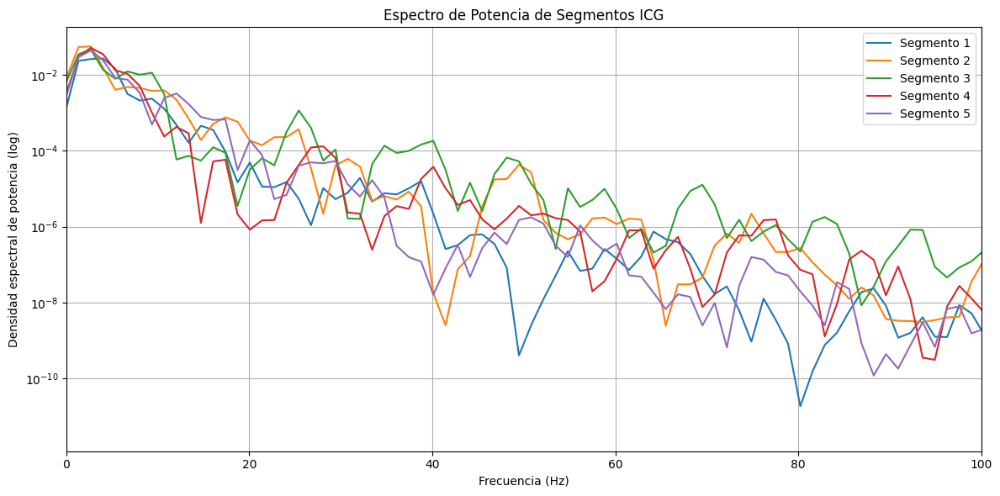

In [ ]:
from scipy.signal import welch
import random

def plot_icg_spectra(df, fs=250, n_segments=5, freq_max=100):
    """
    Selecciona segmentos aleatorios y muestra su espectro de potencia.

    Args:
        df (pd.DataFrame): DataFrame con columna 'Segment'.
        fs (int): Frecuencia de muestreo.
        n_segments (int): Número de segmentos a mostrar.
        freq_max (float): Máxima frecuencia a mostrar en Hz.
    """
    # Seleccionar filas aleatorias
    sampled_segments = df.sample(n=n_segments, random_state=42)

    plt.figure(figsize=(12, 6))
    for i, row in enumerate(sampled_segments.itertuples()):
        segment = row.Segment
        # Asegurar que es array de tipo float
        if isinstance(segment, list):  # Por si CSV lo carga como lista
            segment = np.array(segment, dtype=np.float64)
        # Calcular espectro con Welch
        freqs, psd = welch(segment, fs=fs, nperseg=256)
        plt.semilogy(freqs, psd, label=f'Segmento {i+1}')

    plt.title('Espectro de Potencia de Segmentos ICG')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Densidad espectral de potencia (log)')
    plt.xlim(0, freq_max)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Llamar a la función
plot_icg_spectra(df_segments, fs=fs, n_segments=5)

Se ha seleccionado segmentos aleatorios y se ha visto que su espectro en potencia presenta componentes frecuenciales muy elevadas que pueden corresponder con ruido en lugar de informacion útil del icg. Es por ello que sobre la señal ya filtrada obtenida se ha aplicado un filtrado paso banda de 0.5 a 20 Hz que posibilita que únicamente se quede con el rango de frecuencias deseado.

In [ ]:
import scipy.io as sio
import numpy as np
import pandas as pd
import neurokit2 as nk
import os
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt  # <- Nuevo

# Parámetros
fs = 250
lowcut = 0.5
highcut = 20
pre_r = int(0.15 * fs)
post_r = int(0.6 * fs)
conditions = ['CW', 'BL']
num_patients = 24

# Función para filtro pasa banda Butterworth
def bandpass_filter(signal, fs, lowcut, highcut, order=4):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    filtered_signal = filtfilt(b, a, signal)
    return filtered_signal

# Lista para almacenar segmentos
all_segments = []

for patient_id in range(1, num_patients + 1):
    for condition in conditions:
        try:
            # Rutas
            path_filtered = f'/content/FilteredData/FilteredData_Subject_{patient_id}_task_{condition}.mat'
            path_annotation = f'/content/Annotations/Annotat_Subject_{patient_id}_task_{condition}.mat'

            if not os.path.exists(path_filtered):
                print(f"Archivo filtrado NO encontrado: {path_filtered}")
                continue
            if not os.path.exists(path_annotation):
                print(f"Archivo de anotaciones NO encontrado (pero no crítico): {path_annotation}")

            # Cargar ECG e ICG
            data_filtered = sio.loadmat(path_filtered)
            ecg_filtered = data_filtered['ECG'].flatten().astype(np.float64)
            icg_filtered = data_filtered['ICG'].flatten().astype(np.float64)

            # Cargar anotaciones si existen
            if os.path.exists(path_annotation):
                annotation = sio.loadmat(path_annotation)
                annotations = annotation['annotPoints']
                B, C, X, O = annotations[:, 0], annotations[:, 1], annotations[:, 2], annotations[:, 3]

            # Detección de picos R
            ecg_signals, info = nk.ecg_process(ecg_filtered, sampling_rate=fs)
            r_peaks = info["ECG_R_Peaks"]

            # Segmentación de ICG
            for i, r_peak in enumerate(r_peaks):
                start_idx = r_peak - pre_r
                end_idx = r_peak + post_r
                if start_idx >= 0 and end_idx < len(icg_filtered):
                    segment = icg_filtered[start_idx:end_idx]

                    # 🟡 Aplicar filtro pasa banda
                    segment_filtered = bandpass_filter(segment, fs, lowcut, highcut)

                    # 🔵 Normalizar (amplitud máxima = 1)
                    max_amplitude = np.max(np.abs(segment_filtered))
                    if max_amplitude == 0:
                        max_amplitude = 1
                    segment_norm = segment_filtered / max_amplitude

                    all_segments.append({
                        'Segment': segment_norm,
                        'PatientID': patient_id,
                        'BeatNumber': i + 1,
                        'Condition': condition
                    })

        except Exception as e:
            print(f"Error con paciente {patient_id}, condición {condition}: {e}")

# Crear DataFrame
df_segments = pd.DataFrame(all_segments)
df_segments.to_csv("icg_segments_all.csv", index=False)


Archivo de anotaciones NO encontrado (pero no crítico): /content/Annotations/Annotat_Subject_5_task_CW.mat
Archivo de anotaciones NO encontrado (pero no crítico): /content/Annotations/Annotat_Subject_16_task_CW.mat


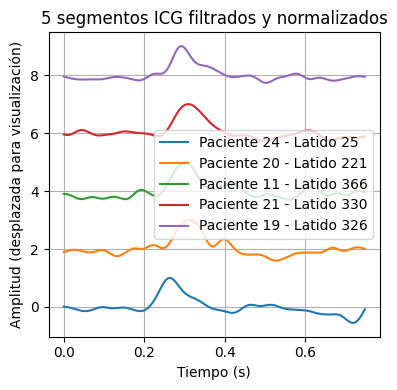

In [ ]:
import matplotlib.pyplot as plt
import random

def plot_random_icg_segments(df, fs=250, num_signals=5):
    """
    Muestra num_signals segmentos ICG aleatorios del DataFrame.

    Parámetros:
    - df: DataFrame con columna 'Segment' que contiene arrays de segmentos.
    - fs: Frecuencia de muestreo (Hz).
    - num_signals: Número de señales a graficar.
    """
    selected = df.sample(n=num_signals, random_state=42)  # Mismo resultado si se ejecuta varias veces
    time = np.linspace(0, len(selected.iloc[0]['Segment']) / fs, len(selected.iloc[0]['Segment']))

    plt.figure(figsize=(4, 4))
    for i, (_, row) in enumerate(selected.iterrows()):
        plt.plot(time, row['Segment'] + i * 2, label=f"Paciente {row['PatientID']} - Latido {row['BeatNumber']}")

    plt.title(f'{num_signals} segmentos ICG filtrados y normalizados')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud (desplazada para visualización)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
plot_random_icg_segments(df_segments)


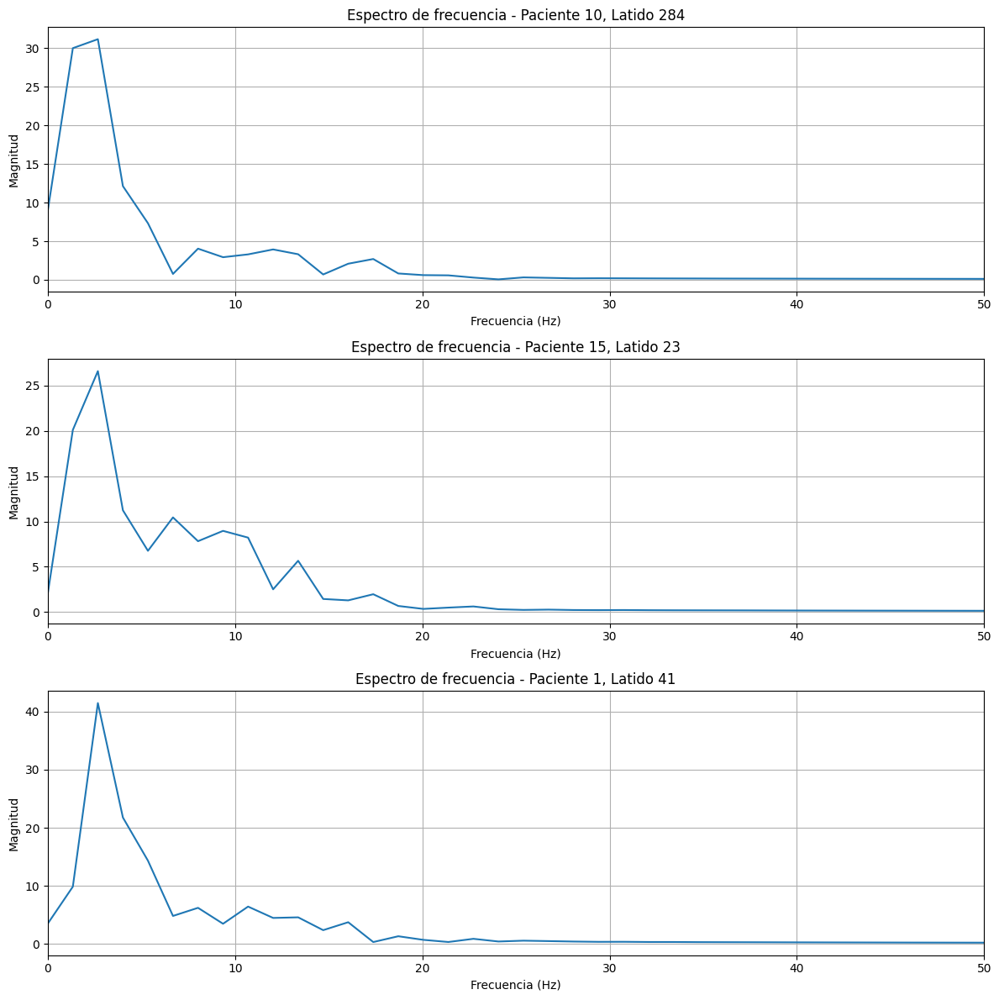

In [ ]:
def plot_fft_of_segments(df, fs=250, num_signals=3):
    selected = df.sample(n=num_signals, random_state=1)
    plt.figure(figsize=(12, 4 * num_signals))

    for i, (_, row) in enumerate(selected.iterrows()):
        signal = row['Segment']
        N = len(signal)
        freq = np.fft.rfftfreq(N, d=1/fs)
        fft_vals = np.abs(np.fft.rfft(signal))

        plt.subplot(num_signals, 1, i + 1)
        plt.plot(freq, fft_vals)
        plt.title(f'Espectro de frecuencia - Paciente {row["PatientID"]}, Latido {row["BeatNumber"]}')
        plt.xlabel('Frecuencia (Hz)')
        plt.ylabel('Magnitud')
        plt.grid(True)
        plt.xlim(0, 50)  # Nos centramos en el rango de interés

    plt.tight_layout()
    plt.show()
plot_fft_of_segments(df_segments)


Ahora ya podemos observar que el rango de frecuencias se encuentra entre 0.5 y 20 Hz.

A continuación queremos crear un segundo dataset que a diferencia del anterior tendrá todos los subcomplejos a excepción del subcomplejo u. Esto se realiza para que posteriormente al realizar el clustering, aquellos subcomplejos u no introduzcan ruido ya que no proporcionan ninguna información útil sobre el icg.

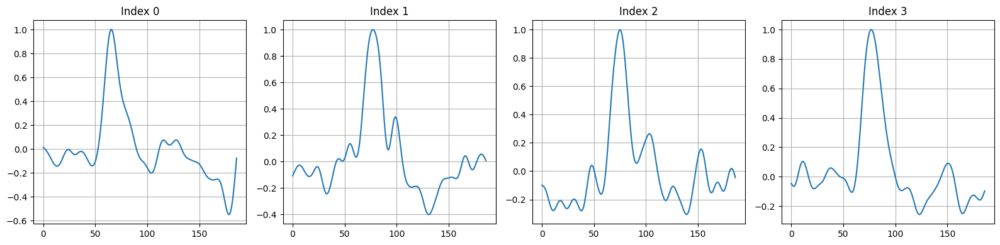

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


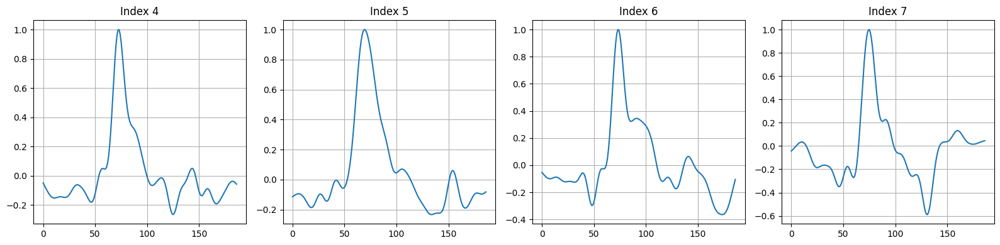

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


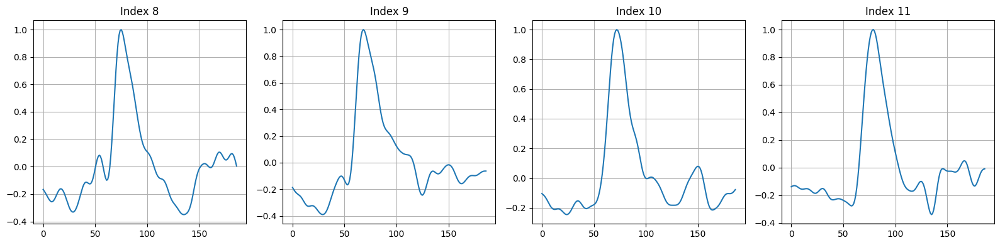

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


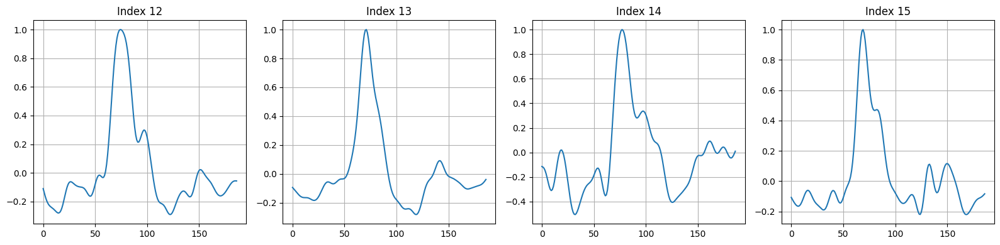

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


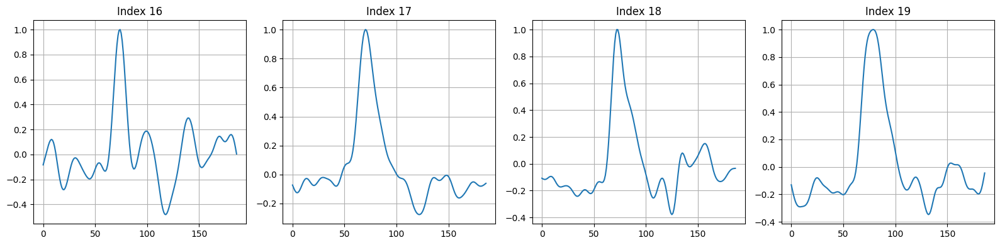

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


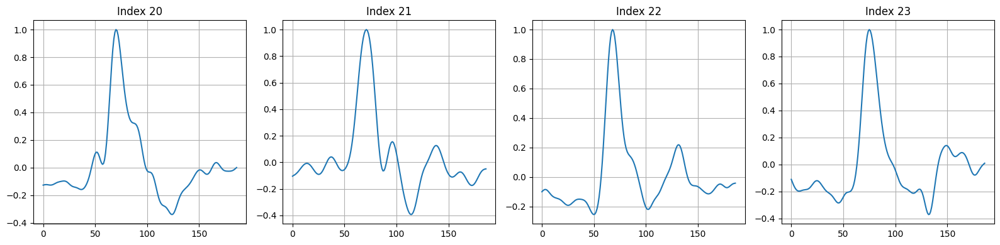

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


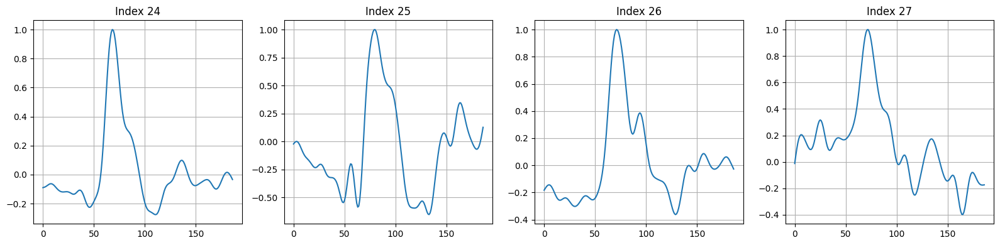

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


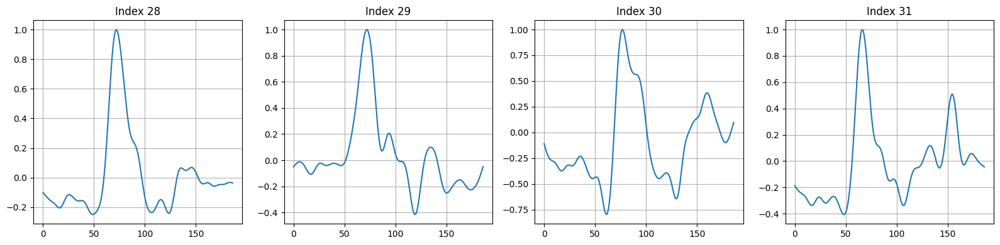

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


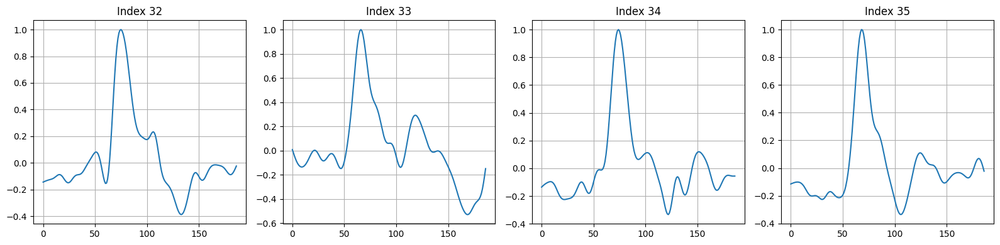

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


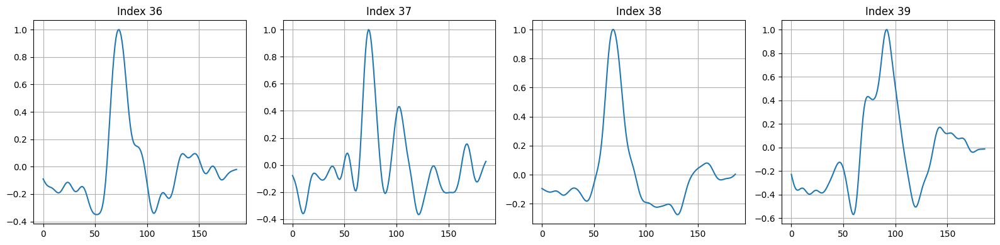

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V U V V
Etiquetas: V U V V


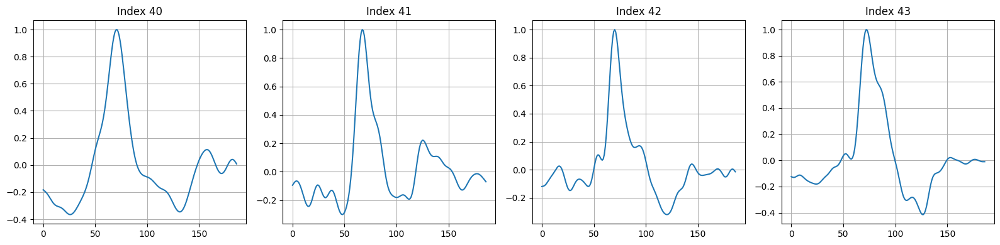

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


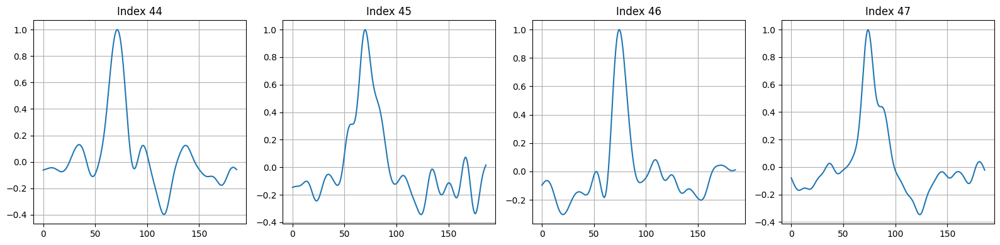

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


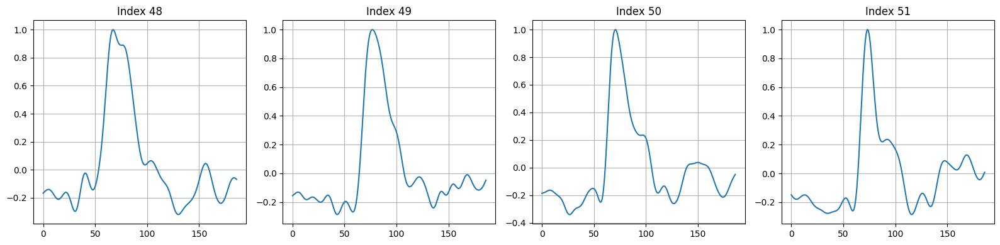

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


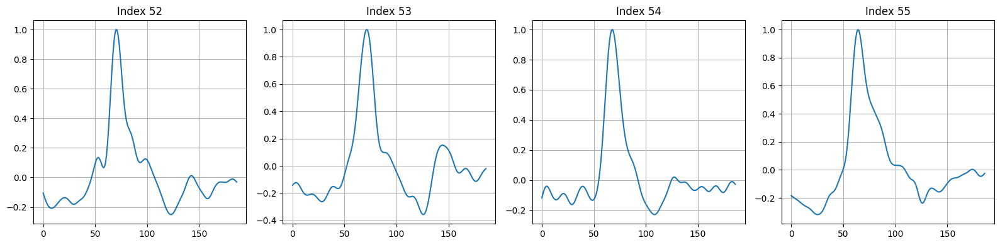

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


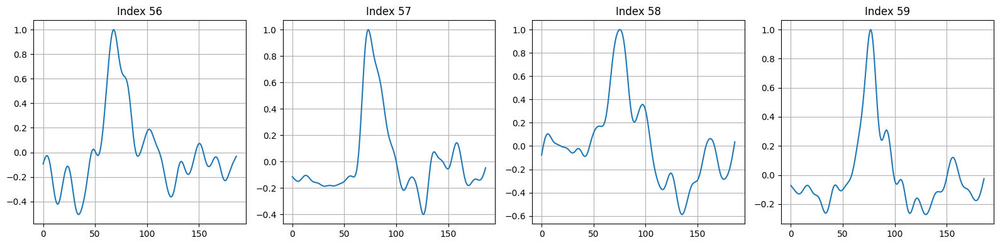

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


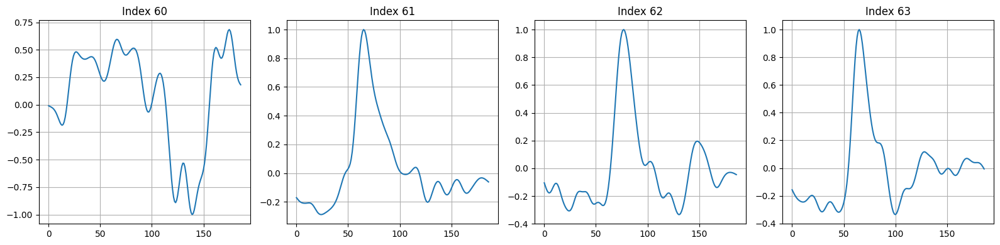

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...U V V V
Etiquetas: U V V V


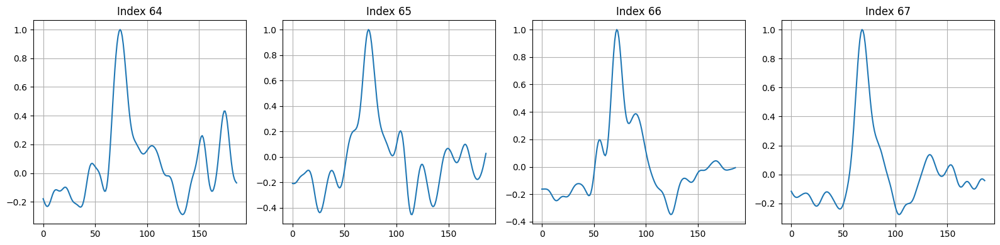

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


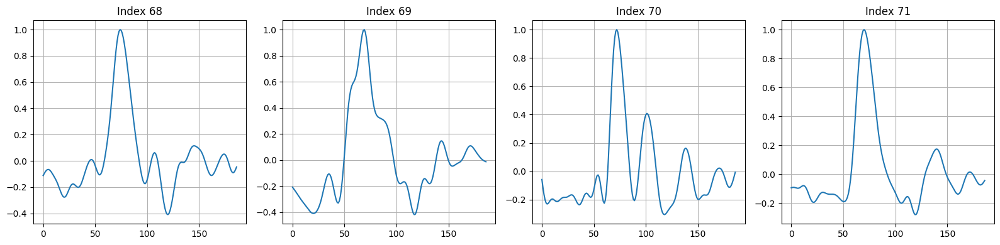

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V U V
Etiquetas: V V U V


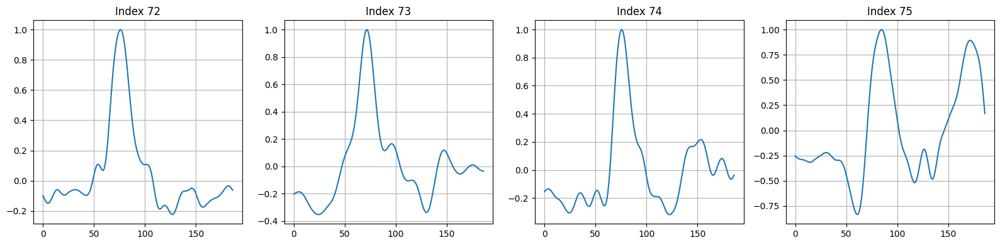

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V U
Etiquetas: V V V U


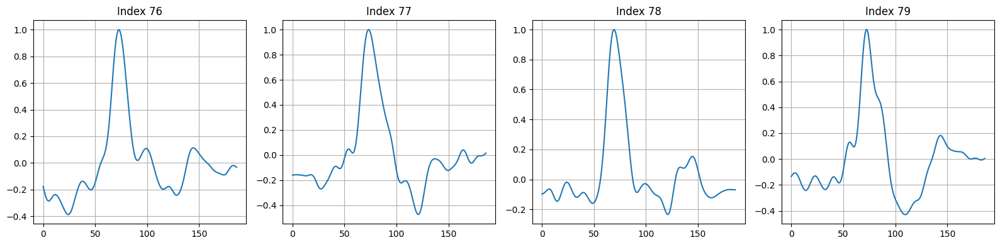

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


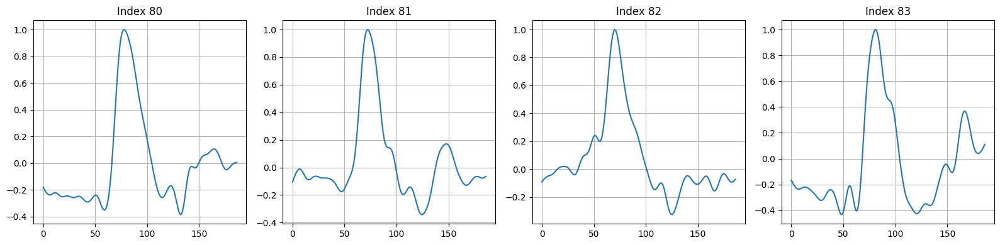

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


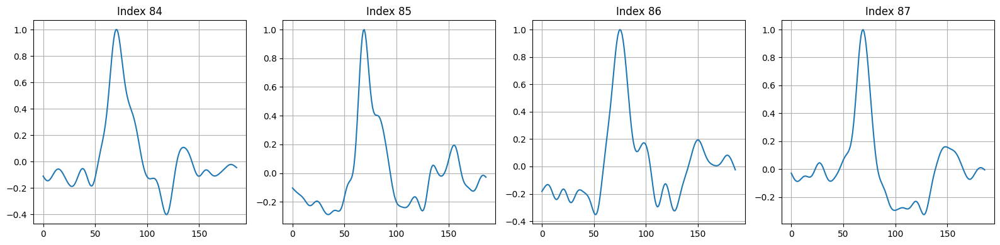

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


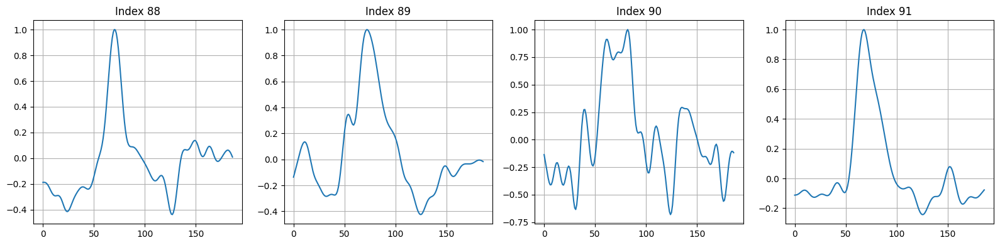

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V U V
Etiquetas: V V U V


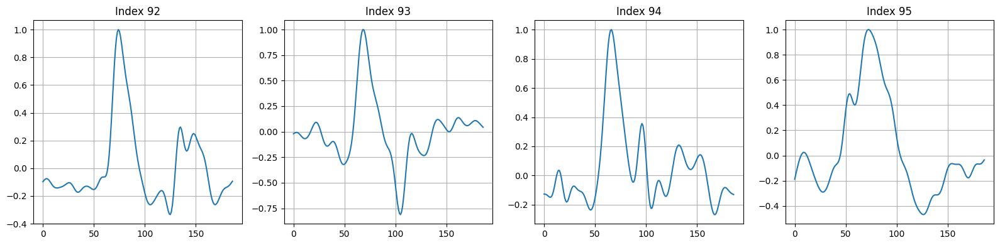

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


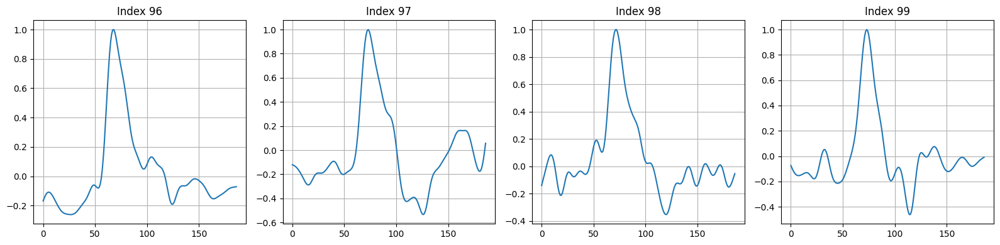

Introduce 4 etiquetas separadas por espacio (V para válido, U para inválido).


Cuando hayas ingresado las etiquetas, presiona Enter para continuar...V V V V
Etiquetas: V V V V


In [ ]:
import random
import matplotlib.pyplot as plt
from IPython.display import display, HTML

# Número de muestras para etiquetar manualmente
num_samples = 100
batch_size = 4    # Cuántos gráficos mostramos a la vez

# Seleccionar segmentos aleatorios
sampled_df = df_segments.sample(n=num_samples, random_state=42).reset_index(drop=True)

# Lista para almacenar las etiquetas
labels = []

# Recorrer en batches
for batch_start in range(0, num_samples, batch_size):
    batch_end = min(batch_start + batch_size, num_samples)
    batch = sampled_df.iloc[batch_start:batch_end]

    # Crear subgráficos para mostrar los segmentos
    fig, axs = plt.subplots(1, len(batch), figsize=(16, 4))

    if len(batch) == 1:
        axs = [axs]  # Para que axs sea siempre iterable

    for ax, (_, row) in zip(axs, batch.iterrows()):
        segment = row['Segment']
        ax.plot(segment)
        ax.set_title(f"Index {row.name}")
        ax.grid(True)

    plt.tight_layout()
    plt.show()

    # Mostrar mensaje de solicitud de etiquetas
    print(f"Introduce {len(batch)} etiquetas separadas por espacio (V para válido, U para inválido).")

    # Esperar que el usuario ingrese etiquetas en la siguiente celda
    display(HTML(f'<b>Por favor ingresa las etiquetas para los segmentos mostrados (separadas por espacios):</b>'))

    # Pausar para permitir que el usuario ingrese las etiquetas en la siguiente celda
    input("Cuando hayas ingresado las etiquetas, presiona Enter para continuar...")

    # Solicitar etiquetas después de la visualización
    while True:
        batch_labels = input("Etiquetas: ").upper().split()

        if len(batch_labels) == len(batch) and all(l in ['V', 'U'] for l in batch_labels):
            break
        else:
            print("Error: debes introducir exactamente una etiqueta V o U por cada segmento mostrado.")

    labels.extend(batch_labels)

# Añadir las etiquetas al DataFrame
sampled_df['Label'] = labels

# Guardar el DataFrame con las etiquetas
sampled_df.to_csv("icg_labeled_V_U.csv", index=False)


Entrenar un modelo Random Forest dondde a partir de unas características extraídas de cada uno de los segmentos y las etiquetas proporcionadas anteriormente sea capaz de clasificar automáticamente cada uno de los segmentos.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from scipy.stats import skew, kurtosis
import numpy as np

# Función para extraer características simples de cada segmento
def extract_features(segments):
    features = []
    for segment in segments:
        mean = np.mean(segment)
        std = np.std(segment)
        max_val = np.max(segment)
        min_val = np.min(segment)
        skewness = skew(segment)
        kurt = kurtosis(segment)
        features.append([mean, std, max_val, min_val, skewness, kurt])
    return np.array(features)

# Extraer características del df que yo he clasificado como U o V
X = extract_features(sampled_df['Segment'])
y = sampled_df['Label'].apply(lambda x: 1 if x == 'V' else 0)  # Convertir 'V' a 1 y 'U' a 0

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Entrenar el modelo Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42, class_weight='balanced')
rf.fit(X_train, y_train)

# Evaluar el modelo
y_pred = rf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.93      1.00      0.97        28

    accuracy                           0.93        30
   macro avg       0.47      0.50      0.48        30
weighted avg       0.87      0.93      0.90        30



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Asumimos que df_segments contiene todos los segmentos restantes
#Extraemos características de todos los segmentos del df
X_all = extract_features(df_segments['Segment'])

# Predecir etiquetas para el resto de los segmentos
y_all_pred = rf.predict(X_all)

# Convertir las predicciones de 0 y 1 de nuevo a 'V' y 'U'
df_segments['Predicted_Label'] = ['V' if label == 1 else 'U' for label in y_all_pred]

# Guardar el DataFrame con las predicciones
df_segments.to_csv("icg_segments_with_predictions.csv", index=False)


Gráfico circular para ver la distribución de segmentos U y V

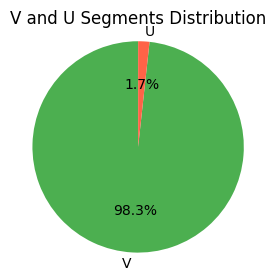

In [ ]:
# Contar la cantidad de segmentos de tipo V y U
label_counts = df_segments['Predicted_Label'].value_counts()

# Graficar distribución de segmentos V y U
plt.figure(figsize=(3, 3))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=90, colors=['#4CAF50', '#FF6347'])
plt.title("V and U Segments Distribution")
plt.axis('equal')  # Asegura que el gráfico sea un círculo
plt.show()


Código para visualizar varios segmentos U y verificar:

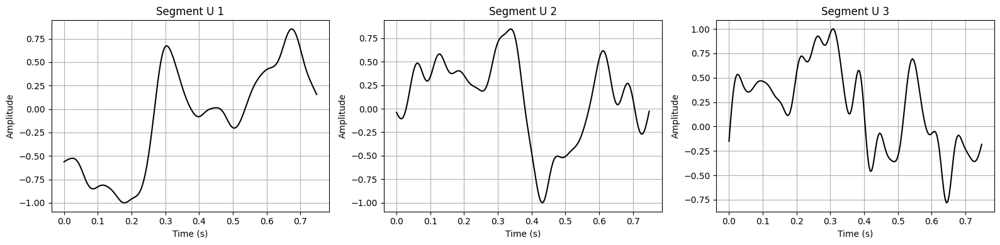

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Filtrar los segmentos clasificados como 'U'
u_segments = df_segments[df_segments['Predicted_Label'] == 'U']

# Seleccionar un número aleatorio de segmentos 'U' para visualizar
num_segments_to_show = 3
random_u_segments = u_segments.sample(n=num_segments_to_show, random_state=42)

# Graficar los segmentos 'U' seleccionados
plt.figure(figsize=(16, 4))

for i, (_, row) in enumerate(random_u_segments.iterrows()):
    segment = np.array(row['Segment'])
    time_vector = np.linspace(0, len(segment) / fs, len(segment))  # Tiempo en segundos

    plt.subplot(1, num_segments_to_show, i + 1)
    plt.plot(time_vector, segment, color='black')
    plt.title(f"Segment U {i+1}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)

plt.tight_layout()
plt.show()


Bien, ahora tenemos que la tabla icg_segments_with_predictions incluye una columna nueva que indica si los segmentos son válidos (V) o no válidos (subcomplejo u). Finalmente, el dataframe que emplearemos en el código que sigue a continuación no será el entero sino únicamente el que en la columan de predicción tenga una V.

In [ ]:
# Filtrar los segmentos clasificados como 'V' (válidos)
v_segments = df_segments[df_segments['Predicted_Label'] == 'V']
#A partir de ahora he de emplear esto apra referirme a los segmentos de icg filtrados (sin los subcomplejos u)

# Guardar los segmentos V en un nuevo archivo CSV
v_segments.to_csv("icg_segments_validos.csv", index=False)

print("Archivo 'icg_segments_validos.csv' guardado exitosamente.")

Archivo 'icg_segments_validos.csv' guardado exitosamente.


###Algoritmo de delineación de puntos característicos:

*Para comprobar que el algoritmo está ubicando el punto en el lugar óptimo he implementado un plot de un segmento random.

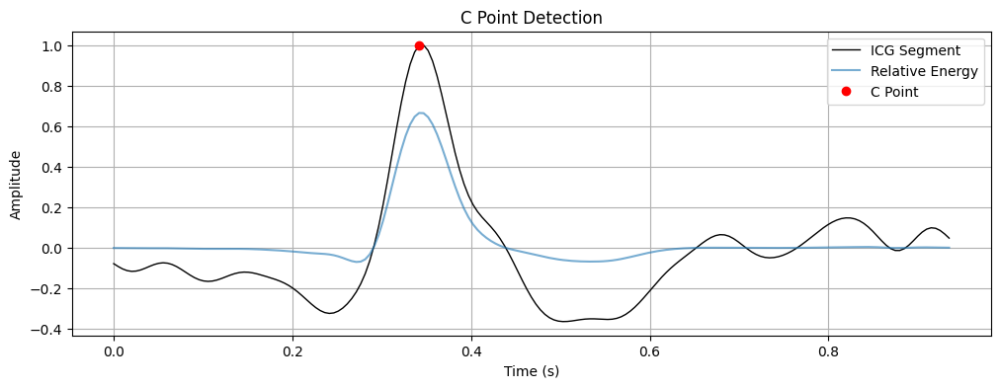

In [ ]:
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt

#C-POINT DETECTION

def relative_energy(signal, fs, long_win=0.95, short_win=0.14):
    long_len = int(long_win * fs)
    short_len = int(short_win * fs)
    Xre = np.zeros_like(signal)

    for n in range(len(signal)):
        i1 = max(0, n - long_len // 2)
        i2 = min(len(signal), n + long_len // 2)
        long_energy = np.sum(signal[i1:i2] ** 2)

        j1 = max(0, n - short_len // 2)
        j2 = min(len(signal), n + short_len // 2)
        short_energy = np.sum(signal[j1:j2] ** 2)

        if long_energy != 0:
            c = short_energy / long_energy
            Xre[n] = signal[n] * c
    return Xre

def detect_C_peaks(icg_filtered, fs):
    Xre = relative_energy(icg_filtered, fs)

    # Thresholds
    sorted_peaks = np.sort(Xre[Xre > np.mean(Xre)])
    maxval = sorted_peaks[-2] if len(sorted_peaks) > 1 and sorted_peaks[-2] > np.mean(Xre) else sorted_peaks[-1]

    Thr_max = 0.2 * maxval
    Thr_min = 0.02 * maxval

    C_peaks = []
    active = False
    start_idx = 0

    for i in range(1, len(Xre)):
        if not active and Xre[i] > Thr_max:
            active = True
            start_idx = i
        elif active and Xre[i] < Thr_min:
            end_idx = i
            peak_idx = start_idx + np.argmax(Xre[start_idx:end_idx])
            if len(C_peaks) == 0 or (peak_idx - C_peaks[-1]) > int(0.25 * fs):
                C_peaks.append(peak_idx)
            active = False

    # Filtrar según intervalos C-C
    final_C_peaks = []
    for i, p in enumerate(C_peaks):
        if i < 5:
            final_C_peaks.append(p)
        else:
            prev_cc = np.diff(final_C_peaks[-5:])
            if len(prev_cc) == 5:
                avg_cc = np.mean(prev_cc)
                if (p - final_C_peaks[-1]) > 1.7 * avg_cc:
                    final_C_peaks.append(p)
            else:
                final_C_peaks.append(p)

    return np.array(final_C_peaks), Xre

#Cogemos un segmento de icg cuya etiqueta sea V
icg_segment = v_segments['Segment'].iloc[16000]
fs=200
C_peaks, Xre = detect_C_peaks(icg_segment, fs)

#Definimos el tiempo para representar en función del tiempo en lugar de muestras
tiempo = np.linspace(0, len(icg_segment)/fs, len(icg_segment))

# Representación
plt.figure(figsize=(12, 4))
plt.plot(tiempo, icg_segment, label="ICG Segment", color='black', linewidth=1)
plt.plot(tiempo, Xre, label="Relative Energy", alpha=0.6)
plt.plot(tiempo[C_peaks], icg_segment[C_peaks], 'ro', label="C Point")
plt.legend()
plt.title("C Point Detection")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


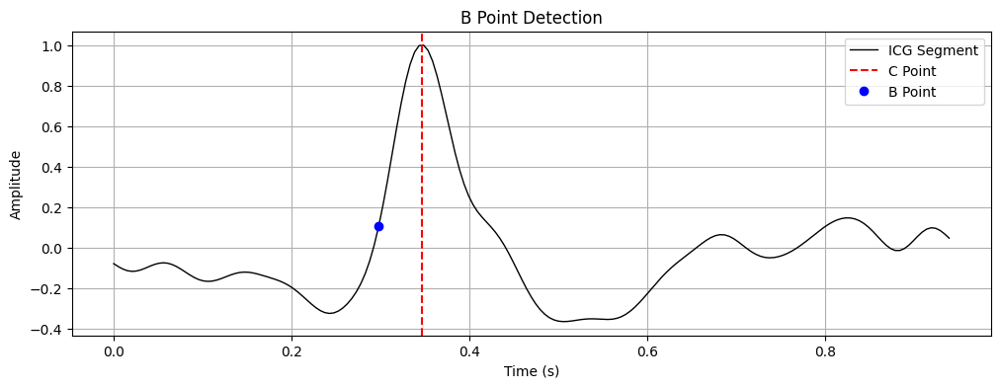

In [ ]:
#B-POINT DETECTION
def find_B_point(icg_segment, Cpos, fs, Afrac=0.2, Bslope1=0.11, Bslope2=0.08):
    # Paso 1: calcular límites de la ventana de búsqueda
    BlimL = max(0, int(Cpos - 0.1 * fs))  # 80 ms antes del C
    C_amp = icg_segment[Cpos]

    # Buscar BlimR: el índice más cercano a la izquierda donde la señal < Afrac * C_amp
    for i in range(Cpos - 1, BlimL, -1):
        if icg_segment[i] <= Afrac * C_amp:
            BlimR = i
            break
    else:
        BlimR = BlimL  # Si no se encuentra, que sea igual al límite inferior

    # Derivada primera (pendiente) de la señal
    slope = np.gradient(icg_segment)

    # Paso 2: búsqueda con Bslope1
    for i in range(BlimR, BlimL, -1):
        if (i > 0 and (icg_segment[i] < icg_segment[i-1])) or abs(slope[i]) > Bslope1:
            return i

    # Paso 3: búsqueda con Bslope2
    for i in range(BlimR, BlimL, -1):
        if abs(slope[i]) > Bslope2:
            return i

    # Paso 4: si no se encuentra, retornar el mínimo de la ventana
    search_region = icg_segment[BlimL:BlimR+1]
    return BlimL + np.argmin(search_region)

B_points = []
for Cpos in C_peaks:
    B_idx = find_B_point(icg_segment, Cpos, fs)
    B_points.append(B_idx)

# Visualización
plt.figure(figsize=(12, 4))
plt.plot(tiempo, icg_segment, label="ICG Segment", color='black', linewidth=1)
plt.axvline(x=C_peaks / fs, color='red', linestyle='--', label='C Point')
#plt.plot(tiempo[C_peaks], icg_segment[C_peaks], 'ro', label="C Point")
plt.plot(tiempo[B_points], icg_segment[B_points], 'bo', label="B Point")
plt.legend()
plt.title("B Point Detection")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()


Aquí estoy teniendo un inconveniente y es que al la señal aún ser un poco ruidosa, detecta muvhos mínimos locales que realmente no son puntos X sino que son ruido. Es por ello que a continuación aplicaremos un filtro de suavizado de la señal. Además, también se han añadido otras restricciones entre X1 y X2.

<ipython-input-115-71ba8792afa6>:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  start = max(int(C_index + CXmin_samp), 0)
<ipython-input-115-71ba8792afa6>:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  end = min(int(C_index + CXmax_samp), len(icg_segment) - 1)


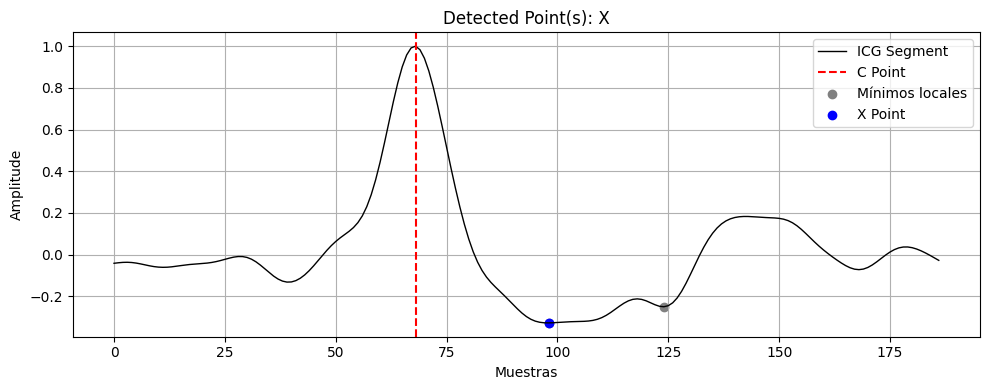

{'caso': 'X', 'X': np.int64(98)}


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema
from scipy.ndimage import gaussian_filter1d

def detectar_punto_X(icg_segment, C_index, fs, plot=False, suavizar=True):

    # 1. Definir ventana temporal (0.1s a 0.4s después de C)
    CXmin_s, CXmax_s = 0.05, 0.4
    CXmin_samp, CXmax_samp = int(fs * CXmin_s), int(fs * CXmax_s)
    start = max(int(C_index + CXmin_samp), 0)
    end = min(int(C_index + CXmax_samp), len(icg_segment) - 1)
    ventana = icg_segment[start:end]

    if len(ventana) < 3:
        return {"caso": "ninguno", "mensaje": "Ventana demasiado corta"}

    # 2. Suavizar señal si está activado
    if suavizar:
        ventana = gaussian_filter1d(ventana, sigma=1)

    # 3. Detectar mínimos locales
    min_indices = argrelextrema(ventana, np.less)[0]
    if len(min_indices) == 0:
        return {"caso": "ninguno", "mensaje": "No se detectaron mínimos locales"}

    # 4. Detectar mínimo global
    abs_min_idx = np.argmin(ventana)

    # 5. Clasificación según mínimos detectados
    if len(min_indices) == 1:
        idx = min_indices[0]
        if idx == abs_min_idx and (C_index + 0.07 <= idx <= C_index + 0.22):
            resultado = {"caso": "X1", "X1": idx}
        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    elif len(min_indices) == 2:
        # Tomar los dos primeros mínimos locales
        X1_idx = min_indices[0]
        X2_idx = min_indices[1]

        # Comparar amplitudes
        amp_diff = abs(ventana[X1_idx] - ventana[X2_idx])
        amplitud_umbral = 0.05  # Puedes ajustar este valor según tu dataset

        if ventana[X1_idx] < ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}
        elif ventana[X1_idx] > ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}
        elif ventana[X1_idx] > ventana[X2_idx]:
            resultado = {"caso": "X", "X": X2_idx}
        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    elif len(min_indices) >= 3:
        # Tomar los tres primeros mínimos locales
        X1_idx = min_indices[0]
        X2_idx = min_indices[1]
        X3_idx = min_indices[2]

        amp_diff = abs(ventana[X1_idx] - ventana[X2_idx])
        amplitud_umbral = 0.05  # Puedes ajustar este valor según tu dataset

        if ventana[X1_idx] < ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}

        elif ventana[X1_idx] > ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}

        elif ventana[X3_idx] < ventana[X2_idx]:
            resultado = {"caso": "X", "X": X3_idx}

        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    # 6. Graficar resultados
    if plot:
        plt.figure(figsize=(10, 4))
        plt.plot(icg_segment, label='ICG Segment', color='black', linewidth=1)
        plt.axvline(x=C_index, color='red', linestyle='--', label='C Point')

        # Ajustar índices locales a posición original
        min_plot_idx = min_indices + start
        plt.scatter(min_plot_idx, icg_segment[min_plot_idx], color='gray', label='Mínimos locales')

        if resultado["caso"] == "X":
            plt.scatter(resultado["X"] + start, icg_segment[resultado["X"] + start], color='blue', label='X Point')
        elif resultado["caso"] == "X1":
            plt.scatter(resultado["X1"] + start, icg_segment[resultado["X1"] + start], color='orange', label='X1 Point')
        elif resultado["caso"] == "X1_X2":
                plt.scatter(resultado["X1"] + start, icg_segment[resultado["X1"] + start],
                color='orange', label='X1 Point')
                plt.scatter(resultado["X2"] + start, icg_segment[resultado["X2"] + start],
                color='blue', label='X2 Point')
        plt.title(f"Detected Point(s): {resultado['caso']}")
        plt.xlabel("Muestras")
        plt.ylabel("Amplitude")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()


    # Ajustar índices al segmento original
    if resultado["caso"] == "X":
        resultado["X"] = resultado["X"] + start
    elif resultado["caso"] == "X1":
        resultado["X1"] = resultado["X1"] + start
    elif resultado["caso"] == "X1_X2":
        resultado["X1"] = resultado["X1"] + start
        resultado["X2"] = resultado["X2"] + start

    return resultado

segmento = v_segments['Segment'].iloc[8500]
fs = 200
C_index, _ = detect_C_peaks(segmento, fs)

resultado = detectar_punto_X(segmento, C_index, fs, plot=True)
print(resultado)

<ipython-input-117-f15b39599bb9>:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  start = max(int(C_index + CXmin_samp), 0)
<ipython-input-117-f15b39599bb9>:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  end = min(int(C_index + CXmax_samp), len(icg_segment) - 1)


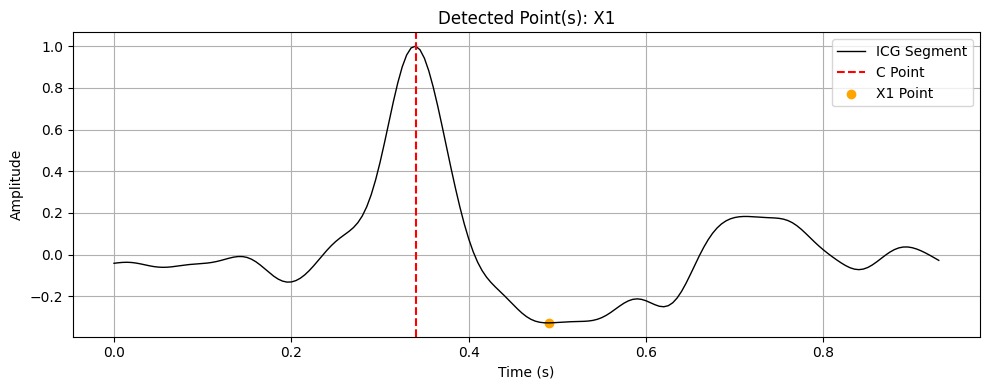

{'caso': 'X1', 'X1': np.int64(98)}


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema
from scipy.ndimage import gaussian_filter1d

def detectar_punto_X(icg_segment, C_index, fs, plot=False, suavizar=True):

    # 1. Definir ventana temporal (0.1s a 0.4s después de C)
    CXmin_s, CXmax_s = 0.05, 0.4
    CXmin_samp, CXmax_samp = int(fs * CXmin_s), int(fs * CXmax_s)
    start = max(int(C_index + CXmin_samp), 0)
    end = min(int(C_index + CXmax_samp), len(icg_segment) - 1)
    ventana = icg_segment[start:end]

    if len(ventana) < 3:
        return {"caso": "ninguno", "mensaje": "Ventana demasiado corta"}

    # 2. Suavizar señal si está activado
    if suavizar:
        ventana = gaussian_filter1d(ventana, sigma=1)

    # 3. Detectar mínimos locales
    min_indices = argrelextrema(ventana, np.less)[0]
    if len(min_indices) == 0:
        return {"caso": "ninguno", "mensaje": "No se detectaron mínimos locales"}

    # 4. Detectar mínimo global
    abs_min_idx = np.argmin(ventana)

    # 5. Clasificación según mínimos detectados
    if len(min_indices) == 1:
        idx = min_indices[0]
        if idx == abs_min_idx and (C_index + 0.07 <= idx <= C_index + 0.22):
            resultado = {"caso": "X1", "X1": idx}
        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    elif len(min_indices) == 2:
        # Tomar los dos primeros mínimos locales
        X1_idx = min_indices[0]
        X2_idx = min_indices[1]

        # Comparar amplitudes
        amp_diff = abs(ventana[X1_idx] - ventana[X2_idx])
        amplitud_umbral = 0.05  # Puedes ajustar este valor según tu dataset
        idx = min_indices[0]

        if ventana[X1_idx] < ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}

        elif idx == abs_min_idx :
            resultado = {"caso": "X1", "X1": idx}
        elif ventana[X1_idx] > ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}
        elif ventana[X1_idx] > ventana[X2_idx]:
            resultado = {"caso": "X", "X": X2_idx}
        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    elif len(min_indices) >= 3:
        # Tomar los tres primeros mínimos locales
        X1_idx = min_indices[0]
        X2_idx = min_indices[1]
        X3_idx = min_indices[2]

        amp_diff = abs(ventana[X1_idx] - ventana[X2_idx])
        amplitud_umbral = 0.05  # Puedes ajustar este valor según tu dataset
        idx = min_indices[0]

        if ventana[X1_idx] < ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}

        elif ventana[X1_idx] > ventana[X2_idx] and amp_diff <= amplitud_umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}

        elif idx == abs_min_idx :
            resultado = {"caso": "X1", "X1": idx}
        elif ventana[X3_idx] < ventana[X2_idx]:
            resultado = {"caso": "X", "X": X3_idx}

        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    # 6. Graficar resultados
    # 5. Clasificación según mínimos detectados
    # [ ... aquí tu lógica de detección ... ]

    # 🔁 Ajustar índices al segmento original ANTES de graficar
    if resultado["caso"] == "X":
        resultado["X"] = resultado["X"] + start
    elif resultado["caso"] == "X1":
        resultado["X1"] = resultado["X1"] + start
    elif resultado["caso"] == "X1_X2":
        resultado["X1"] = resultado["X1"] + start
        resultado["X2"] = resultado["X2"] + start

    # 6. Graficar resultados EN TIEMPO
    if plot:
        plt.figure(figsize=(10, 4))
        tiempo_segmento = np.arange(len(icg_segment)) / fs
        plt.plot(tiempo_segmento, icg_segment, label='ICG Segment', color='black', linewidth=1)
        plt.axvline(x=C_index / fs, color='red', linestyle='--', label='C Point')


        if resultado["caso"] == "X":
            plt.scatter(resultado["X"] / fs, icg_segment[resultado["X"]], color='blue', label='X Point')
        elif resultado["caso"] == "X1":
            plt.scatter(resultado["X1"] / fs, icg_segment[resultado["X1"]], color='orange', label='X1 Point')
        elif resultado["caso"] == "X1_X2":
            plt.scatter(resultado["X1"] / fs, icg_segment[resultado["X1"]], color='orange', label='X1 Point')
            plt.scatter(resultado["X2"] / fs, icg_segment[resultado["X2"]], color='blue', label='X2 Point')

        plt.title(f"Detected Point(s): {resultado['caso']}")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return resultado

segmento = v_segments['Segment'].iloc[8500]
fs = 200
C_index, _ = detect_C_peaks(segmento, fs)

resultado = detectar_punto_X(segmento, C_index, fs, plot=True)
print(resultado)

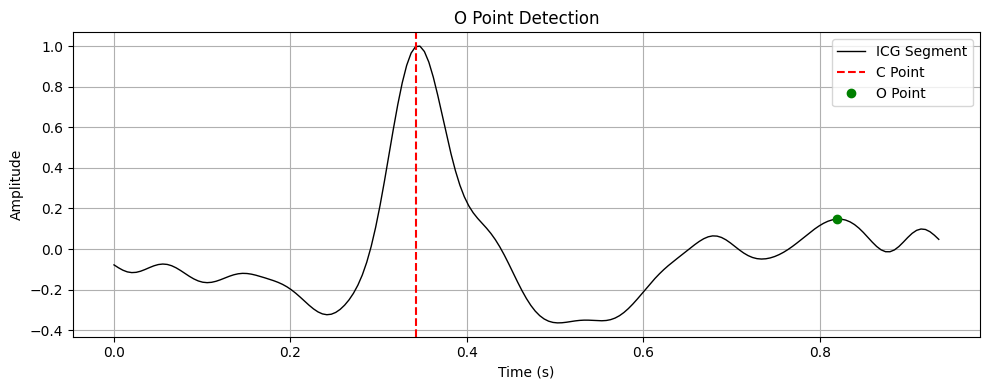

In [ ]:
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt

def detect_O_point(segment, C_index, fs):
    # Zona de búsqueda: 0.2s a 0.5s después del punto C
    start_search = C_index + int(0.2 * fs)
    end_search = C_index + int(0.5 * fs)
    end_search = min(end_search, len(segment))  # evitar salir del rango

    search_region = segment[start_search:end_search]

    if len(search_region) == 0:
        return None

    # Buscar máximos locales
    peaks, _ = signal.find_peaks(search_region)

    if len(peaks) == 0:
        return None

    # Elegir el pico de mayor amplitud
    peak_amplitudes = search_region[peaks]
    max_peak_idx = peaks[np.argmax(peak_amplitudes)]
    O_index = start_search + max_peak_idx
    return O_index

# Supongamos que tienes `C_peaks`, `icg_segment`, y `fs` definidos
if len(C_peaks) > 0:
    C_idx = C_peaks[0]
    O_idx = detect_O_point(icg_segment, C_idx, fs)

    # Representación
    tiempo = np.linspace(0, len(icg_segment) / fs, len(icg_segment))
    plt.figure(figsize=(10, 4))
    plt.plot(tiempo, icg_segment, label="ICG Segment", color='black', linewidth=1)

    # Punto C como línea discontinua roja
    plt.axvline(x=tiempo[C_idx], color='red', linestyle='--', label="C Point")

    # Punto O como marcador
    if O_idx is not None:
        plt.plot(tiempo[O_idx], icg_segment[O_idx], 'go', label="O Point")

    plt.legend()
    plt.title("O Point Detection")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


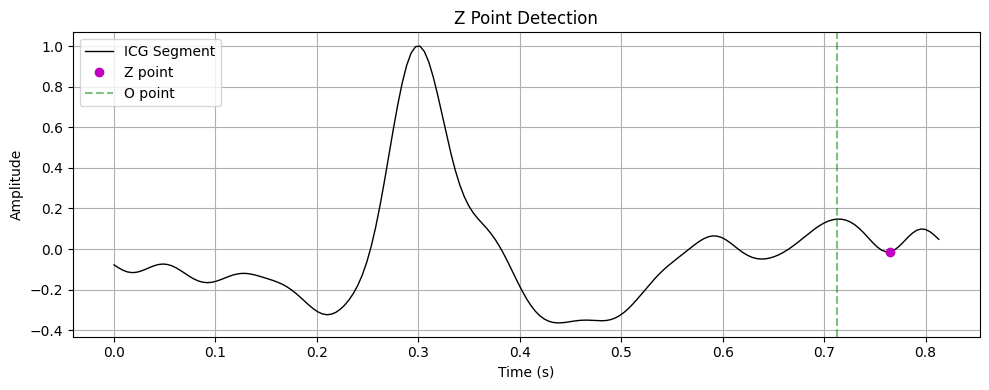

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal

def detect_Z_point(segment, O_index, fs):
    # Define search window (start just after O, up to 0.1s after)
    start_search = O_index + int(0.005 * fs)
    end_search = O_index + int(0.15 * fs)
    end_search = min(end_search, len(segment))

    # Extract search region
    search_region = segment[start_search:end_search]

    if len(search_region) == 0:
        return None

    # Invert the signal to find local minima as peaks
    inverted_region = -search_region
    peaks, _ = signal.find_peaks(inverted_region)

    if len(peaks) == 0:
        return None  # No local minima found

    # Choose the first local minimum
    Z_index = start_search + peaks[0]
    return Z_index

# Example of usage (assuming icg_segment, fs, and O_idx are defined)
Z_idx = detect_Z_point(icg_segment, O_idx, fs)

# Time vector for plotting
tiempo = np.linspace(0, len(icg_segment)/fs, len(icg_segment))

# Plotting the ICG signal with O and Z points
plt.figure(figsize=(10, 4))
plt.plot(tiempo, icg_segment, label="ICG Segment", color='black', linewidth=1,)
#plt.plot(tiempo[O_idx], icg_segment[O_idx], 'go', label="O point")
if Z_idx is not None:
    plt.plot(tiempo[Z_idx], icg_segment[Z_idx], 'mo', label="Z point")
    #plt.axvline(tiempo[Z_idx], color='m', linestyle='--', alpha=0.5)
plt.axvline(tiempo[O_idx], color='g', linestyle='--', alpha=0.5, label="O point")
plt.title("Z Point Detection")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-179-e9089d738c23>:76: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  start = max(int(C_index + CXmin_samp), 0)
<ipython-input-179-e9089d738c23>:77: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  end = min(int(C_index + CXmax_samp), len(icg_segment) - 1)


Usando X_idx en detectar_punto_Y: 110


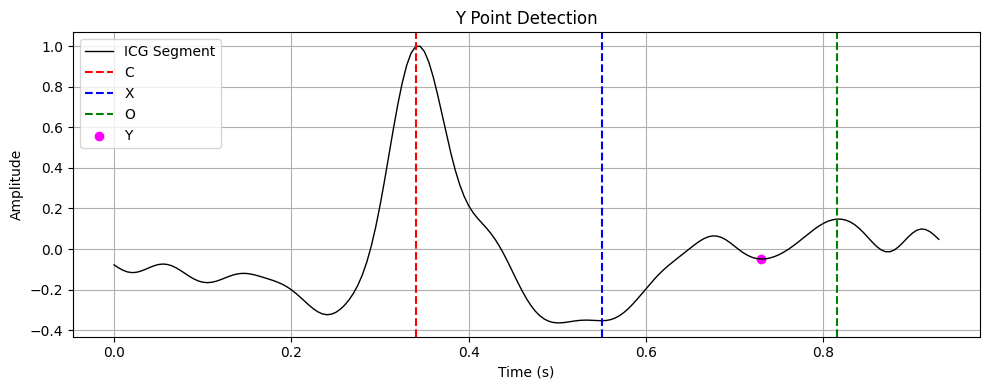

In [ ]:
from scipy.signal import argrelextrema
import matplotlib.pyplot as plt
import numpy as np

def detectar_punto_Y(icg_segment, resultado_X, O_index):
    # Determinar índice de inicio según el caso X
    if resultado_X["caso"] == "X":
        X_idx = resultado_X["X"]
    elif resultado_X["caso"] == "X1":
        X_idx = resultado_X["X1"]
    elif resultado_X["caso"] == "X1_X2":
        X_idx = resultado_X["X2"]  # usar X2 en este caso
    else:
        print("No se puede detectar Y: caso X no válido.")
        return None

    print("Usando X_idx en detectar_punto_Y:", X_idx)

    # Validar que X esté antes que O
    if X_idx >= O_index:
        print("No se puede detectar Y: X ocurre después de O.")
        return None

    # Extraer segmento entre X y O
    ventana_Y = icg_segment[X_idx:O_index + 1]

    # Buscar mínimos locales en esta ventana
    min_indices = argrelextrema(ventana_Y, np.less)[0]

    if len(min_indices) == 0:
        print("No se detectaron mínimos locales entre X y O.")
        return None

    # Tomar el mínimo local de menor amplitud
    Y_rel_idx = min_indices[np.argmin(ventana_Y[min_indices])]
    Y_abs_idx = X_idx + Y_rel_idx

    return Y_abs_idx


def plot_segmento_con_puntos(segmento, fs, C_idx=None, X_idx=None, O_idx=None, Y_idx=None):
    tiempo = np.arange(len(segmento)) / fs  # Convertir muestras a tiempo (s)

    plt.figure(figsize=(10, 4))
    plt.plot(tiempo, segmento, label="ICG Segment", color='black', linewidth=1)

    if C_idx is not None:
        plt.axvline(x=C_idx / fs, color='red', linestyle='--', label="C")
        # plt.scatter([C_idx / fs], [segmento[C_idx]], color='red')

    if X_idx is not None:
        plt.axvline(x=X_idx / fs, color='blue', linestyle='--', label="X")
        # plt.scatter([X_idx / fs], [segmento[X_idx]], color='blue')

    if O_idx is not None:
        plt.axvline(x=O_idx / fs, color='green', linestyle='--', label="O")
        # plt.scatter([O_idx / fs], [segmento[O_idx]], color='green')

    if Y_idx is not None:
        plt.scatter([Y_idx / fs], [segmento[Y_idx]], color='magenta', label="Y")

    plt.legend()
    plt.title("Y Point Detection")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

segmento = v_segments['Segment'].iloc[16000]
fs = 200
C_index, _ = detect_C_peaks(segmento, fs)
resultado = detectar_punto_X(segmento, C_index, fs, plot=False)
C_idx = C_index[0]
O_idx = detect_O_point(segmento, C_idx, fs)
Y_idx = detectar_punto_Y(segmento, resultado, O_idx)

# Aquí usas la función externa para plotear todos los puntos
if resultado["caso"] == "X":
    X_idx = resultado["X"]
elif resultado["caso"] == "X1":
    X_idx = resultado["X1"]
elif resultado["caso"] == "X1_X2":
    X_idx = resultado["X2"]
else:
    X_idx = None

plot_segmento_con_puntos(segmento, fs, C_idx=C_index[0], X_idx=X_idx, O_idx=O_idx, Y_idx=Y_idx)

###Detección de todos los puntos

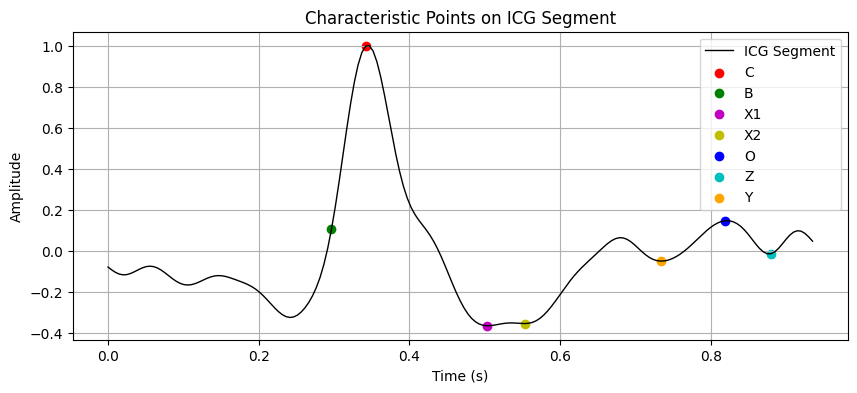

In [ ]:
import numpy as np
import scipy.signal as signal
from scipy.signal import find_peaks, savgol_filter, argrelextrema
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt

# ===================== #
#    1. FUNCIONES       #
# ===================== #

def relative_energy(signal, fs, long_win=0.95, short_win=0.14):
    long_len = int(long_win * fs)
    short_len = int(short_win * fs)
    Xre = np.zeros_like(signal)
    for n in range(len(signal)):
        i1, i2 = max(0, n - long_len // 2), min(len(signal), n + long_len // 2)
        j1, j2 = max(0, n - short_len // 2), min(len(signal), n + short_len // 2)
        long_energy = np.sum(signal[i1:i2] ** 2)
        short_energy = np.sum(signal[j1:j2] ** 2)
        if long_energy != 0:
            Xre[n] = signal[n] * (short_energy / long_energy)
    return Xre


def detect_C_peaks(icg_filtered, fs):
    Xre = relative_energy(icg_filtered, fs)
    sorted_peaks = np.sort(Xre[Xre > np.mean(Xre)])
    maxval = sorted_peaks[-2] if len(sorted_peaks) > 1 else sorted_peaks[-1]
    Thr_max, Thr_min = 0.2 * maxval, 0.02 * maxval

    C_peaks, active = [], False
    for i in range(1, len(Xre)):
        if not active and Xre[i] > Thr_max:
            active, start_idx = True, i
        elif active and Xre[i] < Thr_min:
            end_idx = i
            peak_idx = start_idx + np.argmax(Xre[start_idx:end_idx])
            if not C_peaks or (peak_idx - C_peaks[-1]) > int(0.25 * fs):
                C_peaks.append(peak_idx)
            active = False

    final_C_peaks = []
    for i, p in enumerate(C_peaks):
        if i < 5:
            final_C_peaks.append(p)
        else:
            prev_cc = np.diff(final_C_peaks[-5:])
            avg_cc = np.mean(prev_cc)
            if (p - final_C_peaks[-1]) > 1.7 * avg_cc:
                final_C_peaks.append(p)
    return np.array(final_C_peaks), Xre


def find_B_point(icg_segment, Cpos, fs, Afrac=0.2, Bslope1=0.11, Bslope2=0.08):
    BlimL = max(0, int(Cpos - 0.08 * fs))
    for i in range(Cpos - 1, BlimL, -1):
        if icg_segment[i] <= Afrac * icg_segment[Cpos]:
            BlimR = i
            break
    else:
        BlimR = BlimL
    slope = np.gradient(icg_segment)
    for i in range(BlimR, BlimL, -1):
        if (i > 0 and icg_segment[i] < icg_segment[i-1]) or abs(slope[i]) > Bslope1:
            return i
    for i in range(BlimR, BlimL, -1):
        if abs(slope[i]) > Bslope2:
            return i
    return BlimL + np.argmin(icg_segment[BlimL:BlimR+1])


def detectar_punto_X(icg_segment, C_index, fs, plot=False, suavizar=True):
    # 1. Definir ventana temporal (0.05s a 0.4s después de C)
    CXmin_s, CXmax_s = 0.05, 0.4
    CXmin_samp, CXmax_samp = int(fs * CXmin_s), int(fs * CXmax_s)
    start = max(int(C_index + CXmin_samp), 0)
    end = min(int(C_index + CXmax_samp), len(icg_segment) - 1)
    ventana = icg_segment[start:end]

    if len(ventana) < 3:
        return {"caso": "ninguno", "mensaje": "Ventana demasiado corta"}

    # 2. Suavizar señal si está activado
    if suavizar:
        ventana = gaussian_filter1d(ventana, sigma=1)

    # 3. Detectar mínimos locales
    min_indices = argrelextrema(ventana, np.less)[0]
    if len(min_indices) == 0:
        return {"caso": "ninguno", "mensaje": "No se detectaron mínimos locales"}

    # 4. Detectar mínimo global
    abs_min_idx = np.argmin(ventana)

    # 5. Clasificación según mínimos detectados
    if len(min_indices) == 1:
        idx = min_indices[0]
        if idx == abs_min_idx and (0.07*fs <= idx <= 0.22*fs):
            resultado = {"caso": "X1", "X1": idx}
        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    elif len(min_indices) == 2:
        X1_idx, X2_idx = min_indices[0], min_indices[1]
        amp_diff = abs(ventana[X1_idx] - ventana[X2_idx])
        umbral = 0.05
        idx = min_indices[0]
        if ventana[X1_idx] < ventana[X2_idx] and amp_diff <= umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}
        elif ventana[X1_idx] > ventana[X2_idx] and amp_diff <= umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}
        elif idx == abs_min_idx and (0.07*fs <= idx <= 0.22*fs):
            resultado = {"caso": "X1", "X1": idx}
        elif ventana[X1_idx] > ventana[X2_idx]:
            resultado = {"caso": "X", "X": X2_idx}
        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    else:
        X1_idx, X2_idx, X3_idx = min_indices[:3]
        amp_diff = abs(ventana[X1_idx] - ventana[X2_idx])
        umbral = 0.05
        idx = min_indices[0]
        if ventana[X1_idx] < ventana[X2_idx] and amp_diff <= umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}
        elif ventana[X1_idx] > ventana[X2_idx] and amp_diff <= umbral:
            resultado = {"caso": "X1_X2", "X1": X1_idx, "X2": X2_idx}
        elif idx == abs_min_idx and (0.07*fs <= idx <= 0.22*fs):
            resultado = {"caso": "X1", "X1": idx}
        elif ventana[X3_idx] < ventana[X2_idx]:
            resultado = {"caso": "X", "X": X3_idx}
        else:
            resultado = {"caso": "X", "X": abs_min_idx}

    # Ajuste de índices absolutos
    if resultado["caso"] == "X":
        resultado["X"] += start
    elif resultado["caso"] == "X1":
        resultado["X1"] += start
    elif resultado["caso"] == "X1_X2":
        resultado["X1"] += start
        resultado["X2"] += start

    return resultado


def detect_O_point(segment, C_index, fs):
    start_search = C_index + int(0.2 * fs)
    end_search = min(C_index + int(0.5 * fs), len(segment))
    search_region = segment[start_search:end_search]
    if len(search_region) == 0:
        return None
    peaks, _ = signal.find_peaks(search_region)
    if len(peaks) == 0:
        return None
    max_peak_idx = peaks[np.argmax(search_region[peaks])]
    return start_search + max_peak_idx


def detect_Z_point(segment, O_index, fs):
    # Define search window (start just after O, up to 0.1s after)
    start_search = O_index + int(0.005 * fs)
    end_search = O_index + int(0.15 * fs)
    end_search = min(end_search, len(segment))

    # Extract search region
    search_region = segment[start_search:end_search]

    if len(search_region) == 0:
        return None

    # Invert the signal to find local minima as peaks
    inverted_region = -search_region
    peaks, _ = signal.find_peaks(inverted_region)

    if len(peaks) == 0:
        return None  # No local minima found

    # Choose the first local minimum
    Z_index = start_search + peaks[0]
    return Z_index



def detectar_punto_Y(icg_segment, resultado_X, O_index, fs):
    # Selección del índice de X
    if resultado_X["caso"] == "X":
        X_idx = resultado_X["X"]
    elif resultado_X["caso"] == "X1":
        X_idx = resultado_X["X1"]
    elif resultado_X["caso"] == "X1_X2":
        X_idx = resultado_X["X2"]
    else:
        return None

    if X_idx >= O_index:
        return None

    # Definir ventana temporal tras X
    min_offset = int(0.06 * fs)  # 60 ms
    max_offset = O_index
    inicio = X_idx + min_offset
    fin = min(X_idx + max_offset, O_index + 1)

    if fin <= inicio or fin > len(icg_segment):
        return None

    ventana_Y = icg_segment[inicio:fin]

    # Detectar mínimos locales
    min_idx = argrelextrema(ventana_Y, np.less)[0]

    for idx in min_idx:
        # Verificar que la curva baja antes y sube después (mínimo local "válido")
        if 1 <= idx < len(ventana_Y) - 1:
            if ventana_Y[idx - 1] > ventana_Y[idx] < ventana_Y[idx + 1]:
                return inicio + idx

    # Si no hay mínimos válidos con esa forma
    return None
# ===================== #
#     2. CARGA & PLOT   #
# ===================== #

fs = 200
segmento_idx = 16000
segmento = v_segments['Segment'].iloc[segmento_idx]

# Detectar todos los puntos
C_peaks, _ = detect_C_peaks(segmento, fs)
B_points = find_B_point(segmento, C_peaks[0], fs)
X_result = detectar_punto_X(segmento, C_peaks[0], fs)
O_point = detect_O_point(segmento, C_peaks[0], fs)
Z_point = detect_Z_point(segmento, O_point, fs)
Y_point = detectar_punto_Y(segmento, X_result, O_point, fs)

def plot_icg_with_points(icg_segment, fs,
                         C_idx, B_idxs, X_res, O_idx, Z_idx, Y_idx):
    time = np.linspace(0, len(icg_segment)/fs, len(icg_segment))
    plt.figure(figsize=(10,4))
    plt.plot(time, icg_segment, color='k', label='ICG Segment', linewidth=1)

    plt.scatter(time[C_idx], icg_segment[C_idx], color='r', label='C')
    plt.scatter(time[B_idxs], icg_segment[B_idxs], color='g', label='B')


    if X_res['caso']=='X':
        plt.scatter(time[X_res['X']], icg_segment[X_res['X']], color='m', label='X')
    elif X_res['caso']=='X1':
        plt.scatter(time[X_res['X1']], icg_segment[X_res['X1']], color='m', label='X1')
    elif X_res['caso']=='X1_X2':
        plt.scatter(time[X_res['X1']], icg_segment[X_res['X1']], color='m', label='X1')
        plt.scatter(time[X_res['X2']], icg_segment[X_res['X2']], color='y', label='X2')

    if O_idx is not None:
        plt.scatter(time[O_idx], icg_segment[O_idx], color='b', label='O')

    if Z_idx is not None:
        plt.scatter(time[Z_idx], icg_segment[Z_idx], color='c', label='Z')

    if Y_idx is not None:
        plt.scatter(time[Y_idx], icg_segment[Y_idx], color='orange', label='Y')

    plt.legend()
    plt.title('Characteristic Points on ICG Segment')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

# Llamada al plot
plot_icg_with_points(segmento, fs, C_peaks[0], B_points, X_result, O_point, Z_point, Y_point)


###Ahora vamos a aplicar algoritmos de aprendizaje no supervisado de clustering.

Para ello lo primero es segmentar cada uno de los segmentos de ICG y únicamente quedarnos con la parte variable.

[187]


<ipython-input-29-094a92b8742c>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v_segments['Segment_partial'] = v_segments['Segment'].apply(lambda x: x[int(0.42 * len(x)):])


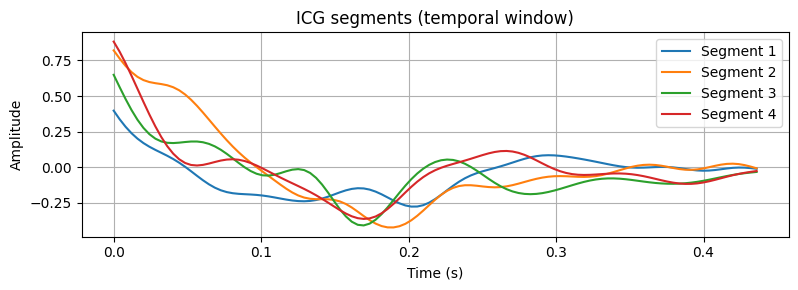

(16620, 109)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Verifica que todos los segmentos tienen la misma longitud
segment_lengths = v_segments['Segment'].apply(len)
print(segment_lengths.unique())

# Recorta los segmentos desde el 42% hacia adelante
v_segments['Segment_partial'] = v_segments['Segment'].apply(lambda x: x[int(0.42 * len(x)):])

# Seleccionar 4 segmentos aleatorios de la columna 'Segment_partial'
sampled_segments = v_segments['Segment_partial'].sample(4, random_state=42).reset_index(drop=True)

# Crear la figura para visualizar los segmentos en función del tiempo
plt.figure(figsize=(8, 3))

for i, segment in enumerate(sampled_segments):
    segment = np.array(segment)
    time_vector = np.linspace(0, len(segment) / fs, len(segment))  # Tiempo en segundos
    plt.plot(time_vector, segment, label=f'Segment {i+1}')

plt.title('ICG segments (temporal window)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Convertir todos los segmentos parciales a matriz numpy para clustering
X = np.stack(v_segments['Segment_partial'].values)
print(X.shape)  # (n_segmentos, longitud_segmento)


###**K-MEANS**:

El método K-Means requiere como input n_clusters. Sin embargo, precisamente esto es lo que nosotros queremos saber. Es por ello que aplicamos un bucle que en base a 3 parámetros nos dice cuál es el n_clusters óptimo que deberíamos emplear.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
import pandas as pd

# Rango de clusters a evaluar
k_range = range(2, 8)

# Almacenamos las métricas
silhouette_scores = []
davies_bouldin_scores = []
calinski_harabasz_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(X)

    silhouette_scores.append(silhouette_score(X, labels))
    davies_bouldin_scores.append(davies_bouldin_score(X, labels))
    calinski_harabasz_scores.append(calinski_harabasz_score(X, labels))

# Convertir a DataFrame para visualización
metrics_df = pd.DataFrame({
    'n_clusters': list(k_range),
    'Silhouette': silhouette_scores,
    'Davies-Bouldin': davies_bouldin_scores,
    'Calinski-Harabasz': calinski_harabasz_scores
})

# Mostrar la tabla con métricas
print(metrics_df)

# Mostrar resultados óptimos por métrica
best_silhouette_k = metrics_df.loc[metrics_df['Silhouette'].idxmax(), 'n_clusters']
best_db_k = metrics_df.loc[metrics_df['Davies-Bouldin'].idxmin(), 'n_clusters']
best_ch_k = metrics_df.loc[metrics_df['Calinski-Harabasz'].idxmax(), 'n_clusters']

print(f"Mejor k según Silhouette Score: {best_silhouette_k}")
print(f"Mejor k según Davies-Bouldin Index: {best_db_k}")
print(f"Mejor k según Calinski-Harabasz Index: {best_ch_k}")

# Graficar métricas
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('n_clusters')
plt.ylabel('Score')

plt.subplot(1, 3, 2)
plt.plot(k_range, davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin Index')
plt.xlabel('n_clusters')
plt.ylabel('Score')

plt.subplot(1, 3, 3)
plt.plot(k_range, calinski_harabasz_scores, marker='o')
plt.title('Calinski-Harabasz Index')
plt.xlabel('n_clusters')
plt.ylabel('Score')

plt.tight_layout()
plt.show()

KeyboardInterrupt: 

Me he dado cuenta que estas métricas no son las óptimas a emplear porque no se centran en la morfología de la señal (que es lo que yo quiero) sino que evalúan densidad, cohesión o dispersión geométrica. Es por ello que voy a recurrir a otro método que es el empleo del KMeans basado en dtw en lugar de en la distnacia euclídea, lo que permite que segmentos que tienen la misma forma pero están un poco desfasados o dilatados sigan siendo agrupados juntos. Esto se encuentra en el Kmeans v2.

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
labels = kmeans.fit_predict(X)
v_segments['Cluster_KMeans'] = labels #creamos una nueva columna que contiene el resultado del clustering


<ipython-input-148-27e9c4bb9d75>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v_segments['Cluster_KMeans'] = labels #creamos una nueva columna que contiene el resultado del clustering


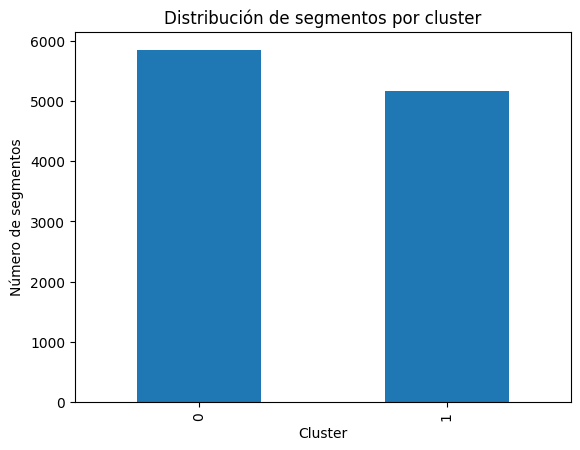

In [ ]:
import matplotlib.pyplot as plt
#Para visualizar el número de segmentos que hay en cada cluster:
v_segments['Cluster_KMeans'].value_counts().sort_index().plot(kind='bar')
plt.xlabel("Cluster")
plt.ylabel("Número de segmentos")
plt.title("Distribución de segmentos por cluster")
plt.show()

In [ ]:
#Para visualizar la respresentación de segmentos en cada cluster
# Número de clusters
n_clusters = 5

# Crear una figura por cada cluster
for cluster_id in range(n_clusters):
    # Filtrar los segmentos del cluster actual
    cluster_data = v_segments[v_segments['Cluster_KMeans'] == cluster_id]['Segment']

    plt.figure(figsize=(10, 4))
    for segment in cluster_data:
        plt.plot(tiempo, segment, alpha=0.3)  # alpha para hacer las curvas más transparentes


    plt.title(f"Segmentos del Cluster {cluster_id}")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud ICG")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


NameError: name 'best_silhouette_k' is not defined

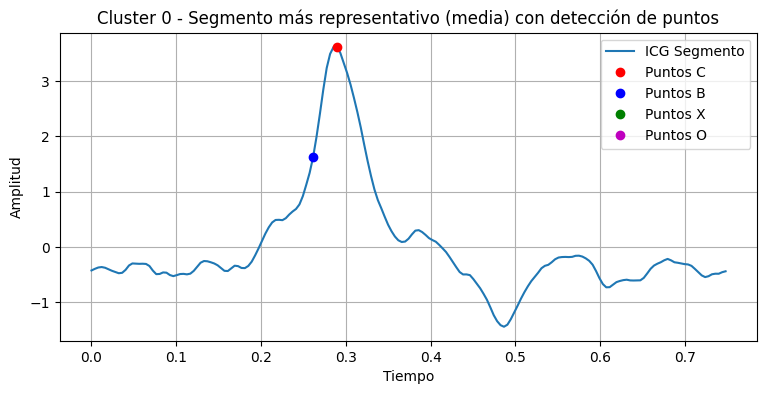

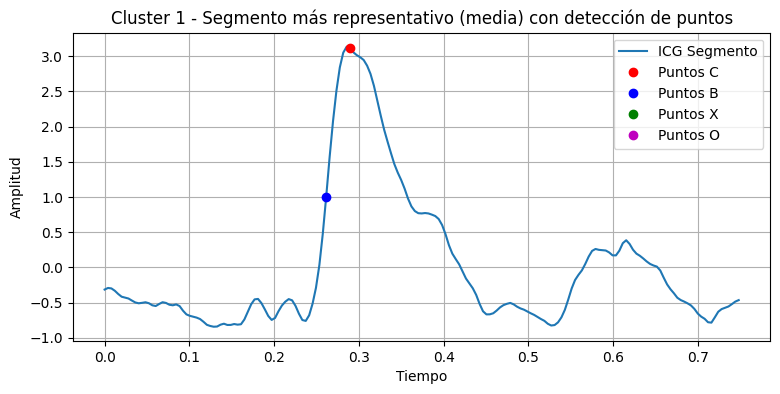

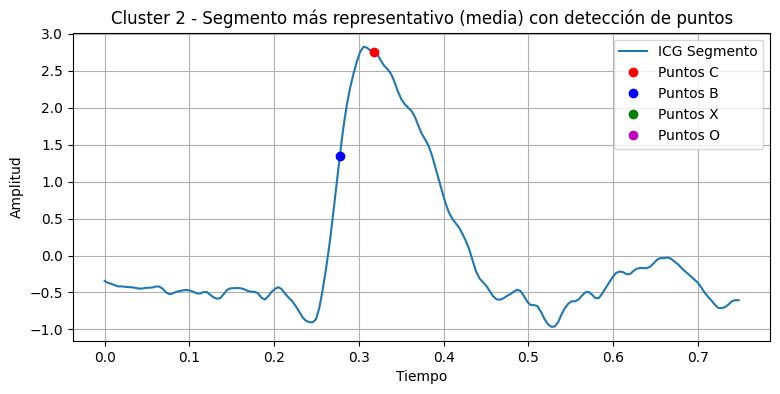

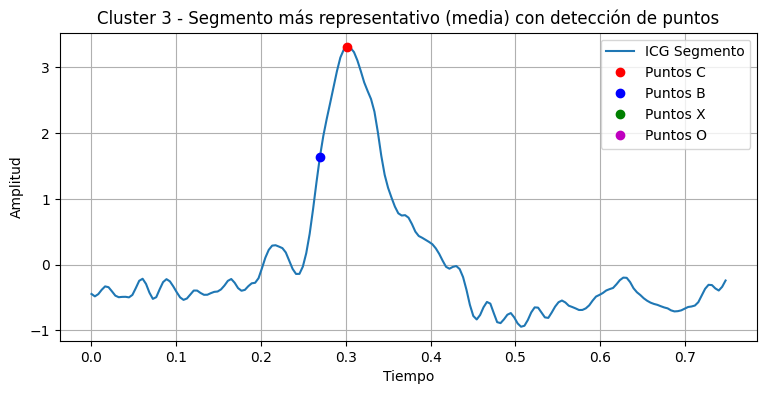

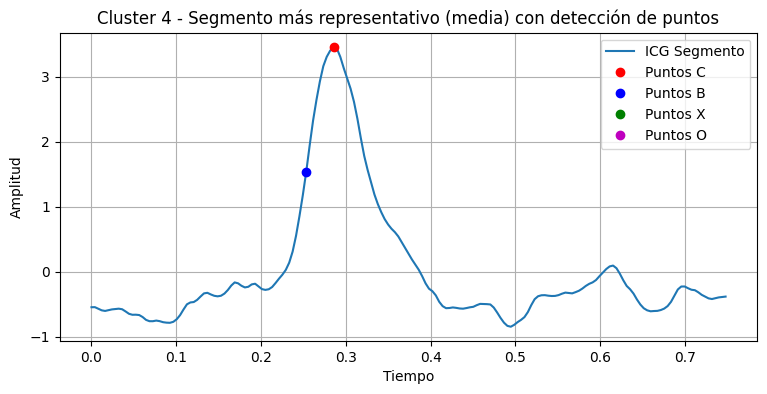

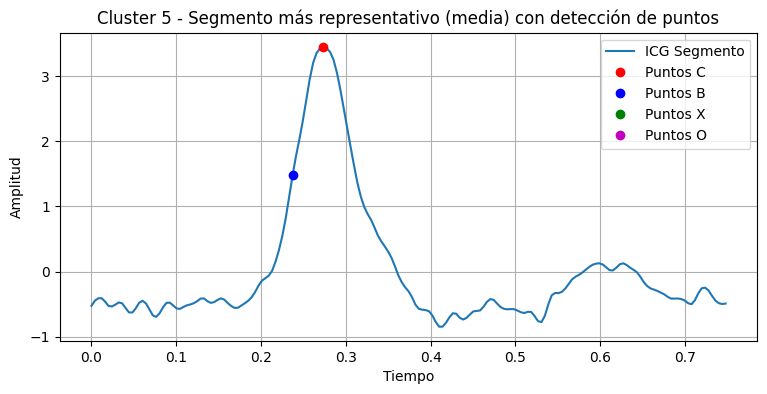

In [ ]:
#Para visualizar el segmento más representativo de cada tipo de cluster. Basado en la MEDIA.
from scipy.spatial.distance import cdist

for cluster_id in range(n_clusters):
    cluster_data = v_segments[v_segments['Cluster_KMeans'] == cluster_id]['Segment']
    segment_matrix = np.stack(cluster_data.values)

    # Calcular la media
    mean_segment = np.mean(segment_matrix, axis=0)

    # Calcular la distancia de cada segmento al promedio
    distances = cdist(segment_matrix, [mean_segment], metric='euclidean')

    # Encontrar el índice del segmento más cercano a la media
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

    # Graficar solo el más representativo
    #plt.figure(figsize=(6, 3))
    #plt.plot(representative_segment, color='blue', linewidth=1.5)

    #plt.title(f"Cluster {cluster_id} - Segmento más representativo (media)")
    #plt.xlabel("Muestras")
    #plt.ylabel("Amplitud ICG")
    #plt.grid(True)
    #plt.tight_layout()
    #plt.show()

    #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    #Aquí tanto para los puntos X como O el algoritmo creado obtiene como resultado que estos puntos son = None, por tanto no tiene ningún
    #sentido representarlo con respecto del tiempo porque no hay nada que representar, y es por ello que si pongo tiempo delante da error.
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (media) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()


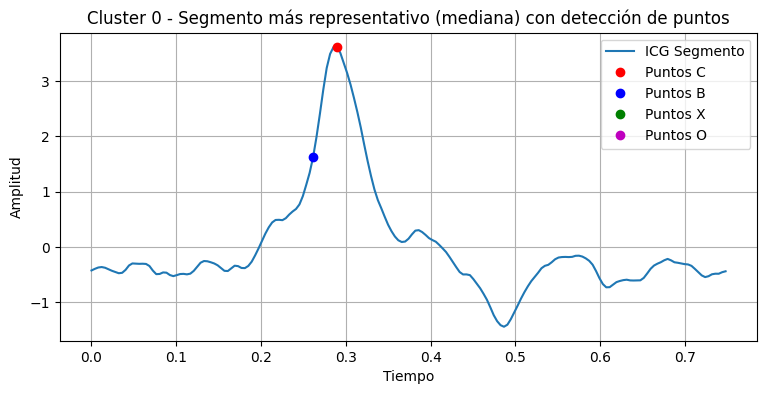

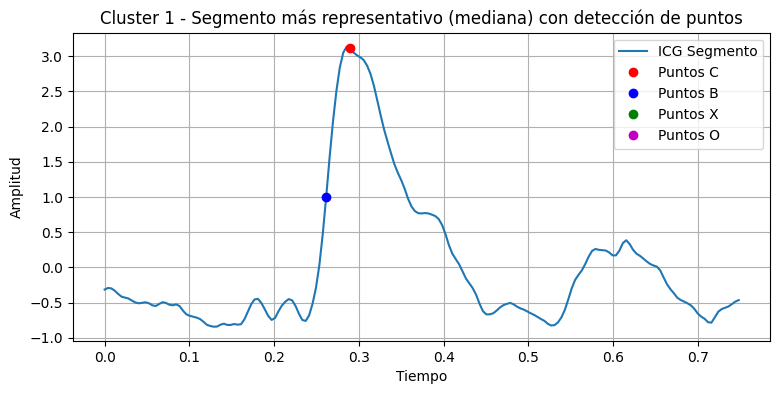

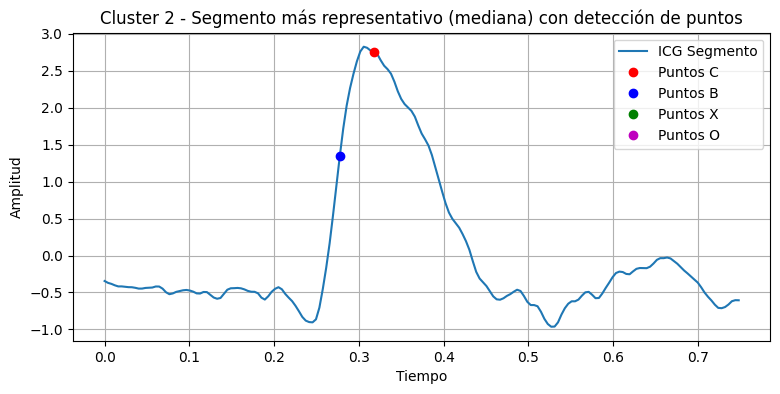

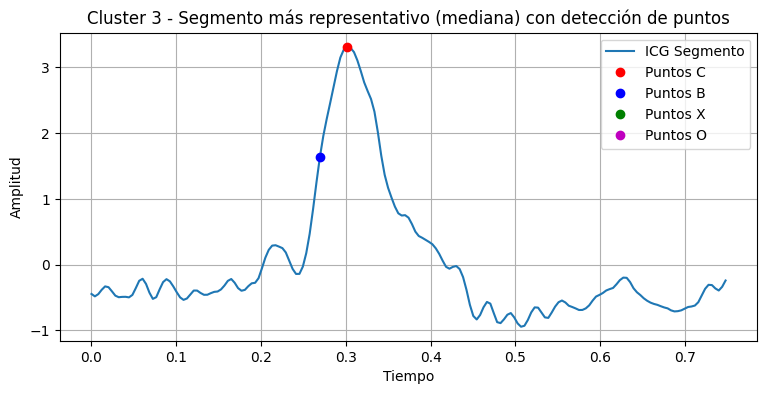

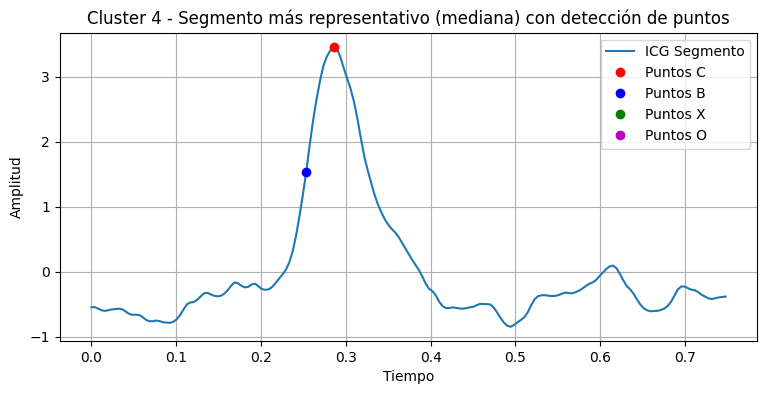

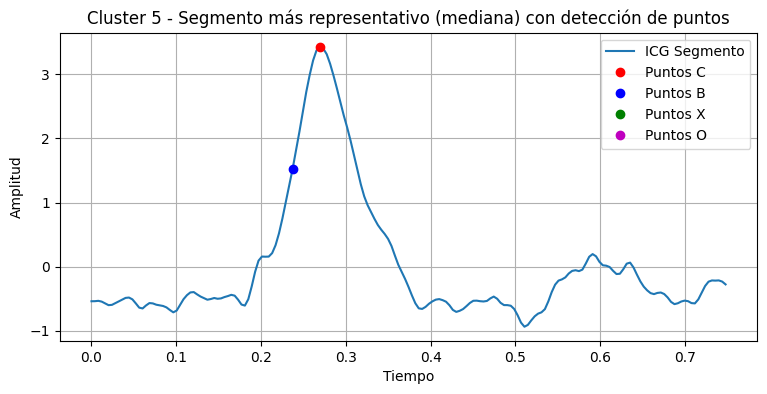

In [ ]:
#Para visualizar el segmento más representativo de cada tipo de cluster. Basado en la MEDIANA.
for cluster_id in range(n_clusters):
    cluster_data = v_segments[v_segments['Cluster_KMeans'] == cluster_id]['Segment']
    segment_matrix = np.stack(cluster_data.values)

    # Calcular la mediana punto a punto
    median_segment = np.median(segment_matrix, axis=0)

    # Calcular la distancia de cada segmento a la mediana
    distances = cdist(segment_matrix, [median_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

       #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (mediana) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()

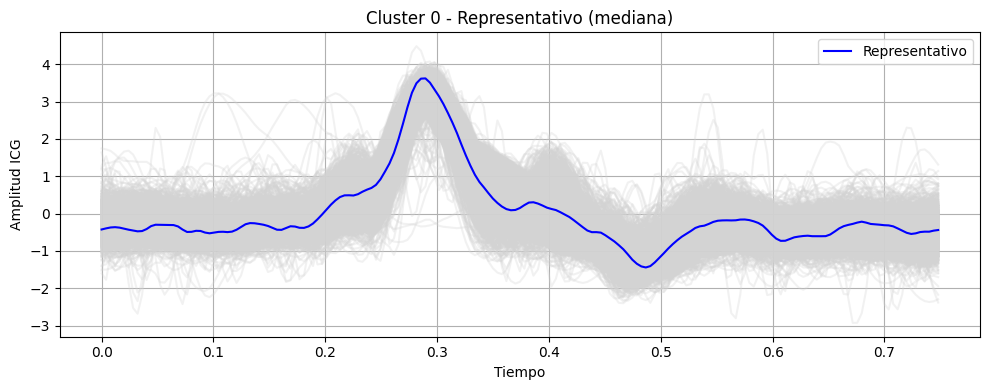

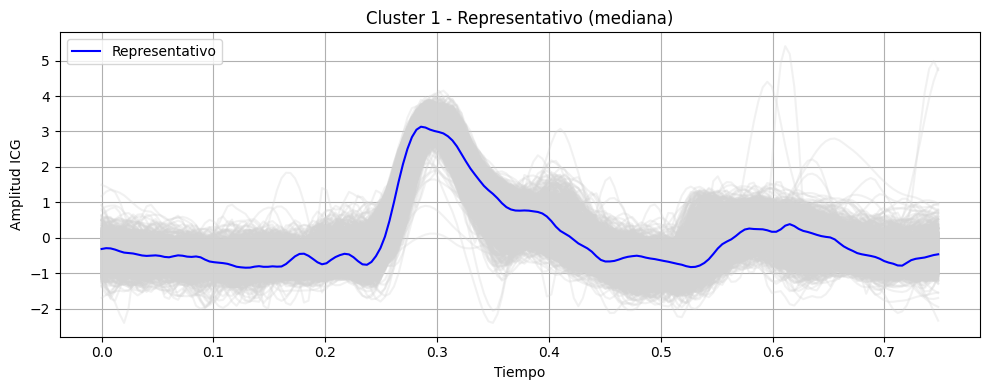

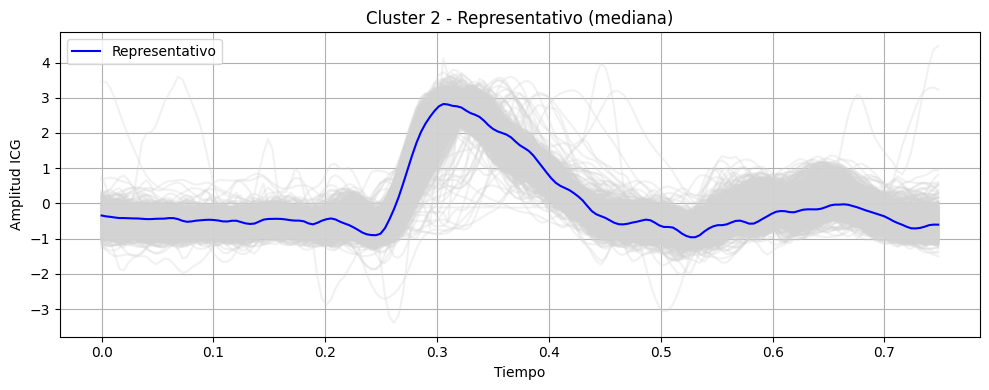

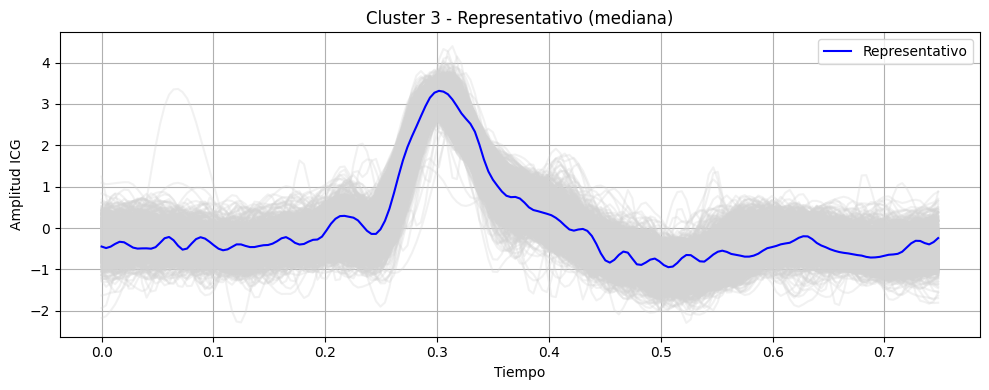

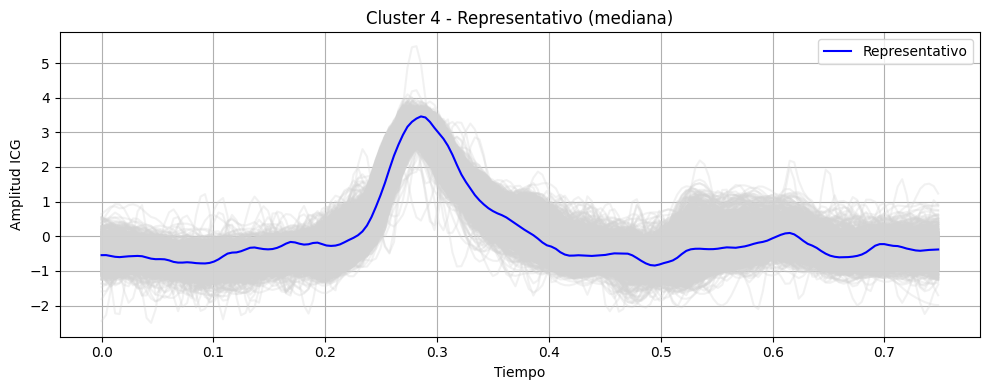

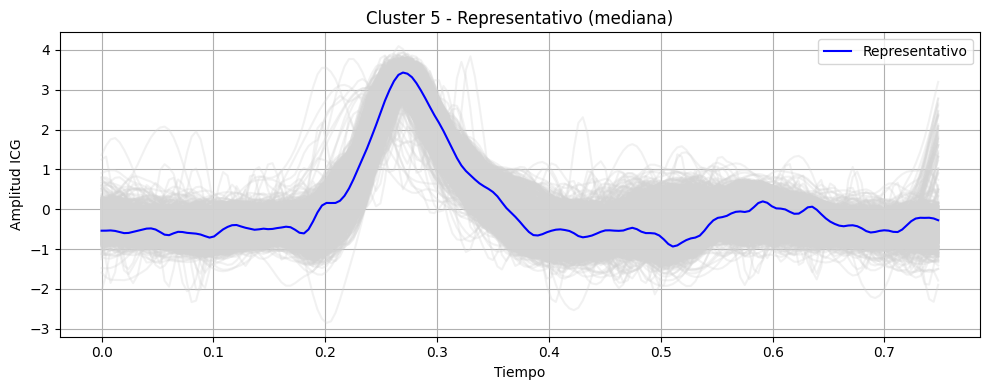

In [ ]:
#Representación de todas los segmentos por cluster y segmento más representativo de cada cluster basado en la MEDIANA.
for cluster_id in range(n_clusters):
    cluster_data = v_segments[v_segments['Cluster_KMeans'] == cluster_id]['Segment']
    segment_matrix = np.stack(cluster_data.values)

    # Calcular la mediana punto a punto
    median_segment = np.median(segment_matrix, axis=0)

    # Calcular la distancia de cada segmento a la mediana
    distances = cdist(segment_matrix, [median_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

    # Plot para comparación
    plt.figure(figsize=(10, 4))
    for segment in segment_matrix:
        plt.plot(tiempo, segment, color='lightgray', alpha=0.3)

    plt.plot(tiempo, representative_segment, color='blue', linewidth=1.5, label='Representativo')

    plt.title(f"Cluster {cluster_id} - Representativo (mediana)")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud ICG")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Conclusiones: obtenemos 6 subcomplejos donde algunos sí se parecen mucho a algunos del paper y otros no tienen mucha similitud. Continuaremos probando con otros algoritmos.

###**K-Means v2:**

In [ ]:
pip install tslearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 9.5 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMinMax


# Escalamos los datos entre 0 y 1 (muy recomendable para DTW)
scaler = TimeSeriesScalerMinMax()
X_scaled = scaler.fit_transform(X)

# Rango de valores para k
k_range = range(2, 6)
inertias = []

# Bucle para aplicar TimeSeriesKMeans con DTW para cada k
for k in k_range:
    model = TimeSeriesKMeans(n_clusters=k, metric="dtw", random_state=42)
    model.fit(X_scaled)  # Ajustamos el modelo
    inertias.append(model.inertia_)  # Añadimos la inertia (suma de distancias intra-cluster)

# Graficar la inertia (Método del Codo)
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo (Inertia con DTW)")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inertia (Suma de distancias DTW)")
plt.grid(True)
plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


KeyboardInterrupt: 

Concluir diciendo que esta opción no tiene mucho sentido y por tanto un poco descartable.

###**K-Medoids:**

Esta opción es mejor frente al K-Means porque:
- K-Medoids no necesita calcular promedios, sino que elige el medoide (el ejemplo más representativo del cluster)
- Es compatible con cualquier matriz de distancias precomputada, incluida DTW
- Es robusto a outliers y da resultados morfológicamente interpretables, especialmente útil en señales como las ICG.



Con este primer código lo que estoy pidiendo es que se evalúe según 4 parámetros diferentes cuál es el K óptimo. Una vez se ha hallado el número de clusters óptimo se realiza un plot con algunas de las señales pertenecientes a este cluster para comprobar visualmente cuál es la similitud entre los segmentos representados.

In [ ]:
!pip install pyclustering

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 38.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyclustering: filename=pyclustering-0.10.1.2-py3-none-any.whl size=2395100 sha256=eeed52d065db45d56f52fb5795a20ba7ca150f8794998b22ac1467d4fecc6c8c
  Stored in directory: /root/.cache/pip/wheels/9f/99/15/e881f46a92690ae77c2e3b255b89ea45d3a867b1b6c2ab3ba9
Successfully built pyclustering


In [ ]:
pip install tslearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 10.0 MB/s eta 0:00:00


In [ ]:
!pip install kneed


K = 2

K = 3

K = 4

K = 5

K = 6

🔍 Silhouette → Mejor K: 2 (valor: 0.2481)


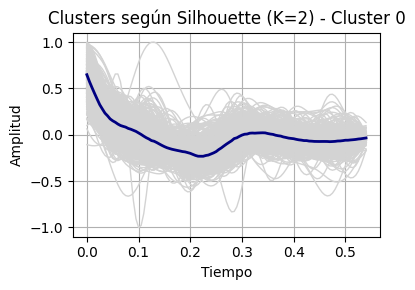

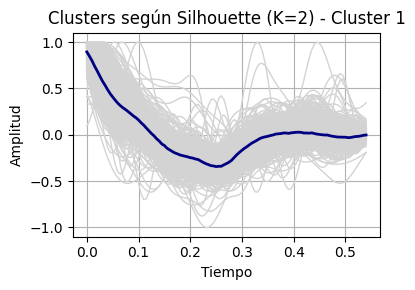


🔍 DaviesBouldin → Mejor K: 2 (valor: 1.7569)


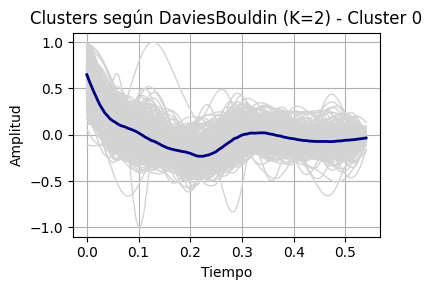

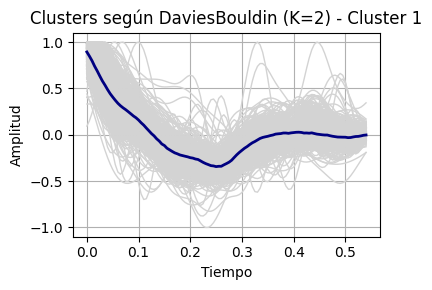


🔍 CalinskiHarabasz → Mejor K: 2 (valor: 276.4171)


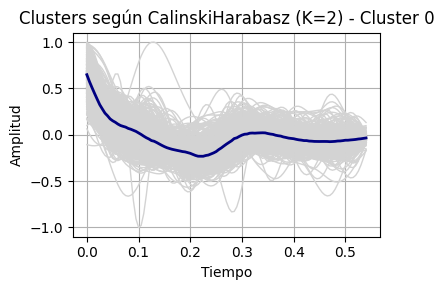

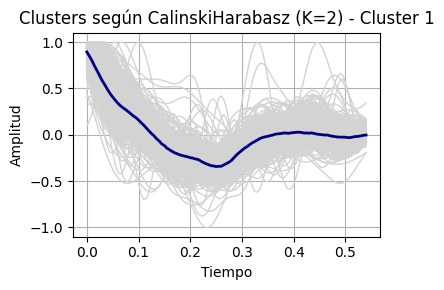


🔍 Dunn → Mejor K: 3 (valor: 0.0417)


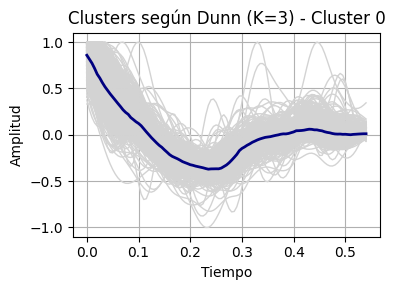

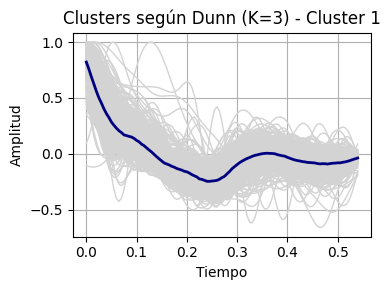

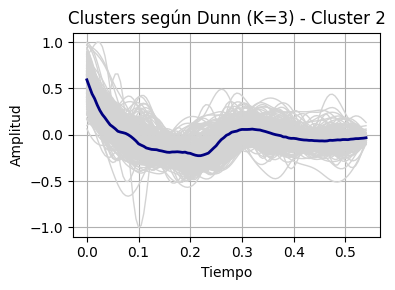

In [ ]:
import numpy as np
import pandas as pd
from pyclustering.cluster.kmedoids import kmedoids
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from tslearn.metrics import cdist_dtw
import matplotlib.pyplot as plt
import random
from scipy.spatial.distance import pdist, squareform
from itertools import combinations

# Dunn Index
def dunn_index(X, labels):
    unique_labels = np.unique(labels)
    inter_cluster = []
    intra_cluster = []

    for i in unique_labels:
        cluster_i = X[labels == i]
        if len(cluster_i) < 2:
            intra_cluster.append(0)
        else:
            intra = np.max(pdist(cluster_i))
            intra_cluster.append(intra)

    for i, j in combinations(unique_labels, 2):
        cluster_i = X[labels == i]
        cluster_j = X[labels == j]
        dist = np.min([np.linalg.norm(x - y) for x in cluster_i for y in cluster_j])
        inter_cluster.append(dist)

    return np.min(inter_cluster) / np.max(intra_cluster)


# === 1. Selección de muestra y matriz DTW ===
v_segments_sample = v_segments['Segment_partial'].sample(n=1000, random_state=42).reset_index(drop=True)
X = np.stack(v_segments_sample.values)
dtw_distances = cdist_dtw(X, global_constraint="sakoe_chiba", sakoe_chiba_radius=int(0.1 * X.shape[1]))

range_k = range(2, 7)
results = []

for k in range_k:
    print(f"\nK = {k}")
    initial_medoids = random.sample(range(len(X)), k)
    kmed = kmedoids(dtw_distances.tolist(), initial_medoids, data_type='distance_matrix')
    kmed.process()
    clusters = kmed.get_clusters()

    labels = np.empty(len(X), dtype=int)
    for idx, points in enumerate(clusters):
        labels[points] = idx

    silhouette = silhouette_score(dtw_distances, labels, metric='precomputed')
    davies = davies_bouldin_score(X, labels)
    calinski = calinski_harabasz_score(X, labels)
    dunn = dunn_index(X, labels)

    results.append({
        'K': k,
        'Silhouette': silhouette,
        'DaviesBouldin': davies,
        'CalinskiHarabasz': calinski,
        'Dunn': dunn,
        'Labels': labels.copy()
    })

# === 2. Elegir mejor K según cada métrica ===
df_results = pd.DataFrame(results)

best_by = {
    'Silhouette': df_results.loc[df_results['Silhouette'].idxmax()],
    'DaviesBouldin': df_results.loc[df_results['DaviesBouldin'].idxmin()],
    'CalinskiHarabasz': df_results.loc[df_results['CalinskiHarabasz'].idxmax()],
    'Dunn': df_results.loc[df_results['Dunn'].idxmax()]
}

# === 3. Plot por cada K óptimo según métrica ===
t = np.arange(X.shape[1]) / fs
for metric, res in best_by.items():
    print(f"\n🔍 {metric} → Mejor K: {res['K']} (valor: {res[metric]:.4f})")
    labels = res['Labels']
    v_segments_sample[f'Cluster_{metric}'] = labels  # Añadir etiquetas correctas al DataFrame


    for cluster_id in np.unique(labels):
        cluster_indices = np.where(labels == cluster_id)[0]
        cluster_segments = X[cluster_indices]

        # Calcular el segmento mediana
        representative_segment = np.median(cluster_segments, axis=0)

        # Crear figura
        plt.figure(figsize=(4, 3))

        # Dibujar todos los segmentos del cluster en gris claro
        for segment in cluster_segments:
            plt.plot(t, segment, color='lightgray', linewidth=1)

        # Dibujar el segmento representativo en azul oscuro
        plt.plot(t, representative_segment, color='navy', linewidth=2)

        plt.title(f'Clusters según {metric} (K={int(res["K"])}) - Cluster {cluster_id}')
        plt.xlabel("Tiempo")
        plt.ylabel("Amplitud")
        plt.grid(True)
        plt.tight_layout()
        plt.show()


A continuación voy a plantearlo desde una perspectiva diferente ya que no sé muy bien cómo interpretar los resultados que estoy obteniendo. En parte, creo que depende de cómo elimine los segmentos u. Peor tampoco entiendo la variabilidad, porque a veces me sale que K=2 con el parámetro de Silhouette y otras que K=6.

Entonces ahora voy a aplicar este método de clustering para diferentes K definidas. Para cada una de estas diferentes K voy a obtener diferentes plots con los segmentos agrupados y voy a clacular la distancia promedio dentro de cada cluster utilizando la matriz de distancias DTW, lo que nos da una métrica de homogeneidad morfológica para cada clustering. Después, se aplica la técnica del codo por la que se halla el número de clusters óptimo.

Una vez se han aplicado las técnicas de clustering sobre el segmento parcial y se ha hallado el K óptimo, lo que se hace es almacenar en una tabla el segmento completo siguiento la estructura: tantas columnas como clusters distintos se haya detectado (ejemplo 4 columnas si hay 4 clusters porque el K óptimo obtenido es 4), y tantas filas como segmentos diferentes haya en cada cluster.

Calculando matriz de distancias DTW...
Probando diferentes valores de K...
 - Clustering con K = 2
   → Distancia promedio intra-cluster: 1.0341


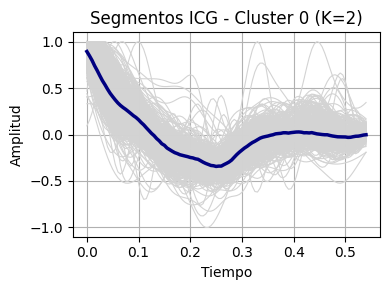

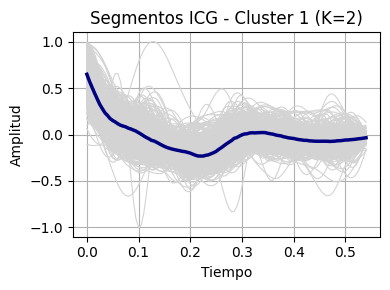

 - Clustering con K = 3
   → Distancia promedio intra-cluster: 0.9604


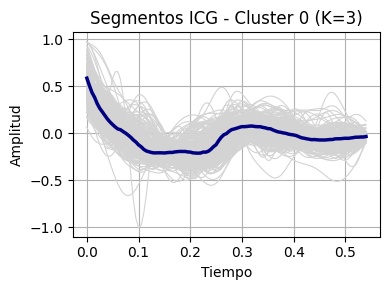

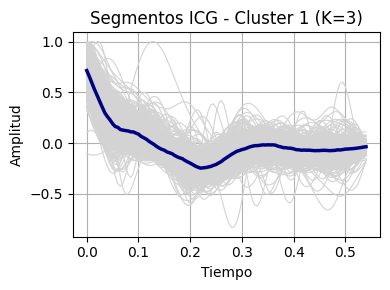

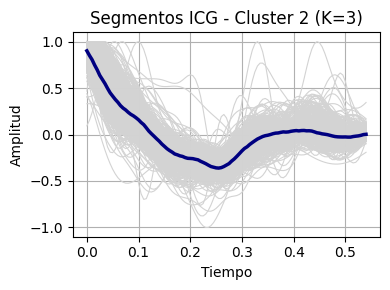

 - Clustering con K = 4
   → Distancia promedio intra-cluster: 0.9284


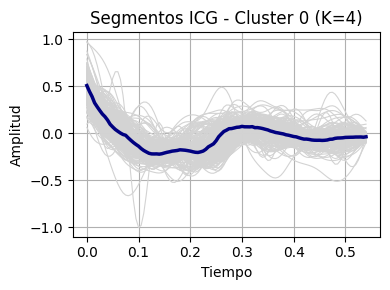

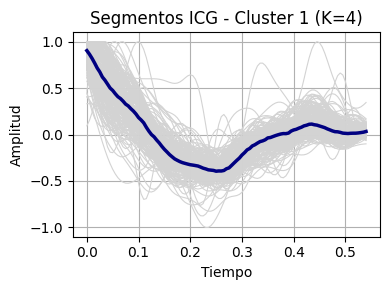

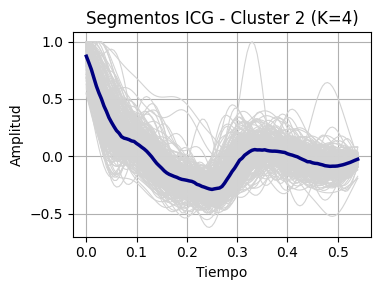

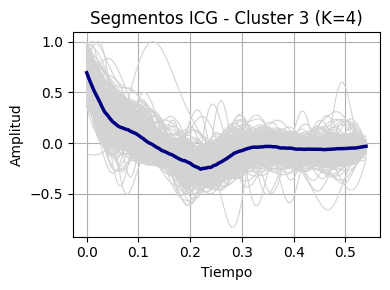

 - Clustering con K = 5
   → Distancia promedio intra-cluster: 0.8883


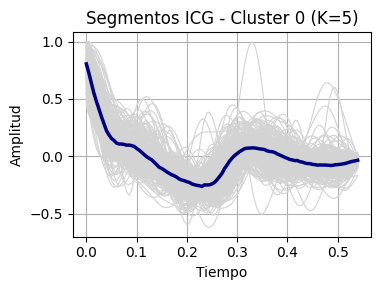

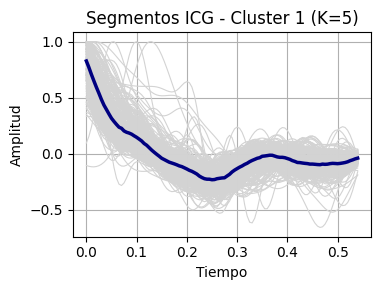

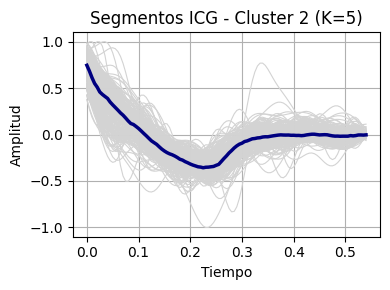

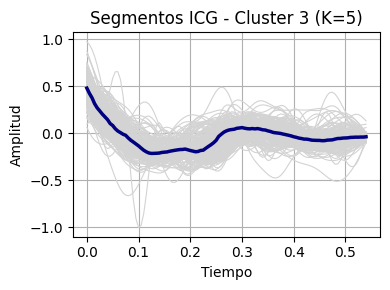

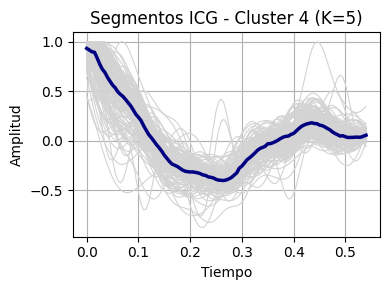

 - Clustering con K = 6
   → Distancia promedio intra-cluster: 0.8514


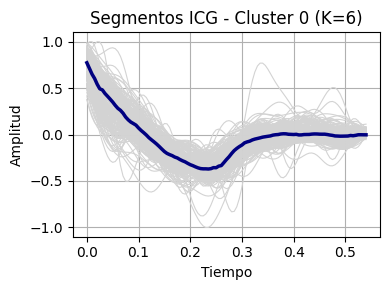

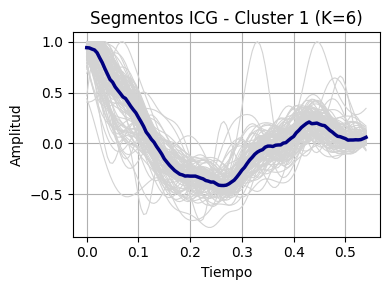

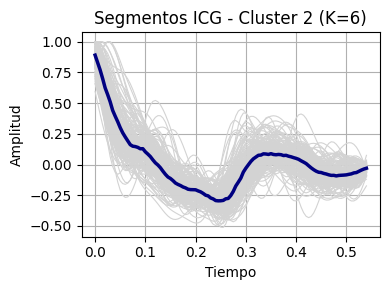

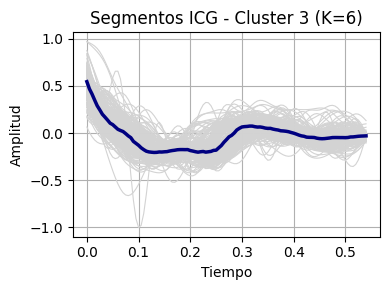

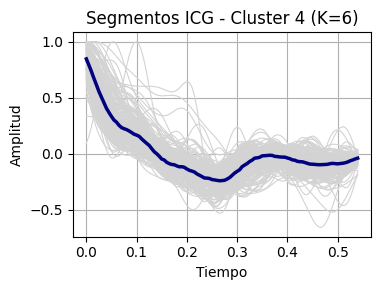

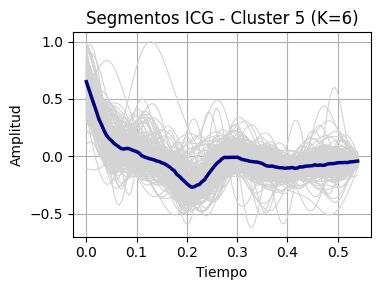

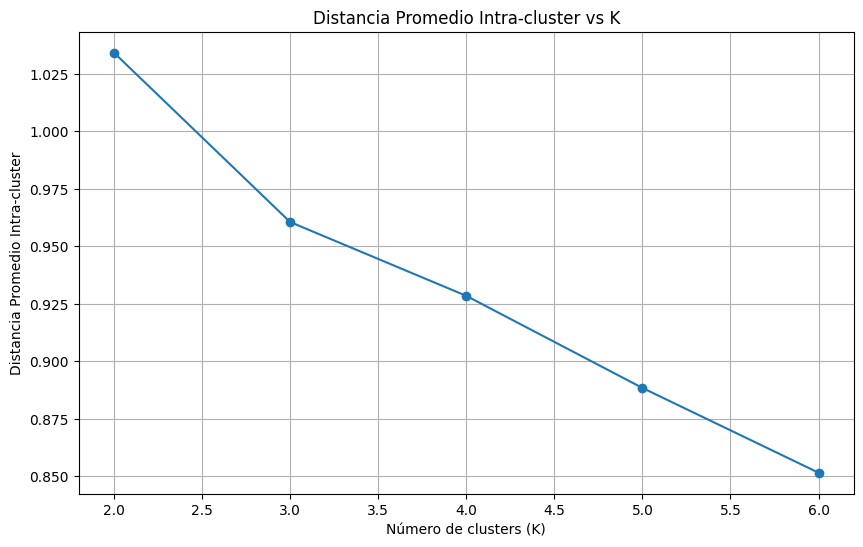


⚠️ No se detectó un codo claro. Se selecciona K = 4 como el de mayor descenso relativo tras K=2.

🔁 Aplicando clustering final con K = 4...
✅ Tabla de segmentos agrupados por cluster generada con 1000 filas.
  Cluster_0                                          Cluster_1  \
0      None                                               None   
1      None                                               None   
2      None                                               None   
3      None  [-0.08508111651553506, -0.09265920095313535, -...   
4      None  [-0.12175285621710558, -0.12095703502589449, -...   

                                           Cluster_2  \
0  [-0.10995430072629458, -0.10166414554769235, -...   
1                                               None   
2                                               None   
3                                               None   
4                                               None   

                                           Cluster_3  
0 

In [ ]:
import numpy as np
from pyclustering.cluster.kmedoids import kmedoids
from tslearn.metrics import cdist_dtw
import matplotlib.pyplot as plt
import random

# 1. Seleccionar aleatoriamente 1000 segmentos
v_segments_sample = v_segments['Segment_partial'].sample(n=1000, random_state=42).reset_index(drop=True)

# Extraer la matriz de segmentos de la muestra
X = np.stack(v_segments_sample.values)

# 2. Calcular la matriz de distancias DTW
print("Calculando matriz de distancias DTW...")
window_size = int(0.1 * X.shape[1])
dtw_distances = cdist_dtw(X, global_constraint="sakoe_chiba", sakoe_chiba_radius=window_size)

# 3. Función para calcular distancia promedio intra-cluster
def intra_cluster_distance(k, labels, dtw_distances):
    intra_cluster_distances = []

    for cluster_id in range(k):
        cluster_points = np.where(labels == cluster_id)[0]
        if len(cluster_points) > 1:
            # Calcular la distancia promedio entre todos los pares de segmentos dentro del cluster
            distances = dtw_distances[cluster_points[:, None], cluster_points]
            intra_cluster_distances.append(np.mean(distances))  # Promedio de las distancias DTW dentro del cluster
        else:
            intra_cluster_distances.append(0)  # Si solo hay un elemento en el cluster, la distancia es 0

    return np.mean(intra_cluster_distances)  # Promedio de todas las distancias intra-cluster para este K

# 4. Probar distintos valores de K (2 a 6)
intra_cluster_distances_per_k = {}

print("Probando diferentes valores de K...")
for k in range(2, 7):
    print(f" - Clustering con K = {k}")

    # Elegir k índices aleatorios como medoids iniciales
    initial_medoids = random.sample(range(len(X)), k)

    # Crear e inicializar el algoritmo con matriz de distancias
    kmedoids_instance = kmedoids(dtw_distances.tolist(), initial_medoids, data_type='distance_matrix')

    # Ejecutar el clustering
    kmedoids_instance.process()

    # Obtener los clusters
    clusters = kmedoids_instance.get_clusters()

    # Crear array de etiquetas
    labels = np.empty(len(X), dtype=int)
    for cluster_id, cluster_points in enumerate(clusters):
        labels[cluster_points] = cluster_id

    # Evaluar la distancia promedio intra-cluster
    mean_intra_cluster_distance = intra_cluster_distance(k, labels, dtw_distances)
    intra_cluster_distances_per_k[k] = mean_intra_cluster_distance
    print(f"   → Distancia promedio intra-cluster: {mean_intra_cluster_distance:.4f}")

    # Crear los plots de los clusters con mejoras visuales
    t = np.arange(X.shape[1]) / fs
    for cluster_id in range(k):
        cluster_segments = X[labels == cluster_id]

        if cluster_segments.shape[0] == 0:
            continue  # Evitar clusters vacíos

        # Calcular el segmento representativo como la mediana punto a punto
        representative_segment = np.median(cluster_segments, axis=0)

        plt.figure(figsize=(4, 3))

        # Dibujar todos los segmentos en gris claro
        for segment in cluster_segments:
            plt.plot(t, segment, color='lightgray', linewidth=0.8)

        # Dibujar el segmento representativo en azul oscuro
        plt.plot(t, representative_segment, color='navy', linewidth=2.5)

        plt.title(f'Segmentos ICG - Cluster {cluster_id} (K={k})')
        plt.xlabel('Tiempo')
        plt.ylabel('Amplitud')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Mostrar las distancias intra-cluster para cada K
plt.figure(figsize=(10, 6))
plt.plot(list(intra_cluster_distances_per_k.keys()), list(intra_cluster_distances_per_k.values()), marker='o')
plt.title('Distancia Promedio Intra-cluster vs K')
plt.xlabel('Número de clusters (K)')
plt.ylabel('Distancia Promedio Intra-cluster')
plt.grid(True)
plt.show()


#Se aplica la técnica del codo para hallar K óptimo.
from kneed import KneeLocator

# Detectar punto del codo ignorando el primer salto (1 -> 2). Esto se hace porque si K se obtiene por caída más brusca evidentemente se obtiene
# que es en k=2 mientras que este puede no ser el valor óptimo.

# Extraer los valores de K y sus distancias intra-cluster
Ks = np.array(list(intra_cluster_distances_per_k.keys()))
distances = np.array(list(intra_cluster_distances_per_k.values()))

# Aplicar método del codo, ignorando el primer salto para evitar que devuelva K=2 por defecto
kneedle = KneeLocator(Ks, distances, curve='convex', direction='decreasing')

if kneedle.knee is not None:
    optimal_k = kneedle.knee
    print(f"\n✅ K óptimo detectado automáticamente con método del codo: K = {optimal_k}")
else:
    # Si no se detecta un codo claro, seleccionamos el mayor descenso RELATIVO excluyendo el primero
    relative_diffs = np.diff(distances) / distances[:-1]  # cambios relativos
    best_index = np.argmin(relative_diffs[1:]) + 1  # +1 porque ignoramos salto K=2
    optimal_k = Ks[best_index]
    print(f"\n⚠️ No se detectó un codo claro. Se selecciona K = {optimal_k} como el de mayor descenso relativo tras K=2.")

# Si quieres guardar este K óptimo para luego usarlo:
k_optimo = optimal_k

import pandas as pd

# Volver a aplicar clustering sobre la muestra con el K óptimo
print(f"\n🔁 Aplicando clustering final con K = {optimal_k}...")
initial_medoids = random.sample(range(len(X)), optimal_k)
final_kmedoids = kmedoids(dtw_distances.tolist(), initial_medoids, data_type='distance_matrix')
final_kmedoids.process()
final_clusters = final_kmedoids.get_clusters()

# Crear etiquetas finales
final_labels = np.empty(len(X), dtype=int)
for cluster_id, cluster_points in enumerate(final_clusters):
    final_labels[cluster_points] = cluster_id

# Crear tabla de clusters con los segmentos completos
cluster_table = pd.DataFrame(columns=[f'Cluster_{i}' for i in range(optimal_k)])

# Importante: obtener los índices originales de los segmentos muestreados
original_indices = v_segments['Segment_partial'].sample(n=1000, random_state=42).reset_index().iloc[:, 0].values

# Asignar los segmentos completos a la tabla por cluster
for i, label in enumerate(final_labels):
    idx = original_indices[i]  # Índice en el DataFrame original
    full_segment = v_segments.loc[idx, 'Segment']
    row = [None] * optimal_k
    row[label] = full_segment
    cluster_table.loc[len(cluster_table)] = row

# Mostrar resumen
print(f"✅ Tabla de segmentos agrupados por cluster generada con {len(cluster_table)} filas.")
print(cluster_table.head())

# Guardar tabla en CSV
cluster_table.to_csv('tabla_clusters_segmentos_completos.csv', index=False)



El resultado esperado es que conforme aumente K disminuya la distancia, ya que habrá un mayor número de clusters y por tanto los segmentos pertenecientes a cada uno de ellos deberán ser más similares. He de decir que al igual que antes los resultados varían en cada ejecución. Hay veces que la menor distancia es para K=6, otras que para K=5...

En este código se seleccionan y plotean un segmento representativo y dos aleatorios por clúster, basados en los resultados del clustering realizado sobre los 1000 segmentos.

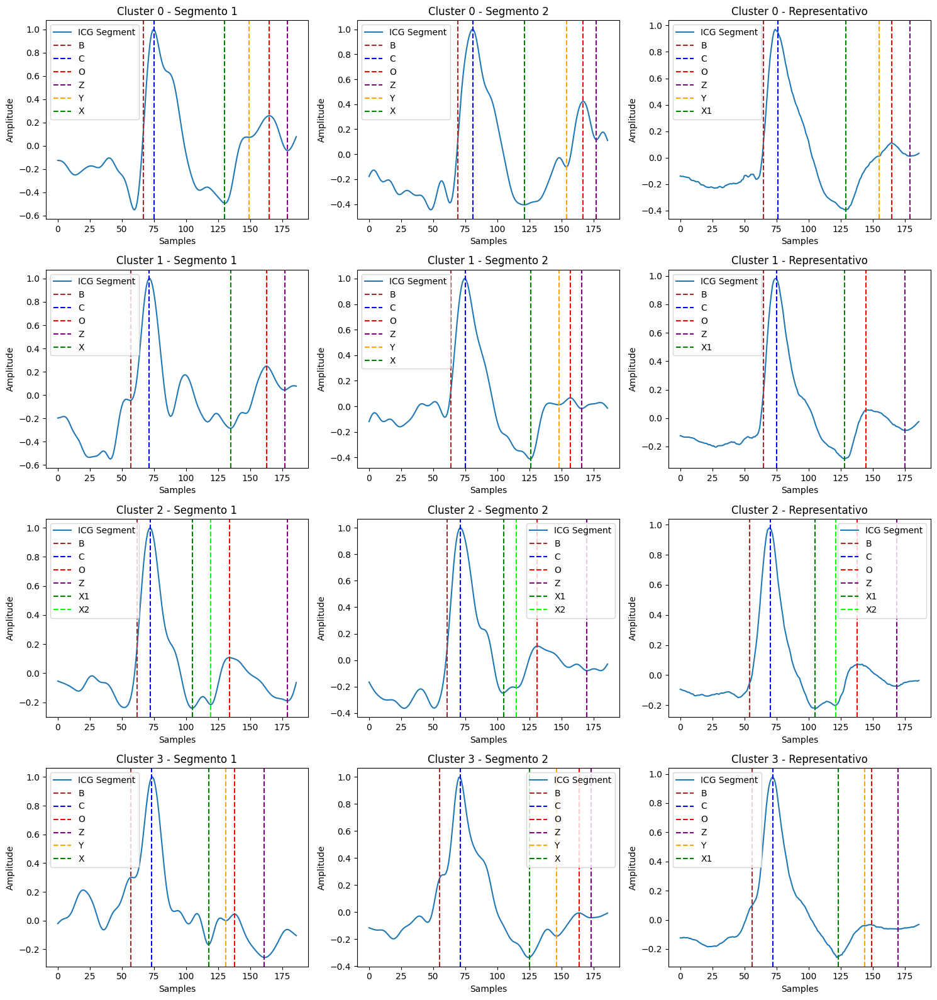

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt

N = 2  # Número de segmentos a visualizar por cluster
fs = 200  # Frecuencia de muestreo

def plot_segment_with_points(ax, segment, points, title=""):
    ax.plot(segment, label='ICG Segment')
    colors = {
        "B": "brown", "C": "blue", "X": "green", "X1": "green", "X2": "lime",
        "O": "red", "Z": "purple", "Y": "orange"
    }
    for label, index in points.items():
        if index is not None:
            ax.axvline(index, color=colors.get(label, 'black'), linestyle='--', label=label)
    ax.legend()
    ax.set_title(title)
    ax.set_xlabel('Samples')
    ax.set_ylabel('Amplitude')

def calculate_median_segment(segments):
    min_len = min(len(s) for s in segments)
    stacked = np.stack([s[:min_len] for s in segments])
    return np.median(stacked, axis=0)

num_clusters = k_optimo
fig, axes = plt.subplots(num_clusters, N + 1, figsize=(5 * (N + 1), 4 * num_clusters))

for cluster_id in range(num_clusters):
    # Extraer todos los segmentos del cluster actual, eliminando valores nulos
    segments = cluster_table[f'Cluster_{cluster_id}'].dropna().tolist()

    if len(segments) == 0:
        print(f"⚠️ Cluster {cluster_id} vacío.")
        continue

    # Seleccionar N segmentos aleatorios
    selected_segments = random.sample(segments, min(N, len(segments)))

    # Calcular el segmento representativo
    representative_segment = calculate_median_segment(segments)

    # Detectar puntos característicos en el segmento representativo
    C_peaks, _ = detect_C_peaks(representative_segment, fs)
    if len(C_peaks) == 0:
        print(f"⚠️ Cluster {cluster_id}: no se detectó pico C en el segmento representativo.")
        continue
    C_index = C_peaks[0]
    B_index = find_B_point(representative_segment, C_index, fs)
    resultado_X = detectar_punto_X(representative_segment, C_index, fs)
    O_index = detect_O_point(representative_segment, C_index, fs)
    Z_index = detect_Z_point(representative_segment, O_index, fs) if O_index else None
    Y_index = detectar_punto_Y(representative_segment, resultado_X, O_index, fs)

    puntos_repr = {"B": B_index, "C": C_index, "O": O_index, "Z": Z_index, "Y": Y_index}
    if resultado_X["caso"] == "X":
        puntos_repr["X"] = resultado_X["X"]
    elif resultado_X["caso"] == "X1":
        puntos_repr["X1"] = resultado_X["X1"]
    elif resultado_X["caso"] == "X1_X2":
        puntos_repr["X1"] = resultado_X["X1"]
        puntos_repr["X2"] = resultado_X["X2"]

    # Plot de segmentos individuales
    for i, segment in enumerate(selected_segments):
        C_peaks, _ = detect_C_peaks(segment, fs)
        if len(C_peaks) == 0:
            print(f"⚠️ Segmento en Cluster {cluster_id}: sin pico C.")
            continue
        C_index = C_peaks[0]
        B_index = find_B_point(segment, C_index, fs)
        resultado_X = detectar_punto_X(segment, C_index, fs)
        O_index = detect_O_point(segment, C_index, fs)
        Z_index = detect_Z_point(segment, O_index, fs) if O_index else None
        Y_index = detectar_punto_Y(segment, resultado_X, O_index, fs)

        puntos = {"B": B_index, "C": C_index, "O": O_index, "Z": Z_index, "Y": Y_index}
        if resultado_X["caso"] == "X":
            puntos["X"] = resultado_X["X"]
        elif resultado_X["caso"] == "X1":
            puntos["X1"] = resultado_X["X1"]
        elif resultado_X["caso"] == "X1_X2":
            puntos["X1"] = resultado_X["X1"]
            puntos["X2"] = resultado_X["X2"]

        plot_segment_with_points(axes[cluster_id, i], segment, puntos, title=f"Cluster {cluster_id} - Segmento {i+1}")

    # Plot del segmento representativo
    plot_segment_with_points(axes[cluster_id, N], representative_segment, puntos_repr, title=f"Cluster {cluster_id} - Representativo")

plt.tight_layout()
plt.show()


###**HDBSCAN:**

In [ ]:
!pip install hdbscan


In [ ]:
import hdbscan
from sklearn.preprocessing import StandardScaler

# Extraer solo las señales para clustering (subcomplejos V)
X = np.stack(v_segments['Segment'].values)

# Escalar cada segmento para que el clustering no se vea afectado por amplitudes distintas
X_scaled = StandardScaler().fit_transform(X)

# Aplicar HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=200, min_samples=50, metric='euclidean')
#min_cluster_size=200: Cada grupo debe tener al menos 200 segmentos.
#min_samples=50: Un punto necesita tener al menos 50 vecinos cercanos para no considerarse ruido.
#Estas restricciones se han añadido para disminuir el número de clusters obtenidos y disminuir el número de segmentos marcados como ruido.
labels = clusterer.fit_predict(X_scaled)

# Guardar etiquetas en el DataFrame
v_segments['Cluster_HDBSCAN'] = labels

# Ver resultados
print(f"Número de clusters encontrados (sin contar ruido): {len(set(labels)) - (1 if -1 in labels else 0)}")
print(f"Número de segmentos marcados como ruido: {(labels == -1).sum()}")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Número de clusters encontrados (sin contar ruido): 4
Número de segmentos marcados como ruido: 9078


<ipython-input-15-14eb51b45a53>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v_segments['Cluster_HDBSCAN'] = labels


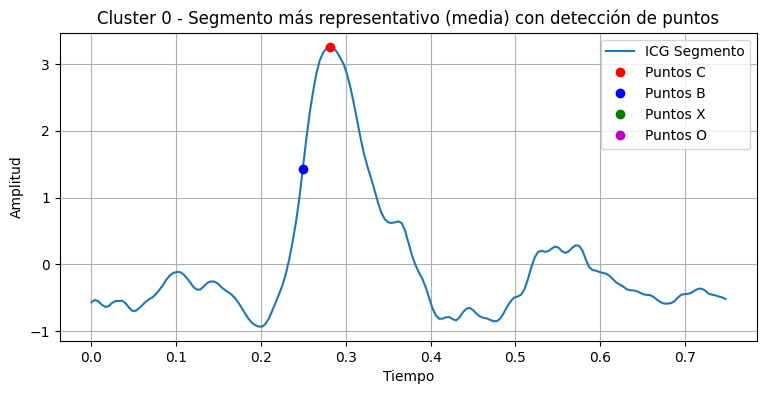

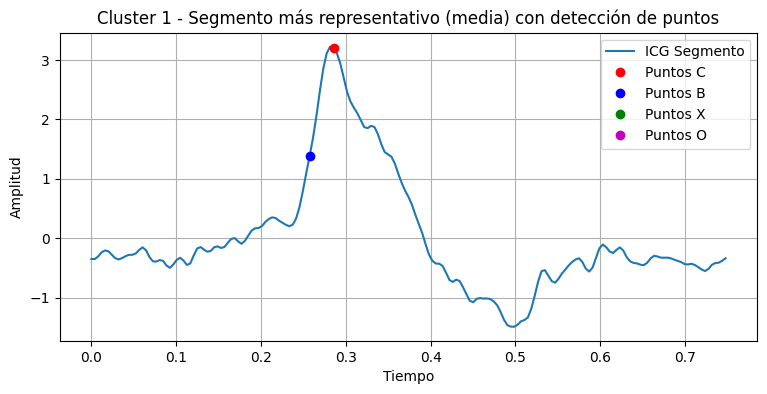

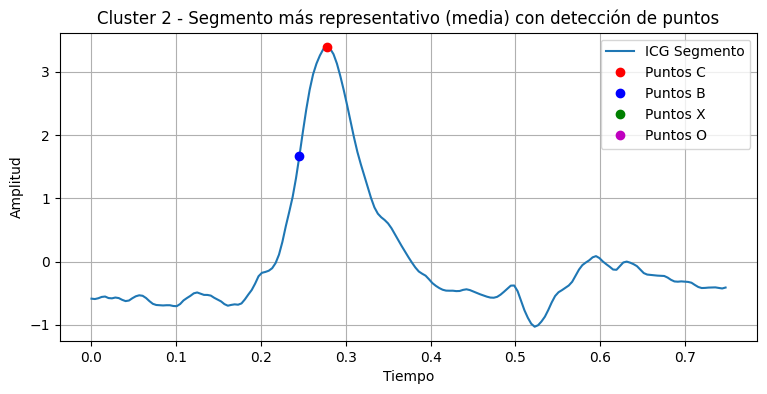

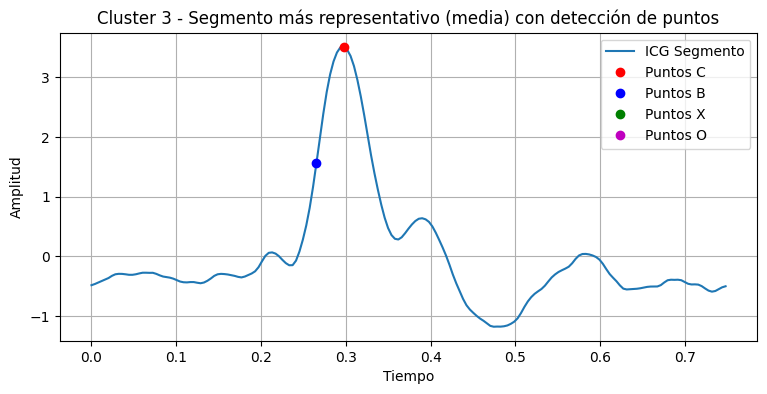

In [ ]:
#A continuación visualizaremos la señal representativa de cada cluster obtenido basado en la MEDIA.
from scipy.spatial.distance import cdist

for cluster_id in sorted(v_segments['Cluster_HDBSCAN'].unique()):
    if cluster_id == -1:
        continue  # Ignorar el ruido

    cluster_data = v_segments[v_segments['Cluster_HDBSCAN'] == cluster_id]
    segments = np.stack(cluster_data['Segment'].values)

    # Calcular la media
    mean_segment = np.mean(segments, axis=0)
    distances = cdist(segments, [mean_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segments[closest_idx]

    #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (media) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()

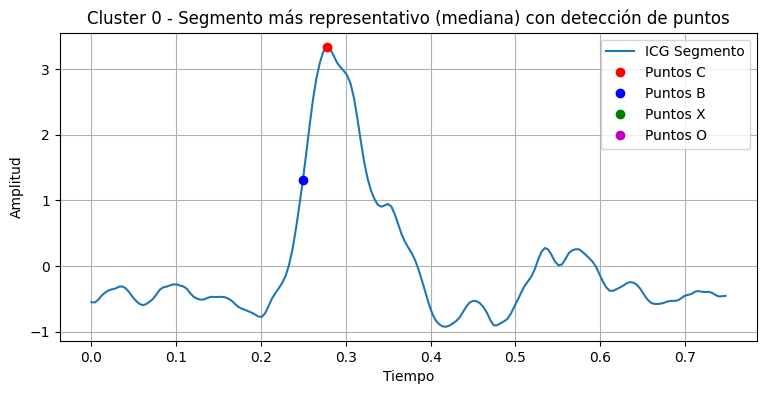

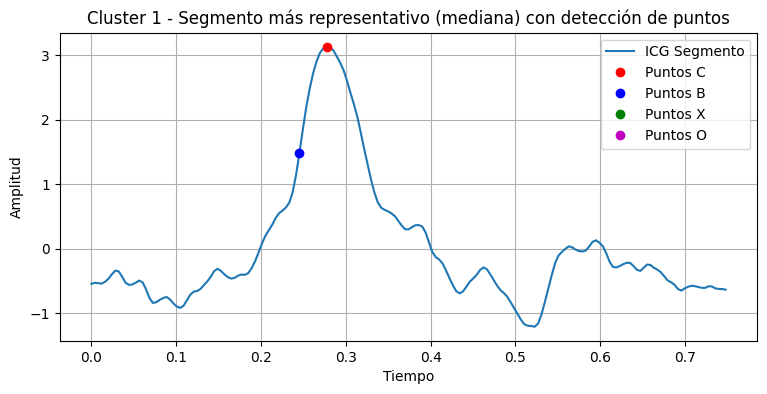

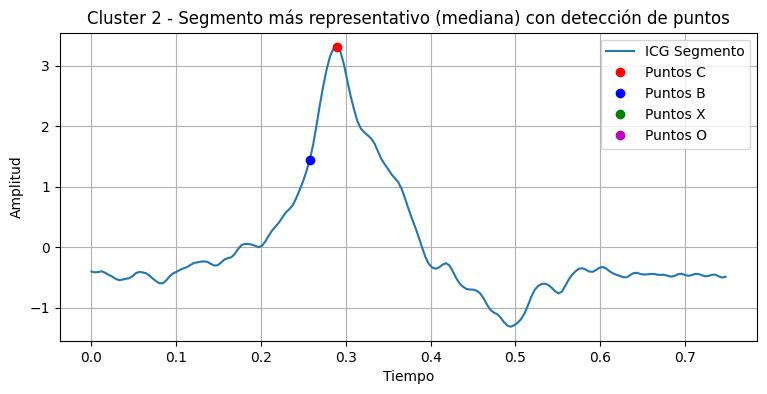

In [ ]:
#A continuación visualizaremos la señal representativa de cada cluster obtenido basado en la MEDIANA.
from scipy.spatial.distance import cdist

for cluster_id in sorted(v_segments['Cluster_HDBSCAN'].unique()):
    if cluster_id == -1:
        continue  # Ignorar el ruido

    cluster_data = v_segments[v_segments['Cluster_HDBSCAN'] == cluster_id]
    segments = np.stack(cluster_data['Segment'].values)

    # Calcular la mediana
    median_segment = np.median(segments, axis=0)
    distances = cdist(segments, [median_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segments[closest_idx]

    #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (mediana) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()

Cluster 0 - Varianza media entre señales: 0.03


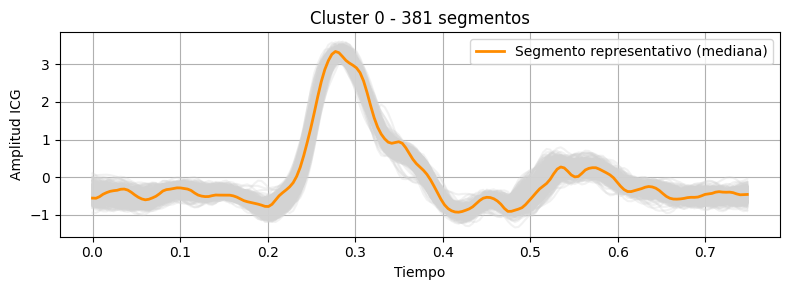

Cluster 1 - Varianza media entre señales: 0.10


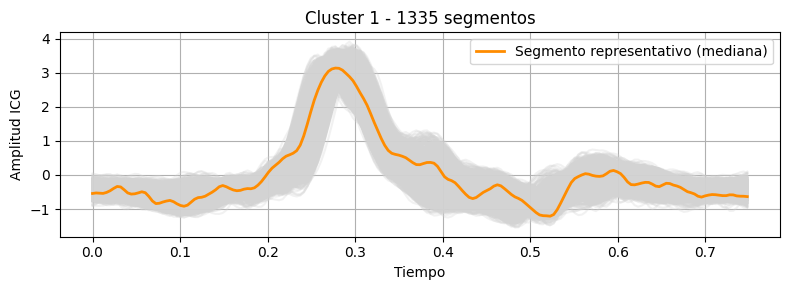

Cluster 2 - Varianza media entre señales: 0.03


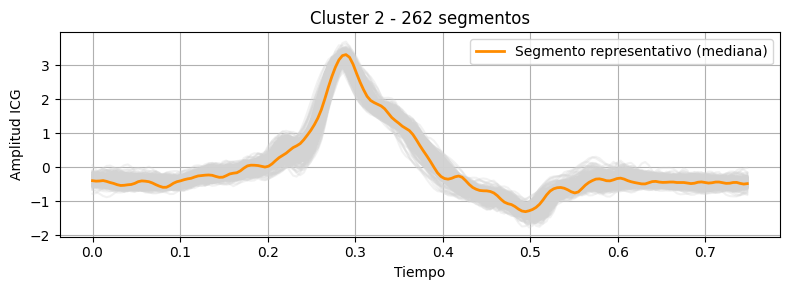

In [ ]:
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import numpy as np

# Obtener los clusters únicos generados por HDBSCAN (excepto el -1, que es ruido)
unique_clusters = sorted(v_segments['Cluster_HDBSCAN'].unique())
unique_clusters = [c for c in unique_clusters if c != -1]

for cluster_id in unique_clusters:
    cluster_data = v_segments[v_segments['Cluster_HDBSCAN'] == cluster_id]['Segment']

    if len(cluster_data) == 0:
        continue  # Evitar errores si el cluster está vacío

    segment_matrix = np.stack(cluster_data.values)

    # Calcular la mediana punto a punto
    median_segment = np.median(segment_matrix, axis=0)

    # Calcular la distancia de cada segmento a la mediana
    distances = cdist(segment_matrix, [median_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

    # Plot
    plt.figure(figsize=(8, 3))
    for segment in segment_matrix:
        plt.plot(tiempo, segment, color='lightgray', alpha=0.3)

    #Calcular la varianza entre las señales de un mismo cluster
    variance = np.var(segment_matrix, axis=0)
    mean_variance = np.mean(variance)
    print(f"Cluster {cluster_id} - Varianza media entre señales: {mean_variance:.2f}")

    plt.plot(tiempo, representative_segment, color='darkorange', linewidth=2, label='Segmento representativo (mediana)')

    plt.title(f"Cluster {cluster_id} - {len(segment_matrix)} segmentos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud ICG")
    plt.legend()
    plt.tight_layout()
    plt.grid(True)
    plt.show()


Este algortimo la primera vez que lo he ejecutado me proporcionaba 18 clusters y 10291 segmentos marcados como ruido. Sin embargo, al añadir las 2 restricciones marcadas en el código, he obtenido directamente 6 clusters y menos segmentos marcados con ruido, lo cual cobra bastante sentido. No obstante, a continuación analizaremos algún otro método.


###**HDBSCAN v2:**

Esta versión a diferencia de la anterior no se basa en la distancia euclídea (que no tiene en cuenta información acerca de la morfología de la señal). Además, los parámetros min_cluster_size y min_samples se han ajustado. Teóricamente con estos cambios deberíamos obtener un menor número de muestras como ruido.

In [ ]:
!pip install hdbscan

Calculando matriz de distancias DTW...
Aplicando HDBSCAN...
✅ Clusters encontrados: 3
❌ Segmentos marcados como ruido: 882


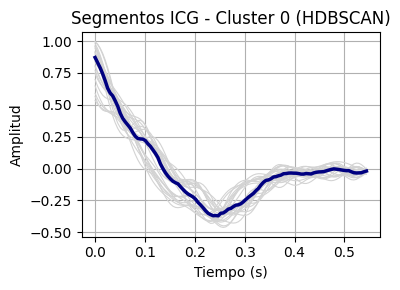

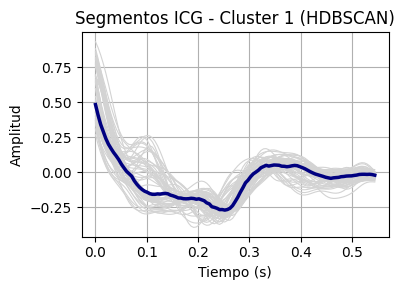

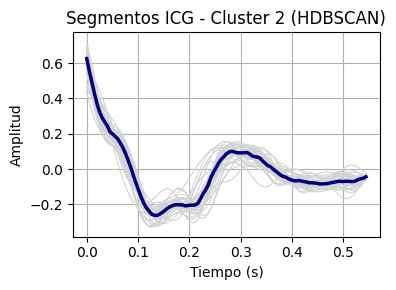

In [ ]:
import numpy as np
import hdbscan
from tslearn.metrics import cdist_dtw
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Frecuencia de muestreo
fs = 198.46762

# 1. Extraer matriz de segmentos
v_segments_sample = v_segments['Segment_partial'].sample(n=1000, random_state=42).reset_index(drop=True)
X = np.stack(v_segments_sample.values)
t = np.arange(X.shape[1]) / fs  # vector tiempo en segundos

# 2. Escalado individual
X_scaled = StandardScaler().fit_transform(X)

# 3. Matriz DTW
window_size = int(0.1 * X.shape[1])
print("Calculando matriz de distancias DTW...")
dtw_distances = cdist_dtw(X_scaled, global_constraint="sakoe_chiba", sakoe_chiba_radius=window_size)

# 4. Clustering HDBSCAN
clusterer = hdbscan.HDBSCAN(
    metric='precomputed',
    min_cluster_size=10,
    min_samples=10
)

print("Aplicando HDBSCAN...")
labels = clusterer.fit_predict(dtw_distances)

# 5. Resultados
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = np.sum(labels == -1)

print(f"✅ Clusters encontrados: {n_clusters}")
print(f"❌ Segmentos marcados como ruido: {n_noise}")

# 6. Plot por cluster (excluyendo el ruido: label = -1)
for cluster_id in np.unique(labels):
    if cluster_id == -1:
        continue  # ignorar ruido

    cluster_indices = np.where(labels == cluster_id)[0]
    cluster_segments = X[cluster_indices]

    # Calcular señal representativa como la mediana punto a punto
    representative_segment = np.median(cluster_segments, axis=0)

    plt.figure(figsize=(4, 3))

    for segment in cluster_segments:
        plt.plot(t, segment, color='lightgray', linewidth=0.8)

    plt.plot(t, representative_segment, color='navy', linewidth=2.5)
    plt.title(f'Segmentos ICG - Cluster {cluster_id} (HDBSCAN)')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


No entiendo muy bien la gran variabilidad de este método. Además, marca muchísimos segmentos como ruido cuando en realidad no lo son y no sé cómo modificarlo.

###**Spectral clustering**:

In [ ]:
from sklearn.cluster import SpectralClustering
import numpy as np

# Convertimos la columna 'Segment' a una matriz para clustering
X = np.stack(v_segments['Segment'].values)

# Número de clusters deseado
n_clusters = 6

# Aplicamos el clustering espectral
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42)
labels = spectral.fit_predict(X)
#Aquí podría ajustar algunos parámetros: affinity='nearest_neighbors', assign_labels='kmeans'

# Añadimos los resultados al DataFrame
v_segments['Cluster_Spectral'] = labels


<ipython-input-33-18d56b8dc38c>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v_segments['Cluster_Spectral'] = labels


Cluster 0 - Varianza media entre señales: 0.17


<ipython-input-34-bc583769c66e>:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


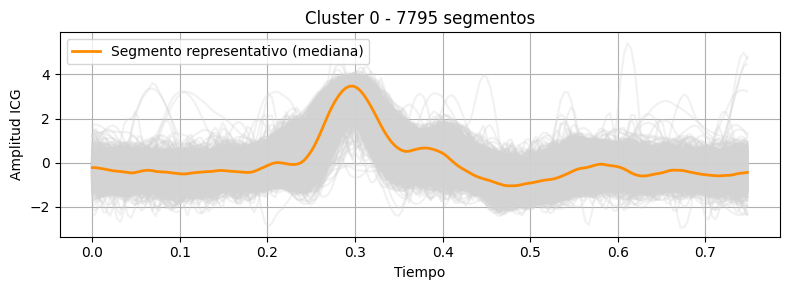

Cluster 1 - Varianza media entre señales: 0.10


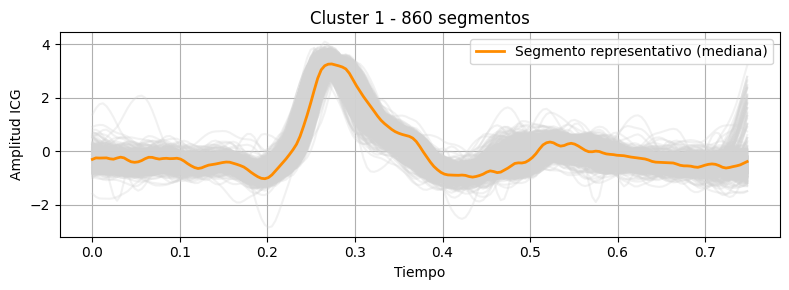

Cluster 2 - Varianza media entre señales: 0.05


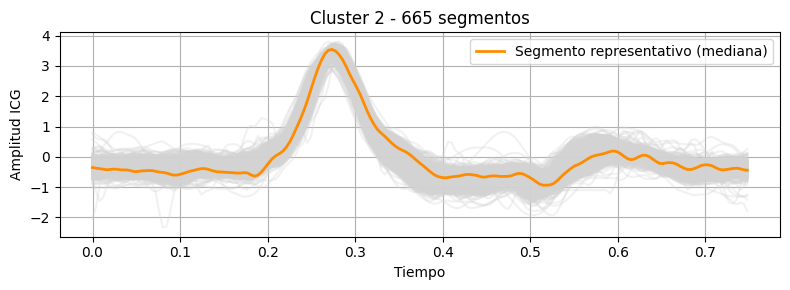

Cluster 3 - Varianza media entre señales: 0.12


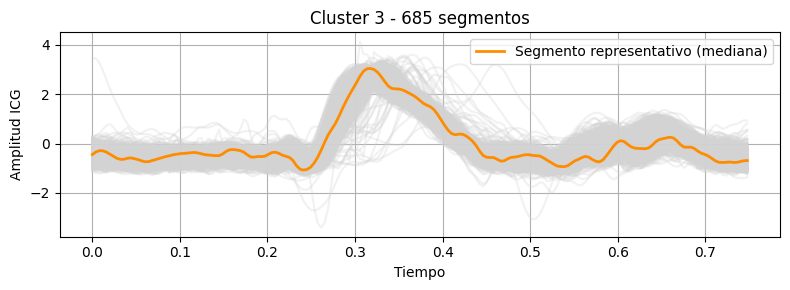

Cluster 4 - Varianza media entre señales: 0.09


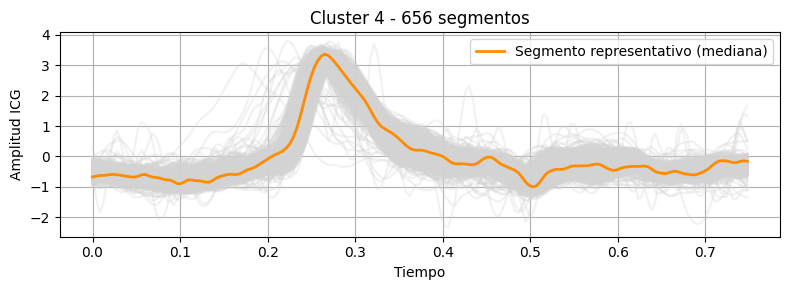

Cluster 5 - Varianza media entre señales: 0.16


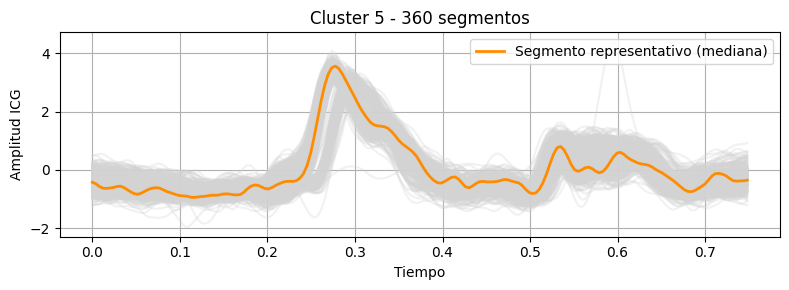

In [ ]:
# Visualización por cluster con segmento representativo (mediana)
unique_clusters = sorted(v_segments['Cluster_Spectral'].unique())

for cluster_id in unique_clusters:
    cluster_data = v_segments[v_segments['Cluster_Spectral'] == cluster_id]['Segment']

    if len(cluster_data) == 0:
        continue

    segment_matrix = np.stack(cluster_data.values)
    median_segment = np.median(segment_matrix, axis=0)
    distances = cdist(segment_matrix, [median_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]


    plt.figure(figsize=(8, 3))
    for segment in segment_matrix:
        plt.plot(tiempo, segment, color='lightgray', alpha=0.3)

    #Calcular la varianza entre las señales de un mismo cluster
    variance = np.var(segment_matrix, axis=0)
    mean_variance = np.mean(variance)
    print(f"Cluster {cluster_id} - Varianza media entre señales: {mean_variance:.2f}")

    plt.plot(tiempo, representative_segment, color='darkorange', linewidth=2, label='Segmento representativo (mediana)')
    plt.title(f"Cluster {cluster_id} - {len(segment_matrix)} segmentos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud ICG")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


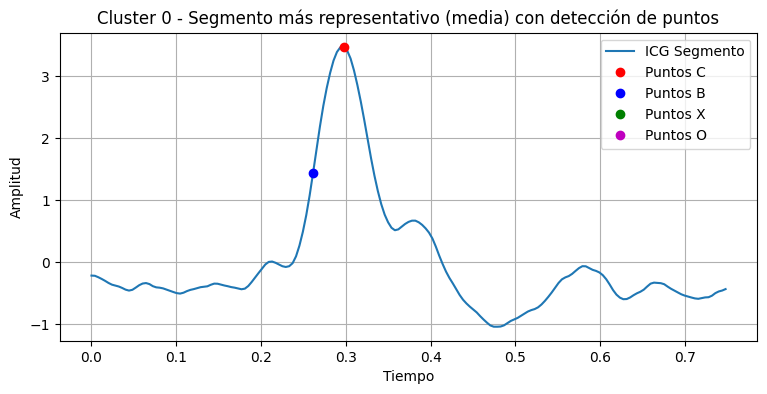

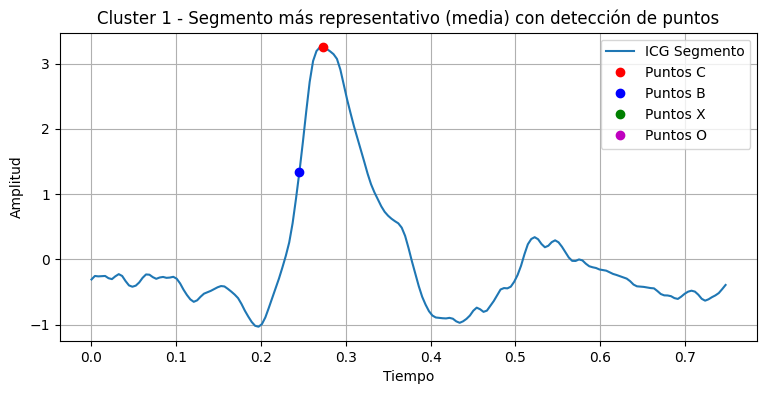

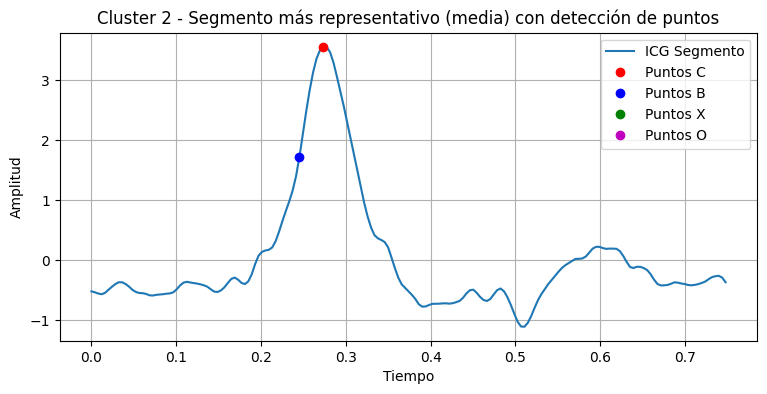

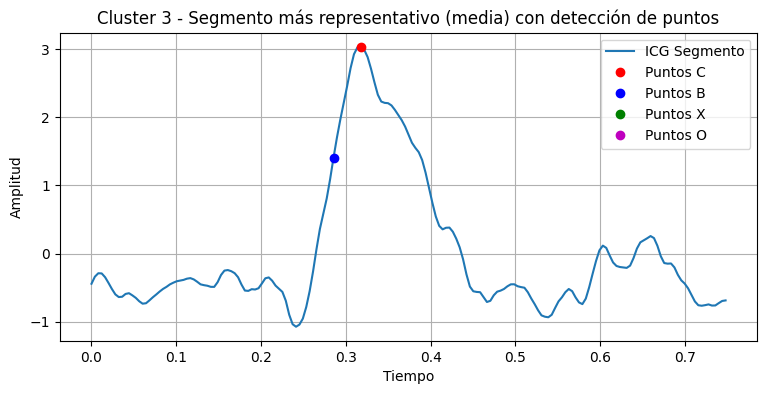

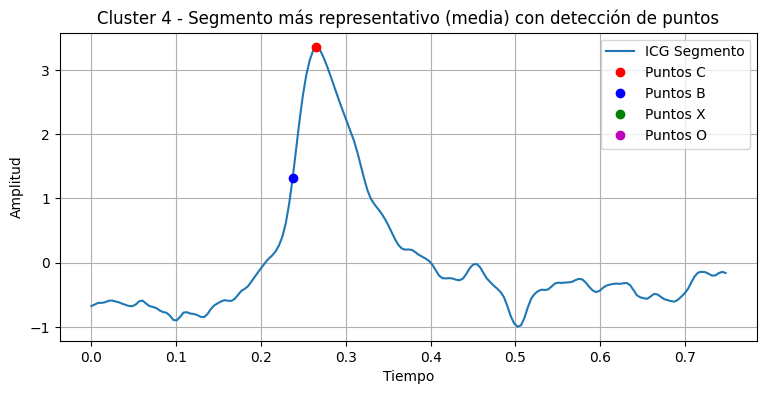

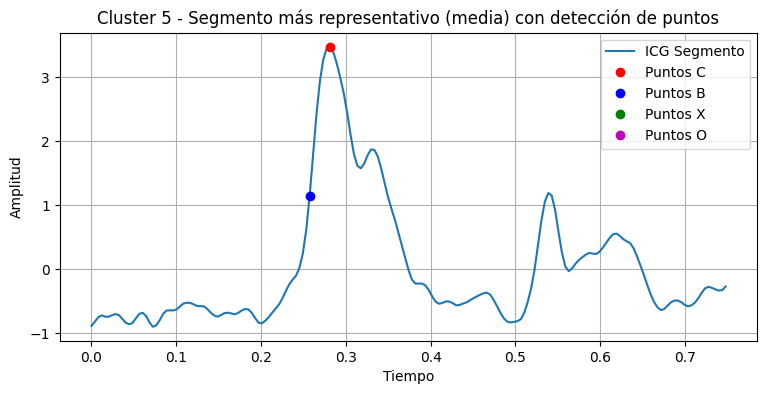

In [ ]:
#Plots de segmento más representativo del cluster basado en la MEDIA
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import numpy as np

# Lista de clusters únicos (ordenados por número para claridad)
unique_clusters = sorted(v_segments['Cluster_Spectral'].unique())

for cluster_id in unique_clusters:
    cluster_data = v_segments[v_segments['Cluster_Spectral'] == cluster_id]['Segment']

    if len(cluster_data) == 0:
        continue

    # Convertimos a matriz para cálculo
    segment_matrix = np.stack(cluster_data.values)

    # Media punto a punto
    mean_segment = np.mean(segment_matrix, axis=0)

    # Elegimos el segmento más cercano a la mediana
    distances = cdist(segment_matrix, [mean_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

     #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (media) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()

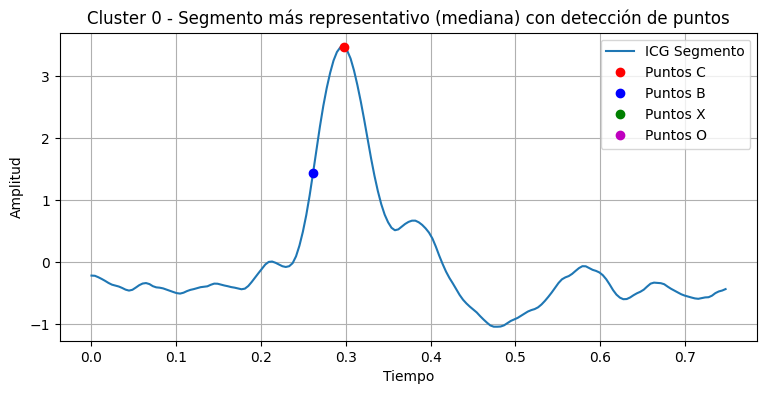

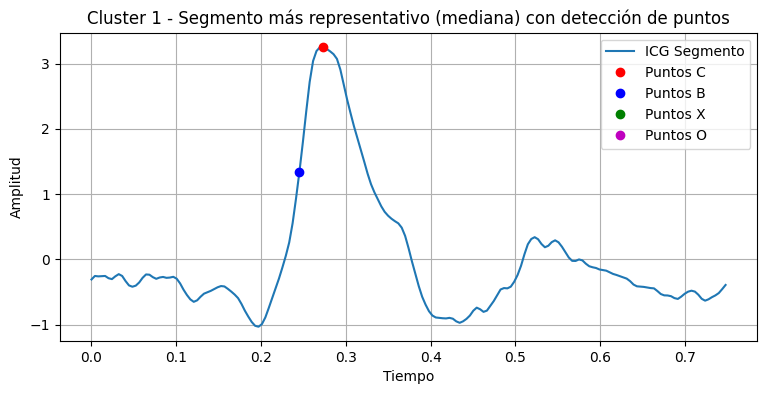

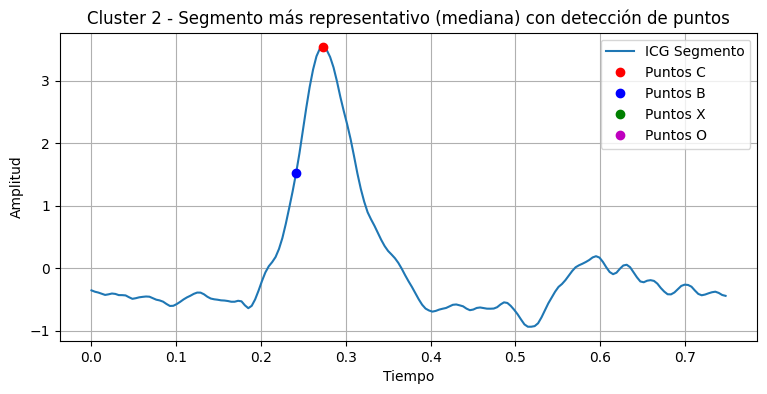

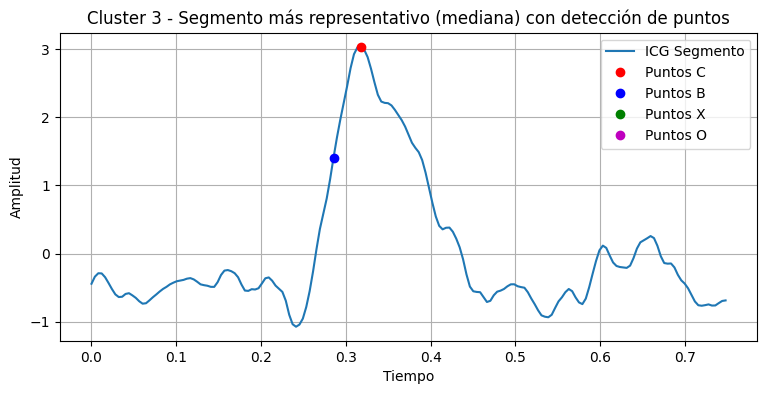

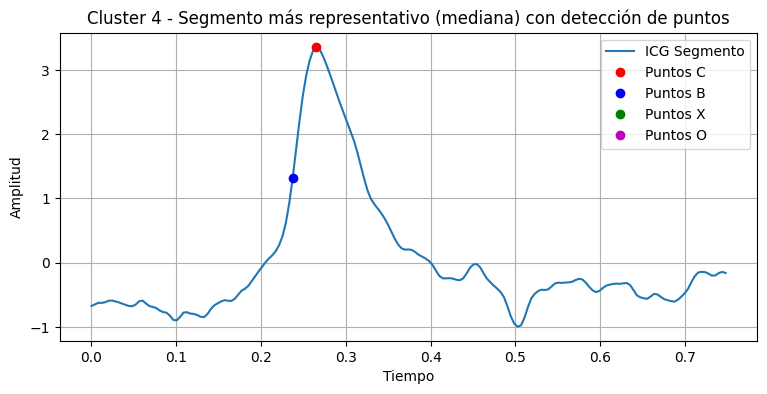

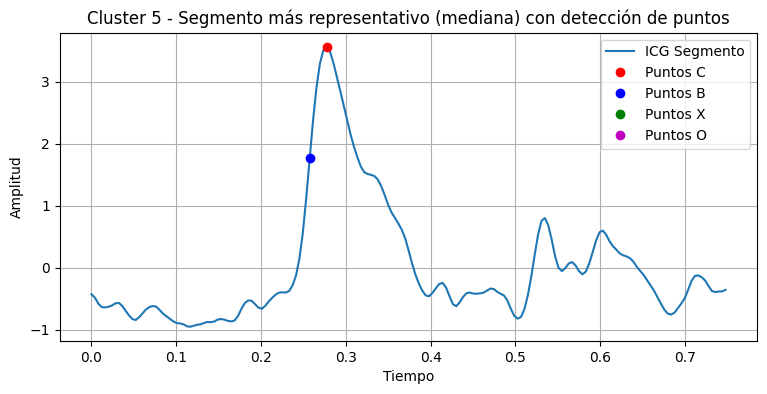

In [ ]:
#Plots de segmento más representativo del cluster basado en la MEDIANA
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import numpy as np

# Lista de clusters únicos (ordenados por número para claridad)
unique_clusters = sorted(v_segments['Cluster_Spectral'].unique())

for cluster_id in unique_clusters:
    cluster_data = v_segments[v_segments['Cluster_Spectral'] == cluster_id]['Segment']

    if len(cluster_data) == 0:
        continue

    # Convertimos a matriz para cálculo
    segment_matrix = np.stack(cluster_data.values)

    # Mediana punto a punto
    median_segment = np.median(segment_matrix, axis=0)

    # Elegimos el segmento más cercano a la mediana
    distances = cdist(segment_matrix, [median_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

     #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (mediana) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()


###**Hierarchical Clustering (Agglomerative):**

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

# Convertimos los segmentos en una matriz (cada fila = un segmento)
segment_matrix = np.stack(v_segments['Segment'].values)

# Clustering jerárquico
n_clusters = 6
agglo = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')

labels = agglo.fit_predict(segment_matrix)

# Guardamos los clusters en el DataFrame
v_segments['Cluster_HC'] = labels


<ipython-input-37-2d011e19968c>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v_segments['Cluster_HC'] = labels


Cluster 0 - Varianza media entre señales: 0.10


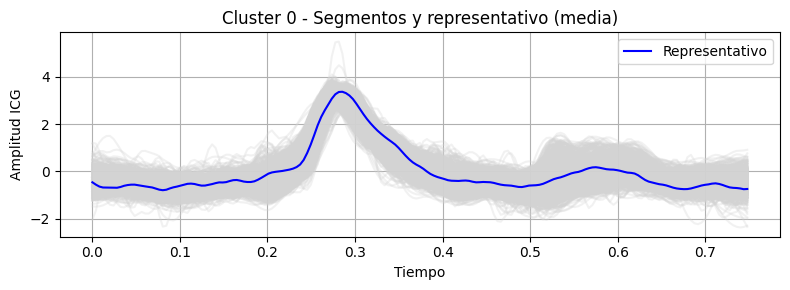

Cluster 1 - Varianza media entre señales: 0.16


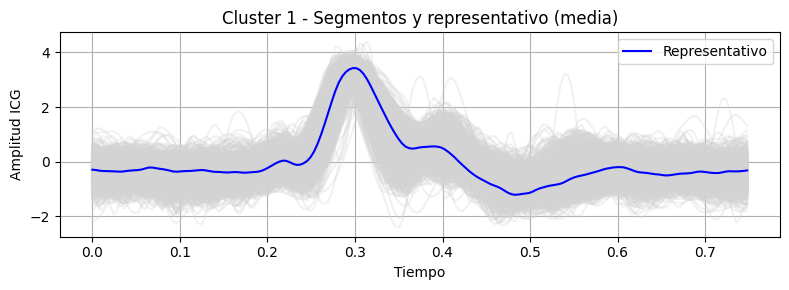

Cluster 2 - Varianza media entre señales: 0.11


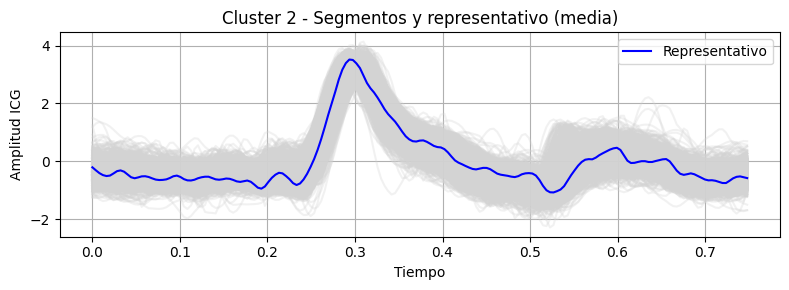

Cluster 3 - Varianza media entre señales: 0.11


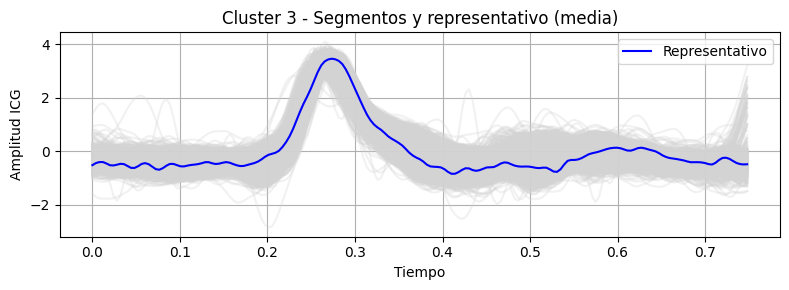

Cluster 4 - Varianza media entre señales: 0.13


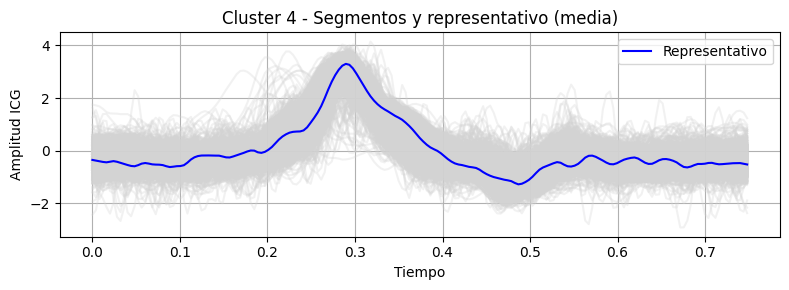

Cluster 5 - Varianza media entre señales: 0.15


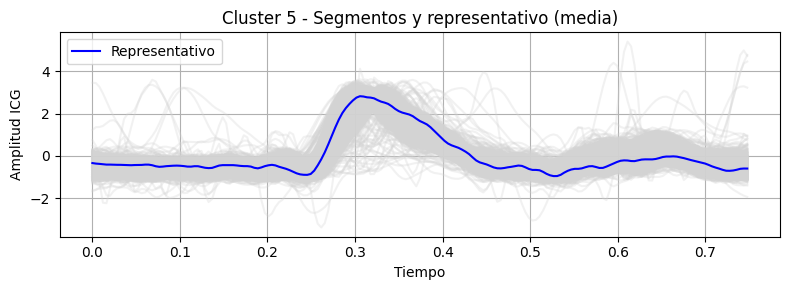

In [ ]:
for cluster_id in range(n_clusters):
    cluster_data = v_segments[v_segments['Cluster_HC'] == cluster_id]['Segment']
    segment_matrix = np.stack(cluster_data.values)

    # Calcular la media
    mean_segment = np.mean(segment_matrix, axis=0)

    # Calcular la distancia de cada segmento al promedio
    distances = cdist(segment_matrix, [mean_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

    #Calcular la varianza entre las señales de un mismo cluster
    variance = np.var(segment_matrix, axis=0)
    mean_variance = np.mean(variance)
    print(f"Cluster {cluster_id} - Varianza media entre señales: {mean_variance:.2f}")

    # Plot
    plt.figure(figsize=(8, 3))
    for segment in segment_matrix:
        plt.plot(tiempo, segment, color='lightgray', alpha=0.3)

    plt.plot(tiempo, representative_segment, color='blue', linewidth=1.5, label='Representativo')
    plt.title(f"Cluster {cluster_id} - Segmentos y representativo (media)")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud ICG")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


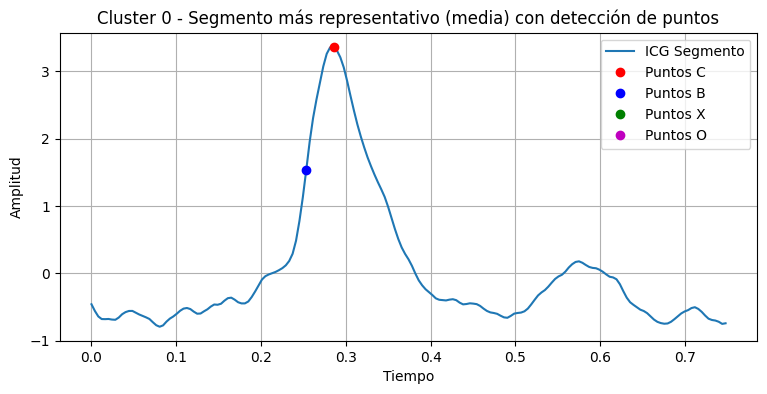

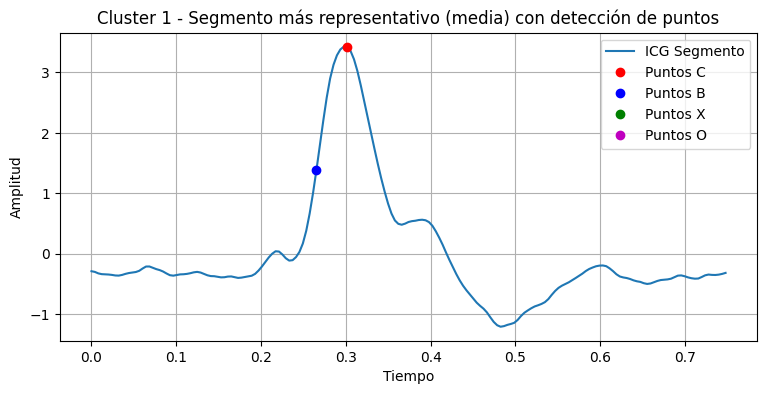

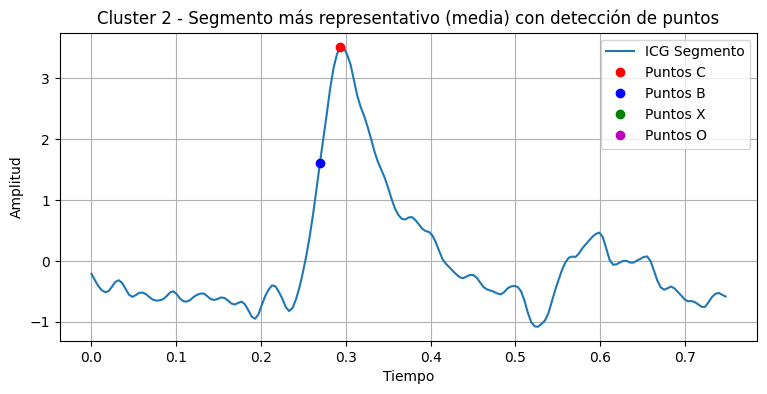

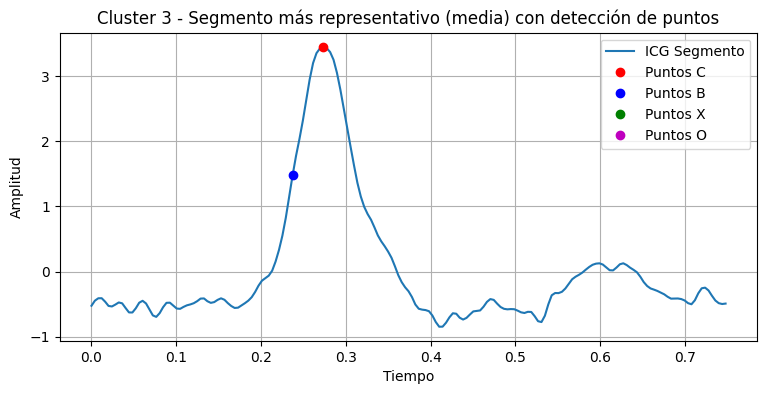

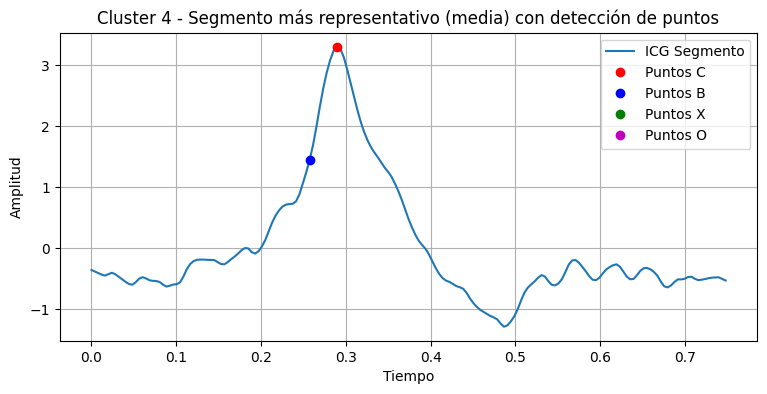

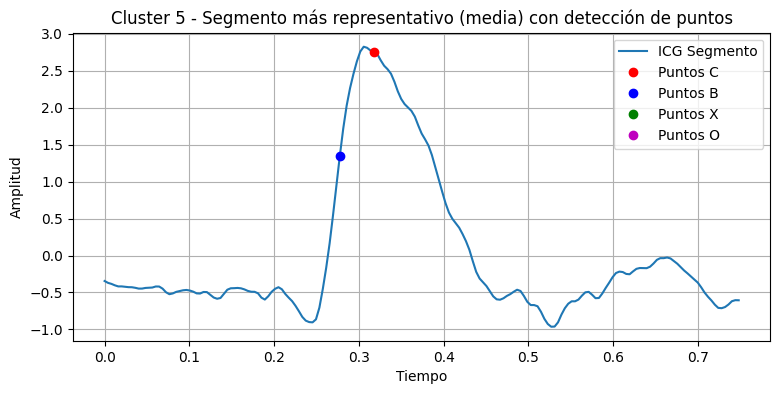

In [ ]:
#Representación de curva más representativa de cada cluster en función de la media
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import numpy as np

# Asegúrate de que df_segments tenga una columna 'Cluster'
# Y que cada fila en la columna 'Segment' contenga un array 1D

n_clusters = v_segments['Cluster_HC'].nunique()

for cluster_id in range(n_clusters):
    cluster_data = v_segments[v_segments['Cluster_HC'] == cluster_id]['Segment']
    segment_matrix = np.stack(cluster_data.values)


    central_segment = np.mean(segment_matrix, axis=0)

    # Calcular la distancia entre cada segmento y el central (media o mediana)
    distances = cdist(segment_matrix, [central_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]
    #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (media) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()


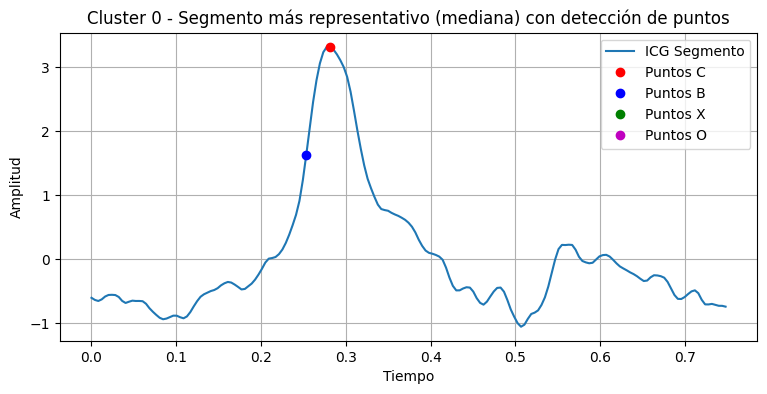

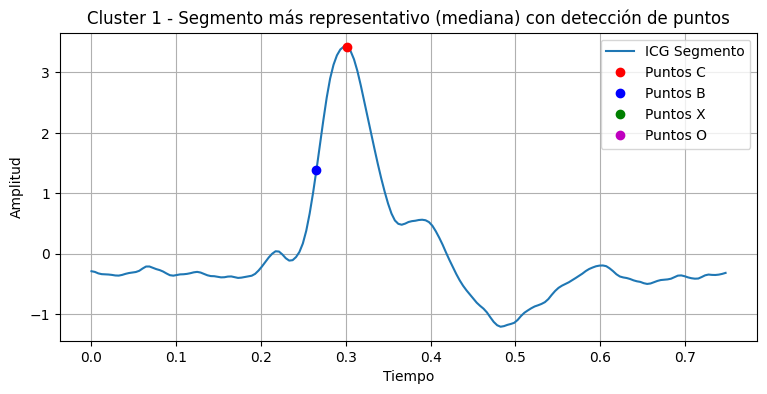

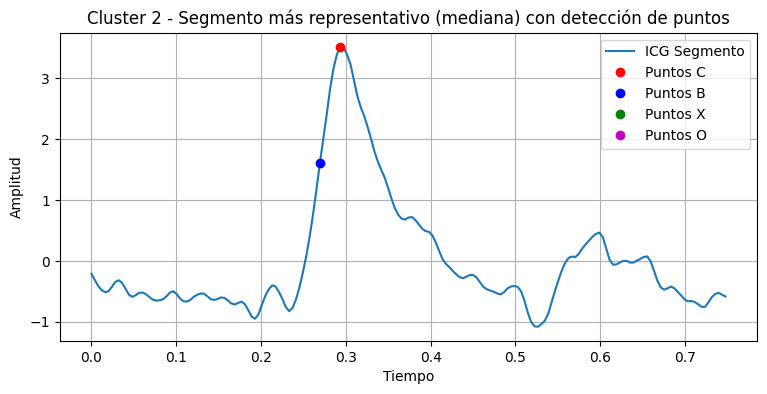

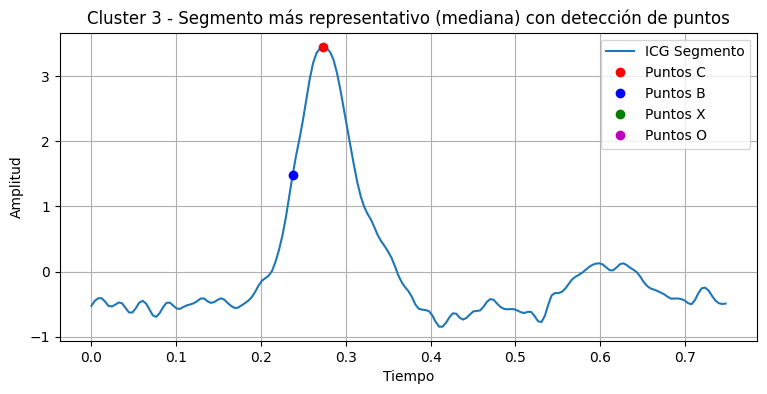

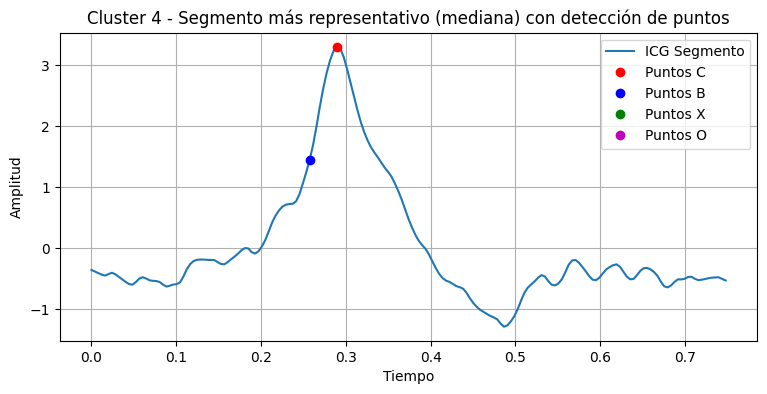

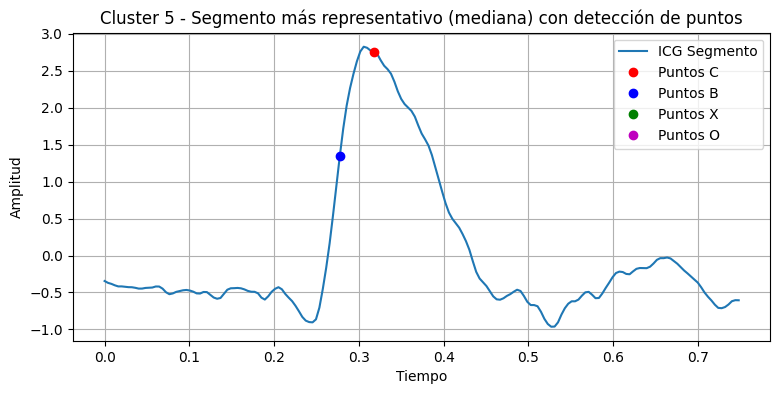

In [ ]:
#Representación de curva más representativa de cada cluster en función de la mediana
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import numpy as np

# Asegúrate de que df_segments tenga una columna 'Cluster'
# Y que cada fila en la columna 'Segment' contenga un array 1D

n_clusters = v_segments['Cluster_HC'].nunique()

for cluster_id in range(n_clusters):
    cluster_data = v_segments[v_segments['Cluster_HC'] == cluster_id]['Segment']
    segment_matrix = np.stack(cluster_data.values)


    central_segment = np.median(segment_matrix, axis=0)

    # Calcular la distancia entre cada segmento y el central (media o mediana)
    distances = cdist(segment_matrix, [central_segment], metric='euclidean')
    closest_idx = np.argmin(distances)
    representative_segment = segment_matrix[closest_idx]

        #Aplicamos ahora el algoritmo de delineación
    fs=250
    C_peaks, Xre = detect_C_peaks(representative_segment, fs)
    B_points = []
    for Cpos in C_peaks:
      B_idx = find_B_point(representative_segment, Cpos, fs)
      B_points.append(B_idx)
    X_points = []
    O_points = []
    for Cpos in C_peaks:
      X, O = find_XO_points(representative_segment, Cpos, fs)
      X_points.append(X)
      O_points.append(O)
    plt.figure(figsize=(9, 4))
    plt.plot(tiempo, representative_segment, label="ICG Segmento")
    plt.plot(tiempo[C_peaks], representative_segment[C_peaks], 'ro', label="Puntos C")
    plt.plot(tiempo[B_points], representative_segment[B_points], 'bo', label="Puntos B")
    plt.plot(X_points, [representative_segment[x] if x is not None else np.nan for x in X_points], 'go', label="Puntos X")
    plt.plot(O_points, [representative_segment[o] if o is not None else np.nan for o in O_points], 'mo', label="Puntos O")
    plt.legend()
    plt.title(f"Cluster {cluster_id} - Segmento más representativo (mediana) con detección de puntos")
    plt.xlabel("Tiempo")
    plt.ylabel("Amplitud")
    plt.grid(True)
    plt.show()

#####Bien, finalmente podemos concluir que hemos aplicado 4 algoritmos de clustering. Estos algoritmos se han aplicado sobre los segmentos de icg clasificados como subcomplejos V (válidos). El resultado de la clasificación obtenida para cada segmento se ha alamacenado en una columna del dataframe v_segments llamada cluster_(técnica de clustering)

###**Hierarchical clustering V2:**

A diferencia del caso anterior, el número de clusters no es definido como input sino que se obtiene el dendrograma y se corta el árbol en el punto que minimice la métrica silhouette.

In [ ]:
pip install tslearn scipy matplotlib scikit-learn


Calculando matriz de distancias DTW con ventana Sakoe-Chiba...
Realizando clustering jerárquico...


<ipython-input-21-53415c47b75d>:47: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dtw_distances, method='average')


Evaluando diferentes métricas de calidad para K = 2 a 7...
K=2: Silhouette=0.7533, DBI=0.2635, CH=13.14, Dunn=0.5591
K=3: Silhouette=0.5205, DBI=1.7942, CH=10.05, Dunn=0.2373
K=4: Silhouette=0.4398, DBI=1.0000, CH=10.55, Dunn=0.2468
K=5: Silhouette=0.3193, DBI=1.4365, CH=29.72, Dunn=0.1177
K=6: Silhouette=0.2440, DBI=1.7417, CH=29.74, Dunn=0.1177
K=7: Silhouette=0.1740, DBI=1.5268, CH=28.34, Dunn=0.1259


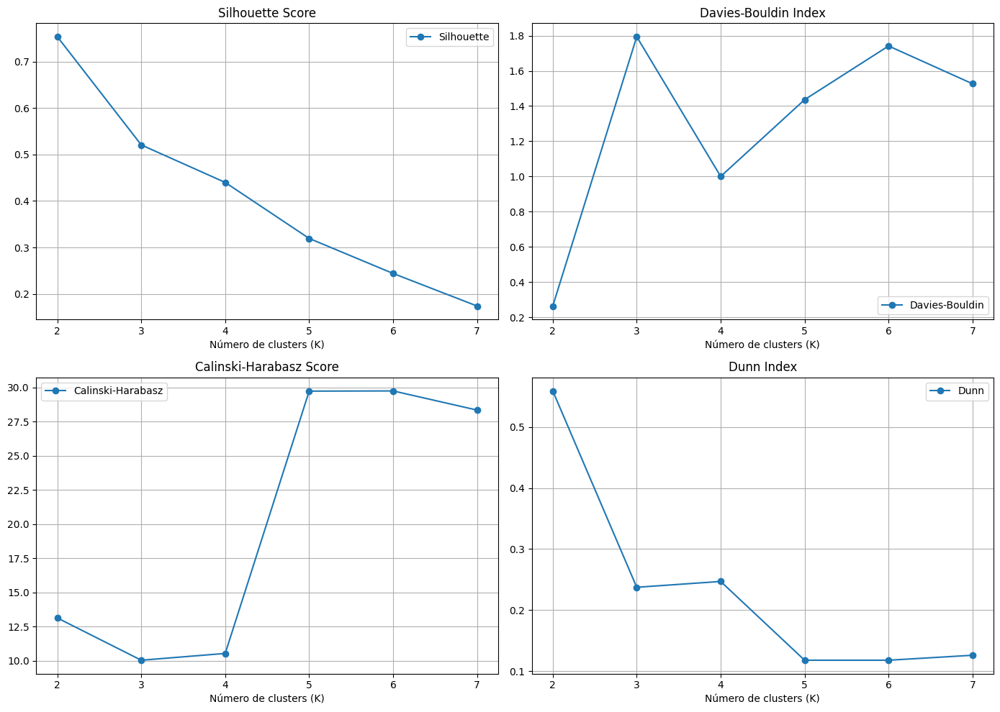


🔹 Silhouette -> K óptimo: 2


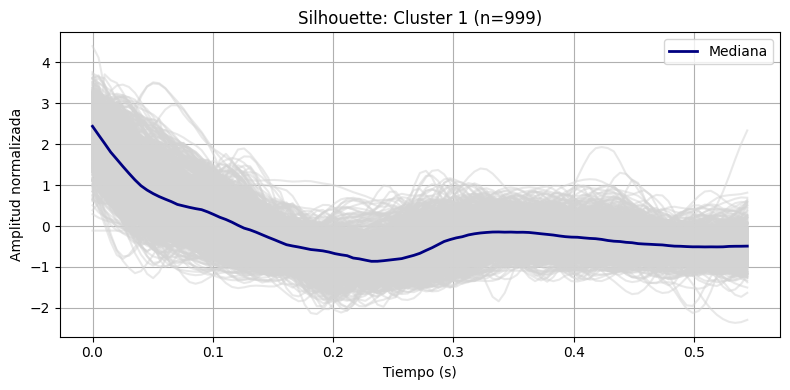

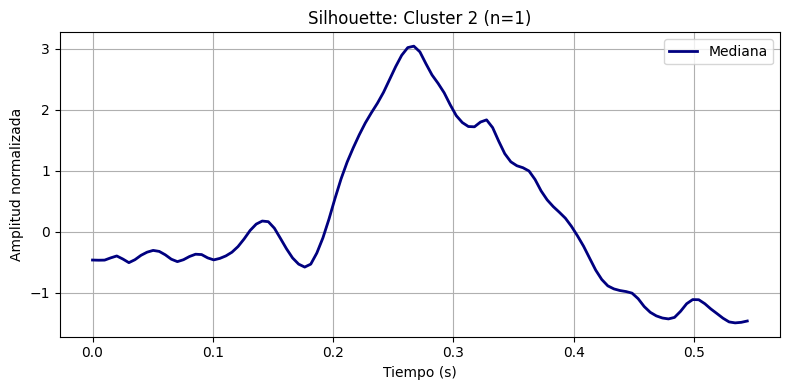


🔹 Davies-Bouldin -> K óptimo: 2


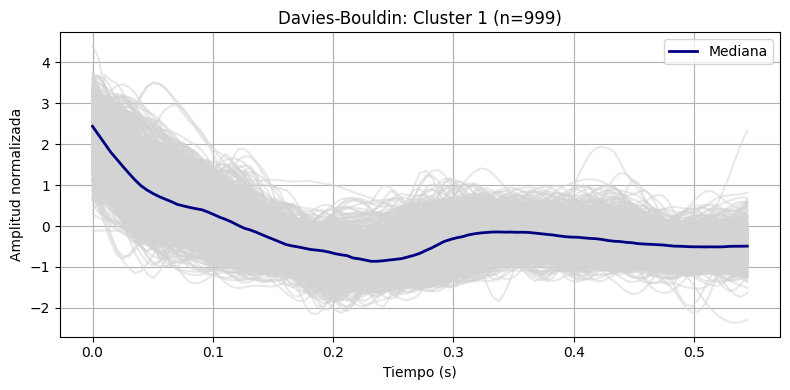

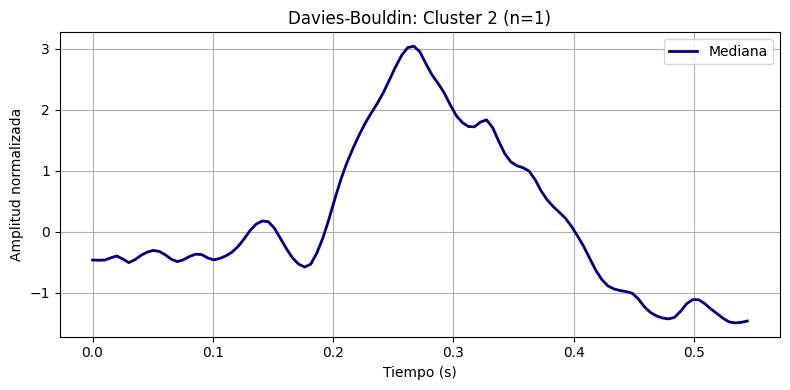


🔹 Calinski-Harabasz -> K óptimo: 6


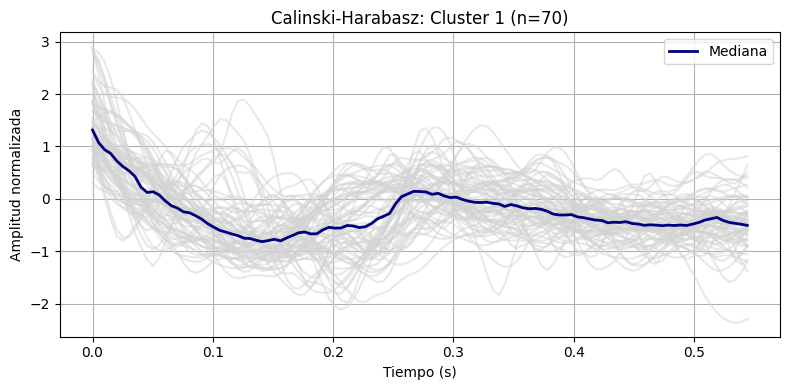

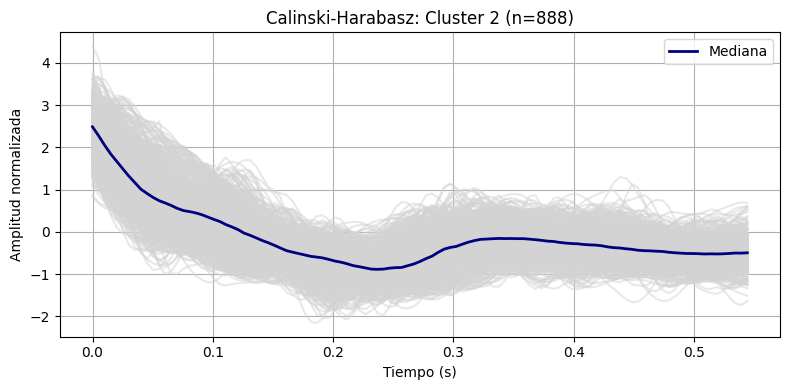

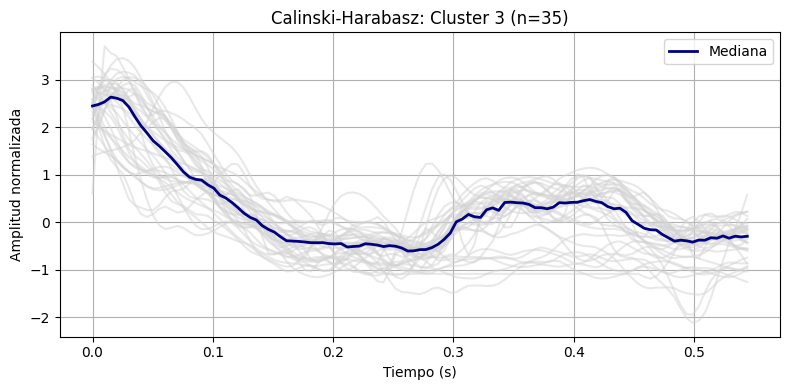

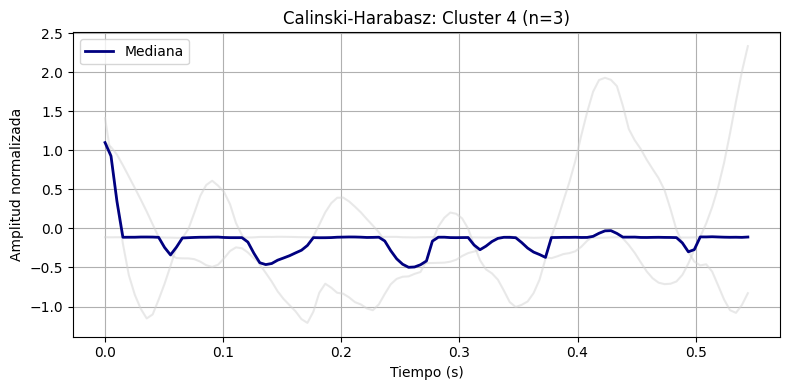

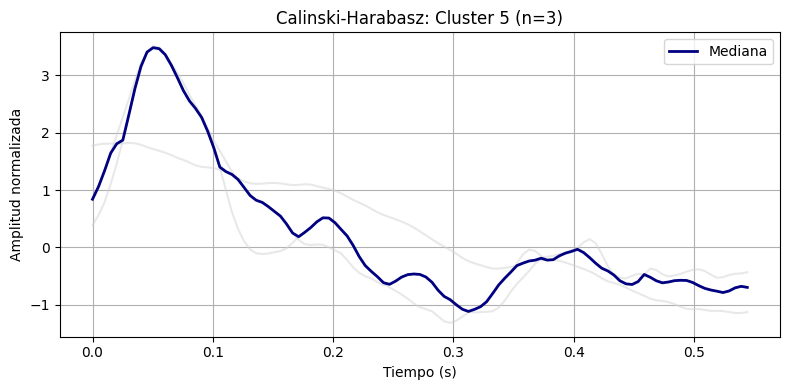

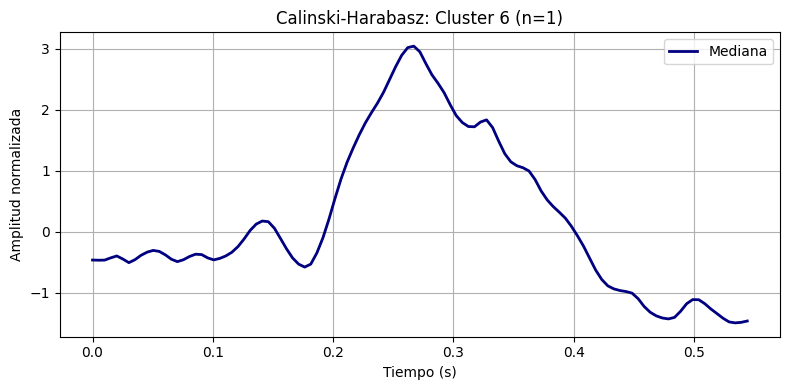


🔹 Dunn -> K óptimo: 2


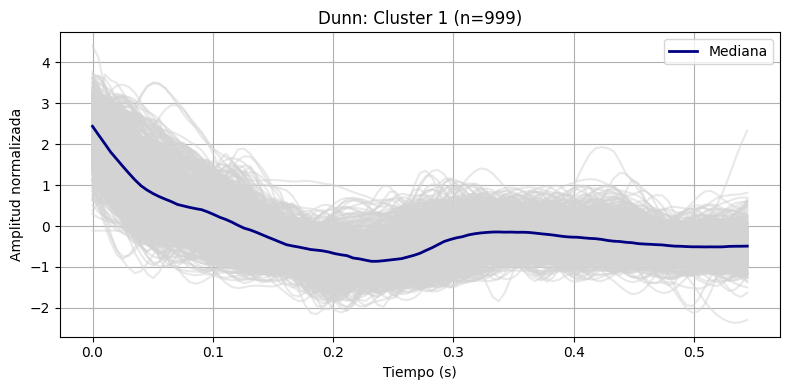

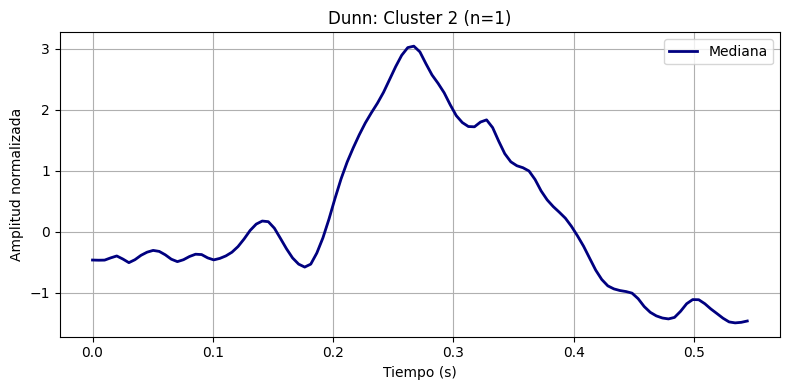

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from tslearn.metrics import cdist_dtw
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.spatial.distance import pdist
from collections import defaultdict

# Frecuencia de muestreo en Hz
fs = 198.46762

# Dunn Index personalizado
def dunn_index(X, labels):
    unique_clusters = np.unique(labels)
    intra_dists = []
    inter_dists = []

    for i in unique_clusters:
        cluster_i = X[labels == i]
        if len(cluster_i) < 2:
            intra_dists.append(0)
        else:
            intra_dists.append(np.max(pdist(cluster_i)))

        for j in unique_clusters:
            if i < j:
                cluster_j = X[labels == j]
                inter_d = np.min([np.linalg.norm(a - b) for a in cluster_i for b in cluster_j])
                inter_dists.append(inter_d)

    return np.min(inter_dists) / np.max(intra_dists)

# 1. Matriz de segmentos
segment_matrix = np.stack(v_segments['Segment_partial'].sample(n=1000, random_state=42).values)

# 2. Matriz de distancias DTW
print("Calculando matriz de distancias DTW con ventana Sakoe-Chiba...")
dtw_distances = cdist_dtw(
    segment_matrix,
    global_constraint="sakoe_chiba",
    sakoe_chiba_radius=int(0.1 * segment_matrix.shape[1])
)

# 3. Clustering jerárquico
print("Realizando clustering jerárquico...")
Z = linkage(dtw_distances, method='average')

# 4. Evaluar múltiples métricas para distintos K
print("Evaluando diferentes métricas de calidad para K = 2 a 7...")
max_k = 7
metrics_table = []

for k in range(2, max_k + 1):
    labels = fcluster(Z, k, criterion='maxclust')

    silhouette = silhouette_score(dtw_distances, labels, metric='precomputed')
    dbi = davies_bouldin_score(segment_matrix, labels)
    ch = calinski_harabasz_score(segment_matrix, labels)
    dunn = dunn_index(segment_matrix, labels)

    metrics_table.append({
        'K': k,
        'Silhouette': silhouette,
        'Davies-Bouldin': dbi,
        'Calinski-Harabasz': ch,
        'Dunn': dunn
    })
    print(f"K={k}: Silhouette={silhouette:.4f}, DBI={dbi:.4f}, CH={ch:.2f}, Dunn={dunn:.4f}")

# 5. Convertir a DataFrame y visualizar métricas
df_metrics = pd.DataFrame(metrics_table)

# 6. Visualización de métricas
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
df_metrics.plot(x='K', y='Silhouette', marker='o', ax=axes[0, 0], title='Silhouette Score')
df_metrics.plot(x='K', y='Davies-Bouldin', marker='o', ax=axes[0, 1], title='Davies-Bouldin Index')
df_metrics.plot(x='K', y='Calinski-Harabasz', marker='o', ax=axes[1, 0], title='Calinski-Harabasz Score')
df_metrics.plot(x='K', y='Dunn', marker='o', ax=axes[1, 1], title='Dunn Index')
for ax in axes.flat:
    ax.set_xlabel("Número de clusters (K)")
    ax.grid(True)
plt.tight_layout()
plt.show()

# 7. Diccionario para almacenar los mejores K según cada métrica
best_k_dict = {
    'Silhouette': df_metrics.loc[df_metrics['Silhouette'].idxmax(), 'K'],
    'Davies-Bouldin': df_metrics.loc[df_metrics['Davies-Bouldin'].idxmin(), 'K'],
    'Calinski-Harabasz': df_metrics.loc[df_metrics['Calinski-Harabasz'].idxmax(), 'K'],
    'Dunn': df_metrics.loc[df_metrics['Dunn'].idxmax(), 'K']
}

# 8. Plot de señales por cluster para el K óptimo de cada métrica
for metric, best_k in best_k_dict.items():
    print(f"\n🔹 {metric} -> K óptimo: {int(best_k)}")
    labels = fcluster(Z, best_k, criterion='maxclust')

    for cluster_id in np.unique(labels):
        cluster_segments = segment_matrix[labels == cluster_id]
        if len(cluster_segments) < 1:
            continue

        median_curve = np.median(cluster_segments, axis=0)
        time_vector = np.arange(cluster_segments.shape[1]) / fs

        plt.figure(figsize=(4, 3))
        for seg in cluster_segments:
            plt.plot(time_vector, seg, color='lightgray', alpha=0.5)
        plt.plot(time_vector, median_curve, color='navy', linewidth=2.0, label='Mediana')
        plt.title(f"{metric}: Cluster {cluster_id} (n={len(cluster_segments)})")
        plt.xlabel("Tiempo (s)")
        plt.ylabel("Amplitud normalizada")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()


Calculando matriz de distancias DTW...
Realizando clustering jerárquico...


<ipython-input-64-be18f8f805dd>:31: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dtw_distances, method='average')



🔹 K = 2


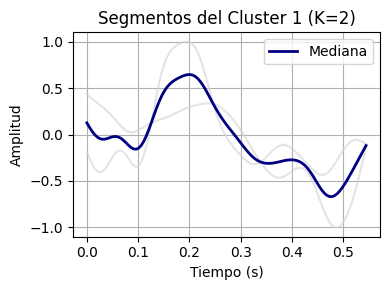

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


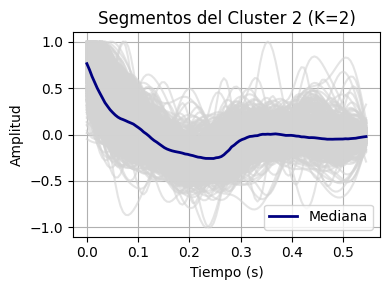

📏 Distancia promedio intracluster (K=2): 2.5729

🔹 K = 3


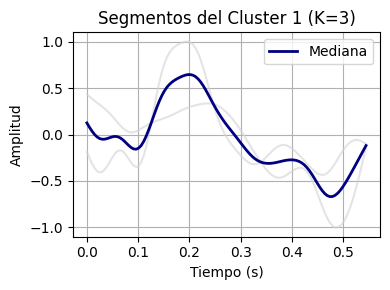

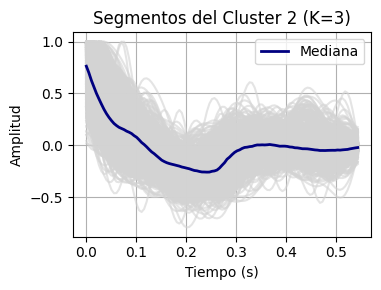

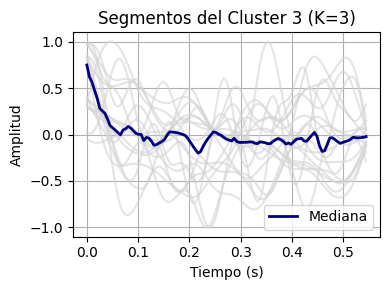

📏 Distancia promedio intracluster (K=3): 2.9595

🔹 K = 4


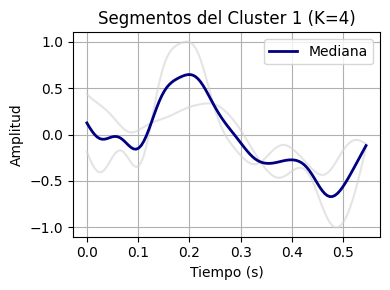

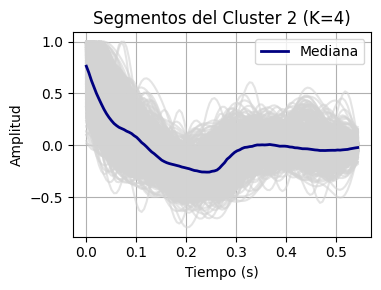

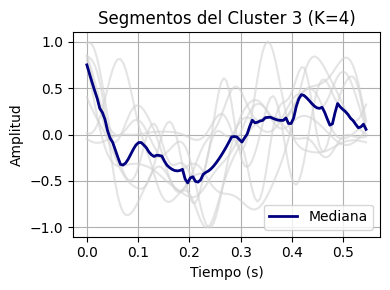

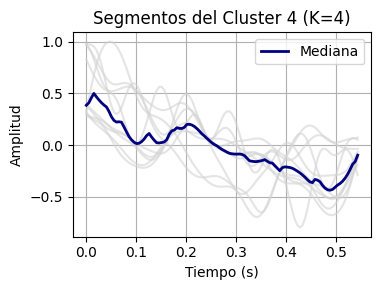

📏 Distancia promedio intracluster (K=4): 2.6921

🔹 K = 5


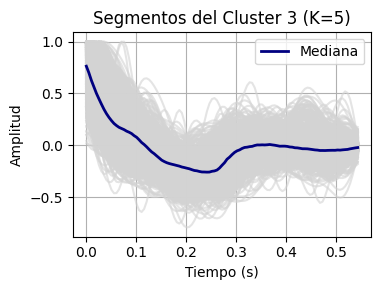

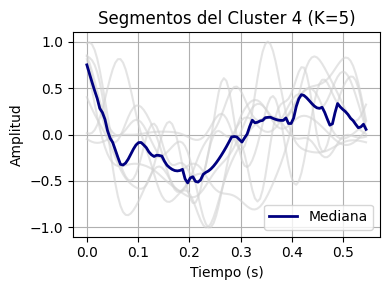

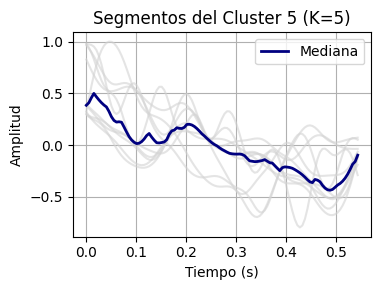

📏 Distancia promedio intracluster (K=5): 2.3008

🔹 K = 6


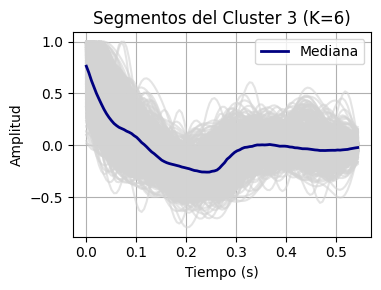

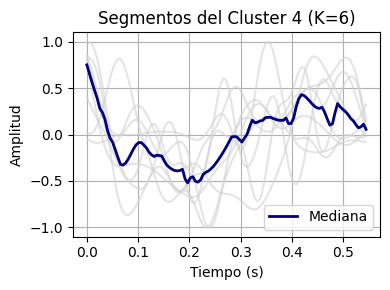

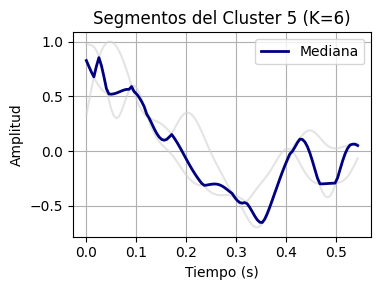

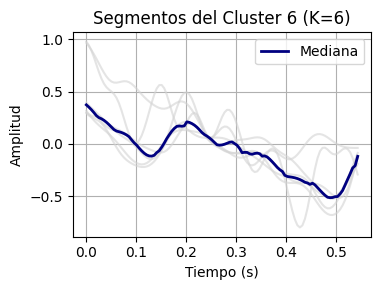

📏 Distancia promedio intracluster (K=6): 1.9890


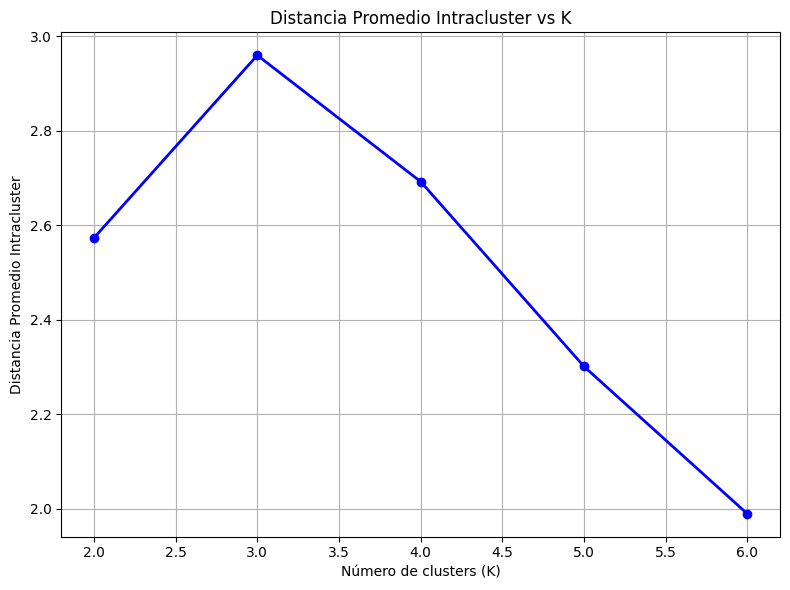

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, fcluster
from tslearn.metrics import cdist_dtw
from itertools import combinations

# Configuración
fs = 198.46762  # Frecuencia de muestreo en Hz
k_max = 6       # Número máximo de clusters a evaluar

# 1. Selección aleatoria de 1000 segmentos
v_segments_sample = v_segments['Segment_partial'].sample(n=1000, random_state=42).reset_index(drop=True)

# 2. Crear matriz de segmentos
segment_matrix = np.stack(v_segments_sample.values)

# 3. Vector de tiempo para graficar
time_vector = np.arange(segment_matrix.shape[1]) / fs

# 4. Calcular matriz de distancias DTW con restricción Sakoe-Chiba
print("Calculando matriz de distancias DTW...")
dtw_distances = cdist_dtw(
    segment_matrix,
    global_constraint="sakoe_chiba",
    sakoe_chiba_radius=int(0.1 * segment_matrix.shape[1])
)

# 5. Clustering jerárquico
print("Realizando clustering jerárquico...")
Z = linkage(dtw_distances, method='average')

# Para almacenar las distancias promedio por cada K
avg_intracluster_distances = []

# 6. Iterar sobre valores de k
for k in range(2, k_max + 1):
    print(f"\n🔹 K = {k}")

    # Obtener etiquetas
    labels = fcluster(Z, k, criterion='maxclust')

    intracluster_distances = []

    for cluster_id in range(1, k + 1):
        cluster_indices = np.where(labels == cluster_id)[0]
        cluster_segments = segment_matrix[cluster_indices]

        if len(cluster_segments) < 2:
            continue  # No se puede calcular distancia si hay 1 o 0 segmentos

        # Extraer submatriz de distancias intra-cluster
        pairwise_dists = [
            dtw_distances[i, j]
            for i, j in combinations(cluster_indices, 2)
        ]
        avg_dist = np.mean(pairwise_dists)
        intracluster_distances.append(avg_dist)

        # Gráfica del cluster
        representative = np.median(cluster_segments, axis=0)
        plt.figure(figsize=(4, 3))
        for segment in cluster_segments:
            plt.plot(time_vector, segment, color='lightgray', alpha=0.6)
        plt.plot(time_vector, representative, color='navy', linewidth=2, label='Mediana')
        plt.title(f'Segmentos del Cluster {cluster_id} (K={k})')
        plt.xlabel('Tiempo (s)')
        plt.ylabel('Amplitud')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Reporte de distancia promedio intracluster
    if intracluster_distances:
        avg_dist = np.mean(intracluster_distances)
        avg_intracluster_distances.append(avg_dist)
        print(f"📏 Distancia promedio intracluster (K={k}): {avg_dist:.4f}")
    else:
        print(f"⚠️ No se pudo calcular distancia intracluster (muy pocos segmentos por cluster).")

# 7. Graficar distancia promedio intracluster vs K
plt.figure(figsize=(8, 6))
plt.plot(range(2, k_max + 1), avg_intracluster_distances, marker='o', color='b', linestyle='-', linewidth=2)
plt.title('Distancia Promedio Intracluster vs K')
plt.xlabel('Número de clusters (K)')
plt.ylabel('Distancia Promedio Intracluster')
plt.grid(True)
plt.tight_layout()
plt.show()


Vemos que para ambos casos hay algo que no está funcionando muy bien ya que la mayoría de clusters están conformados por muy pocos segmentos y después hay un cluster que incluye la mayor parte de los segmentos.